<a href="https://colab.research.google.com/github/pandeychetanya/HalloweenFlutter/blob/main/main_seq_bulk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

import sys

!{sys.executable} -m pip uninstall -y numpy scipy
!{sys.executable} -m pip install --no-cache-dir "numpy==2.0.2" "scipy==1.16.3"

print("STOP HERE. Now go to Runtime → Restart runtime, then run the next setup cell.")

Found existing installation: numpy 2.0.2
Uninstalling numpy-2.0.2:
  Successfully uninstalled numpy-2.0.2
Found existing installation: scipy 1.16.3
Uninstalling scipy-1.16.3:
  Successfully uninstalled scipy-1.16.3
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 120.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 265.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.2/19.2 MB 113.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 150.6 MB/s eta 0:00:00
STOP HERE. Now go to Runtime → Restart runtime, then run the next setup cell.


In [4]:
import sys
import os
import importlib
from pathlib import Path

import numpy as np
import pandas as pd

from google.colab import drive

# -------------------------
# 0. Mount Drive
# -------------------------


# drive.flush_and_unmount()

drive.mount("/content/drive", force_remount=True)

# -------------------------
# 1. Install dependencies
# -------------------------

!{sys.executable} -m pip install -q --force-reinstall "numpy<2.1,>=1.22" "pandas==2.2.2"
!{sys.executable} -m pip uninstall -y eyelinkio
!{sys.executable} -m pip install -q --no-deps --force-reinstall git+https://github.com/pandeychetanya/eyelinkio.git@chetanyaedits

# -------------------------
# 2. Add eyeprocess repo
# -------------------------

REPO_DIR = Path("/content/drive/MyDrive/eyeprocess")

assert REPO_DIR.exists(), f"Missing repo folder: {REPO_DIR}"

if str(REPO_DIR) not in sys.path:
    sys.path.insert(0, str(REPO_DIR))

importlib.invalidate_caches()

# -------------------------
# 3. Imports from eyeprocess
# -------------------------

from eyeprocess.utils.psychopy import el2deg
from eyeprocess.utils.saccades import SegmentationParams, eye_movement_segmentation
from eyeprocess.utils.main_sequence_helpers import (
    read_edf_like_pyedfread,
    load_behav_json,
    build_calib_params,
    parse_trials_from_messages,
    get_affine_for_trial,
)

print("Imports worked.")



# -------------------------
# 4. Paths
# -------------------------

DATA_ROOT = Path("/content/drive/MyDrive/steer_search_PD/steer-search-PD")
assert DATA_ROOT.exists(), f"Missing DATA_ROOT: {DATA_ROOT}"

OUT_DIR = Path("/content/drive/MyDrive/steer_search_PD/main_sequence_outputs")
OUT_DIR.mkdir(parents=True, exist_ok=True)

print("DATA_ROOT:", DATA_ROOT)
print("OUT_DIR:", OUT_DIR)

# -------------------------
# 5. Process one trial
# -------------------------

def process_one_trial_for_main_sequence(
    trial_row,
    samples,
    events,
    calib_params,
    subject_id,
    group,
    block_id,
    min_saccade_speed_deg_s=30.0,
):
    t_trial_start = float(trial_row["image_onset_ms"])
    t_trial_end = float(trial_row["response_ms"])
    trial_num = int(trial_row["trial"])

    trial_mask = (
        (samples["time"].astype(float).values >= t_trial_start) &
        (samples["time"].astype(float).values <= t_trial_end)
    )

    samples_trial = samples.loc[trial_mask].copy().reset_index(drop=True)

    if len(samples_trial) < 20:
        raise RuntimeError(f"Too few samples in trial window: {len(samples_trial)}")

    time_ms_trial = samples_trial["time"].to_numpy(dtype=float)

    calib_session_id, affine = get_affine_for_trial(calib_params, trial_num)

    x_pix = samples_trial["gx_left"].to_numpy(dtype=float)
    y_pix = samples_trial["gy_left"].to_numpy(dtype=float)

    x_deg, y_deg = el2deg(x_pix, y_pix)

    xy_calib = affine.transform(np.column_stack([x_deg, y_deg]))

    x = xy_calib[:, 0].astype(float).copy()
    y = xy_calib[:, 1].astype(float).copy()

    blinks_trial = events[
        (events["type"] == "blink") &
        (events["end"].astype(float).values >= t_trial_start) &
        (events["start"].astype(float).values <= t_trial_end)
    ].copy().reset_index(drop=True)

    n_blink_samples = 0

    for _, blink_row in blinks_trial.iterrows():
        blink_idx = (
            (float(blink_row["start"]) <= time_ms_trial) &
            (time_ms_trial <= float(blink_row["end"]))
        )

        x[blink_idx] = np.nan
        y[blink_idx] = np.nan
        n_blink_samples += int(blink_idx.sum())

    valid_fraction = float(np.isfinite(x).mean())

    #estimate sampling rate

    fs = float(round(1000.0 / np.nanmedian(np.diff(time_ms_trial))))

    params = SegmentationParams(
        fs=fs,
        winsize=13,
        min_saccade_speed=min_saccade_speed_deg_s / 60.0,
        start_vel=30.0 / 60.0,
        min_peak_prominence=30.0 / 60.0,
        drift_min_duration_ms=100.0,
    )

    result = eye_movement_segmentation(
        x,
        y,
        params,
        return_speed=True,
    )

    saccade_rows = []

    for i, s in enumerate(result.saccades):
        prev_s = result.saccades[i - 1] if i > 0 else None

        saccade_rows.append({
            "subject_id": subject_id,
            "group": group,
            "block_id": block_id,
            "trial": trial_num,
            "image": trial_row["image"],
            "stim_id": trial_row["stim_id"],
            "rt_ms": trial_row["rt_ms"],
            "rt_from_response_ms": trial_row.get("rt_from_response_ms", np.nan),

            "saccade_index": i,
            "start_idx": s.start,
            "stop_idx": s.stop,
            "onset_ms_from_image": time_ms_trial[s.start] - t_trial_start,
            "offset_ms_from_image": time_ms_trial[s.stop] - t_trial_start,
            "duration_ms": s.duration_ms,
            "amplitude_deg": s.amplitude,
            "peak_speed_internal": s.peak_speed,
            "peak_velocity_deg_s": s.peak_speed * 60.0,
            "is_microsaccade": s.is_microsaccade,

            "first_saccade_latency_ms": (
                time_ms_trial[s.start] - t_trial_start if i == 0 else np.nan
            ),

            "inter_saccadic_interval_ms": (
                np.nan if i == 0
                else time_ms_trial[s.start] - time_ms_trial[prev_s.stop]
            ),

            "fs": fs,
            "winsize": params.winsize,
            "min_saccade_speed_deg_s": min_saccade_speed_deg_s,
            "drift_min_duration_ms": params.drift_min_duration_ms,
            "calib_session_id": calib_session_id,
            "n_trial_samples": len(samples_trial),
            "valid_fraction": valid_fraction,
            "blink_fraction": float(np.isnan(x).mean()),
            "n_blink_samples": n_blink_samples,
        })

    fixation_rows = []

    for i, d in enumerate(result.drifts):
        fixation_rows.append({
            "subject_id": subject_id,
            "group": group,
            "block_id": block_id,
            "trial": trial_num,
            "image": trial_row["image"],
            "stim_id": trial_row["stim_id"],

            "fixation_index": i,
            "start_idx": d.start,
            "stop_idx": d.stop,
            "onset_ms_from_image": time_ms_trial[d.start] - t_trial_start,
            "offset_ms_from_image": time_ms_trial[d.stop] - t_trial_start,
            "duration_ms": d.duration_ms,
            "x_deg": float(np.nanmean(d.x_raw)),
            "y_deg": float(np.nanmean(d.y_raw)),
            "mean_speed": d.speed,
        })

    isi_values = [
        r["inter_saccadic_interval_ms"]
        for r in saccade_rows
        if not pd.isna(r["inter_saccadic_interval_ms"])
    ]

    trial_summary = {
        "subject_id": subject_id,
        "group": group,
        "block_id": block_id,
        "trial": trial_num,
        "image": trial_row["image"],
        "stim_id": trial_row["stim_id"],
        "rt_ms": trial_row["rt_ms"],
        "rt_from_response_ms": trial_row.get("rt_from_response_ms", np.nan),
        "n_samples": len(samples_trial),
        "n_saccades": len(result.saccades),
        "n_fixations": len(result.drifts),
        "n_blink_samples": n_blink_samples,
        "valid_fraction": valid_fraction,
        "blink_fraction": float(np.isnan(x).mean()),
        "median_saccade_amp": (
            np.nanmedian([r["amplitude_deg"] for r in saccade_rows])
            if saccade_rows else np.nan
        ),
        "median_peak_velocity": (
            np.nanmedian([r["peak_velocity_deg_s"] for r in saccade_rows])
            if saccade_rows else np.nan
        ),
        "median_saccade_duration": (
            np.nanmedian([r["duration_ms"] for r in saccade_rows])
            if saccade_rows else np.nan
        ),
        "first_saccade_latency_ms": (
            saccade_rows[0]["first_saccade_latency_ms"]
            if saccade_rows else np.nan
        ),
        "median_inter_saccadic_interval_ms": (
            np.nanmedian(isi_values) if len(isi_values) else np.nan
        ),
        "status": "ok",
    }

    return saccade_rows, fixation_rows, trial_summary

Mounted at /content/drive
Found existing installation: eyelinkio 0.3.1.dev8+g077325048
Uninstalling eyelinkio-0.3.1.dev8+g077325048:
  Successfully uninstalled eyelinkio-0.3.1.dev8+g077325048
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
Imports worked.
DATA_ROOT: /content/drive/MyDrive/steer_search_PD/steer-search-PD
OUT_DIR: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs


In [5]:
# all saccades for one subject

# ============================================================
# Run all blocks for one chosen subject
# Output: all_saccades_<SUBJECT_ID>.csv
# ============================================================

SUBJECT_ID = "s189"

from pathlib import Path
import numpy as np
import pandas as pd

DATA_ROOT = Path("/content/drive/MyDrive/steer_search_PD/steer-search-PD")
OUT_DIR = Path("/content/drive/MyDrive/steer_search_PD/main_sequence_outputs/startvel30")
OUT_DIR.mkdir(parents=True, exist_ok=True)

subject_dir = DATA_ROOT / SUBJECT_ID
behav_dir = subject_dir / "behav"
eye_dir = subject_dir / "eye"

assert behav_dir.exists(), f"Missing behav folder: {behav_dir}"
assert eye_dir.exists(), f"Missing eye folder: {eye_dir}"

group = "PD" if SUBJECT_ID.startswith("p") else "Control"

all_saccades = []
all_fixations = []
all_trials = []
failed_trials = []
failed_blocks = []

behav_files = sorted(behav_dir.glob("*.json"))

print("Subject:", SUBJECT_ID)
print("Group:", group)
print("Blocks found:", len(behav_files))

for behav_path in behav_files:
    BLOCK_ID = behav_path.stem
    edf_path = eye_dir / f"{BLOCK_ID}.edf"

    print("\nProcessing block:", BLOCK_ID)

    if not edf_path.exists():
        failed_blocks.append({
            "subject_id": SUBJECT_ID,
            "group": group,
            "block_id": BLOCK_ID,
            "reason": f"Missing EDF: {edf_path}",
        })
        print("  Skipping: missing EDF")
        continue

    try:
        behav = load_behav_json(behav_path)
        samples, events, messages = read_edf_like_pyedfread(edf_path)
        calib_params = build_calib_params(behav)
        print(BLOCK_ID, len(calib_params))
        print(calib_params)
        trials_df = parse_trials_from_messages(messages)

    except Exception as e:
        failed_blocks.append({
            "subject_id": SUBJECT_ID,
            "group": group,
            "block_id": BLOCK_ID,
            "reason": str(e),
        })
        print("  Block failed:", e)
        continue

    for _, trial_row in trials_df.iterrows():
        try:
            saccade_rows, fixation_rows, trial_summary = process_one_trial_for_main_sequence(
                trial_row=trial_row,
                samples=samples,
                events=events,
                calib_params=calib_params,
                subject_id=SUBJECT_ID,
                group=group,
                block_id=BLOCK_ID,
                min_saccade_speed_deg_s=30.0,
            )

            # Make stimulus ID unique across blocks:
            # e.g. 250421_160302_086.jpg
            unique_stim_id = f"{BLOCK_ID}_{trial_row['image']}"

            for r in saccade_rows:
                r["stim_id"] = unique_stim_id

            for r in fixation_rows:
                r["stim_id"] = unique_stim_id

            trial_summary["stim_id"] = unique_stim_id

            all_saccades.extend(saccade_rows)
            all_fixations.extend(fixation_rows)
            all_trials.append(trial_summary)

        except Exception as e:
            failed_trials.append({
                "subject_id": SUBJECT_ID,
                "group": group,
                "block_id": BLOCK_ID,
                "trial": trial_row.get("trial", np.nan),
                "image": trial_row.get("image", np.nan),
                "stim_id": f"{BLOCK_ID}_{trial_row.get('image', np.nan)}",
                "reason": str(e),
            })

all_saccades_subject_df = pd.DataFrame(all_saccades)
all_fixations_subject_df = pd.DataFrame(all_fixations)
all_trials_subject_df = pd.DataFrame(all_trials)
failed_trials_subject_df = pd.DataFrame(failed_trials)
failed_blocks_subject_df = pd.DataFrame(failed_blocks)

all_saccades_path = OUT_DIR / f"all_saccades_{SUBJECT_ID}.csv"
all_fixations_path = OUT_DIR / f"all_fixations_{SUBJECT_ID}.csv"
all_trials_path = OUT_DIR / f"all_trials_{SUBJECT_ID}.csv"
failed_trials_path = OUT_DIR / f"failed_trials_{SUBJECT_ID}.csv"
failed_blocks_path = OUT_DIR / f"failed_blocks_{SUBJECT_ID}.csv"

all_saccades_subject_df.to_csv(all_saccades_path, index=False)
all_fixations_subject_df.to_csv(all_fixations_path, index=False)
all_trials_subject_df.to_csv(all_trials_path, index=False)
failed_trials_subject_df.to_csv(failed_trials_path, index=False)
failed_blocks_subject_df.to_csv(failed_blocks_path, index=False)

print("\nDone")
print("Saccades:", len(all_saccades_subject_df))
print("Fixations:", len(all_fixations_subject_df))
print("Trials:", len(all_trials_subject_df))
print("Failed trials:", len(failed_trials_subject_df))
print("Failed blocks:", len(failed_blocks_subject_df))

print("\nSaved:")
print(all_saccades_path)
print(all_fixations_path)
print(all_trials_path)
print(failed_trials_path)
print(failed_blocks_path)

display(all_saccades_subject_df.head())
display(all_trials_subject_df.head())
display(failed_trials_subject_df.head())

Subject: s189
Group: Control
Blocks found: 4

Processing block: 250807_170121
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[0.9961061484355179, 1.2229048761374408, 2.9926430500866847, 7.093681040046502, 1.1008659000837466]
Using session : 0 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 4 is 0.9961061484355179 < 2.0
...converged
Session 1, worst RMSE at position 2 is 1.4793538678149494 < 2.0
...converged
Session 2, worst RMSE at position 13 is 3.337908980810534 > 2.0
...rejecting the data
Session 2, worst RMSE at position 8 is 1.0634218504779767 < 2.0
...converged
Session 3, worst RMSE at position 8 is 8.225189417509116 > 2.0
...rejecting the data
Session 3, worst RMSE at position 14 is 1.8627570978745116 < 2.0
...converged
Session 4, worst RMSE at position 16 is 1.3792018458279716 < 2.0
...converged

Starting consensus calibration...
Session 0, worst RMSE at position 4 is 0.9961061484355179 < 1.0
...conve

,subject_id,group,block_id,trial,image,stim_id,rt_ms,rt_from_response_ms,saccade_index,start_idx,...,inter_saccadic_interval_ms,fs,winsize,min_saccade_speed_deg_s,drift_min_duration_ms,calib_session_id,n_trial_samples,valid_fraction,blink_fraction,n_blink_samples
0,s189,Control,250807_170121,1,044.jpg,250807_170121_044.jpg,2971.0,2970.404,0,232,...,NaN,1000.0,13,30.0,100.0,0,2972,1.0,0.0,0
1,s189,Control,250807_170121,1,044.jpg,250807_170121_044.jpg,2971.0,2970.404,1,497,...,228.0,1000.0,13,30.0,100.0,0,2972,1.0,0.0,0
2,s189,Control,250807_170121,1,044.jpg,250807_170121_044.jpg,2971.0,2970.404,2,649,...,100.0,1000.0,13,30.0,100.0,0,2972,1.0,0.0,0
3,s189,Control,250807_170121,1,044.jpg,250807_170121_044.jpg,2971.0,2970.404,3,1183,...,489.0,1000.0,13,30.0,100.0,0,2972,1.0,0.0,0
4,s189,Control,250807_170121,1,044.jpg,250807_170121_044.jpg,2971.0,2970.404,4,1324,...,87.0,1000.0,13,30.0,100.0,0,2972,1.0,0.0,0


,subject_id,group,block_id,trial,image,stim_id,rt_ms,rt_from_response_ms,n_samples,n_saccades,n_fixations,n_blink_samples,valid_fraction,blink_fraction,median_saccade_amp,median_peak_velocity,median_saccade_duration,first_saccade_latency_ms,median_inter_saccadic_interval_ms,status
0,s189,Control,250807_170121,1,044.jpg,250807_170121_044.jpg,2971.0,2970.404,2972,11,8,0,1.000000,0.000000,13.535991,557.456058,54.0,232.0,137.0,ok
1,s189,Control,250807_170121,2,096.jpg,250807_170121_096.jpg,2379.0,2379.157,2380,6,6,0,1.000000,0.000000,9.428685,476.631278,40.0,297.0,170.0,ok
2,s189,Control,250807_170121,3,084.jpg,250807_170121_084.jpg,933.0,933.406,934,3,3,0,1.000000,0.000000,9.063562,463.432498,33.0,310.0,157.5,ok
3,s189,Control,250807_170121,4,092.jpg,250807_170121_092.jpg,1654.0,1653.306,1655,7,5,0,1.000000,0.000000,12.387548,417.279819,43.0,294.0,126.0,ok
4,s189,Control,250807_170121,5,047.jpg,250807_170121_047.jpg,2077.0,2077.230,2078,6,5,39,0.981232,0.018768,4.198354,342.021482,45.0,91.0,106.0,ok


""


Loaded: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/all_saccades_s189.csv
Rows: 1913
Columns:
['subject_id', 'group', 'block_id', 'trial', 'image', 'stim_id', 'rt_ms', 'rt_from_response_ms', 'saccade_index', 'trace_key', 'start_idx', 'stop_idx', 'onset_ms_from_image', 'offset_ms_from_image', 'duration_ms', 'amplitude_deg', 'peak_speed_internal', 'peak_velocity_deg_s', 'is_microsaccade', 'start_x_deg', 'start_y_deg', 'end_x_deg', 'end_y_deg', 'first_saccade_latency_ms', 'inter_saccadic_interval_ms', 'fs', 'winsize', 'min_saccade_speed_deg_s', 'drift_min_duration_ms', 'calib_session_id', 'n_trial_samples', 'valid_fraction', 'blink_fraction', 'n_blink_samples']

After QC: 1311 saccades

Amplitude-bin summary:


,n,amp_mean,dur_median,dur_min,dur_max
amp_bin,,,,,
"(2.999, 4.0]",185,3.495083,42.0,20.0,81.0
"(4.0, 5.0]",167,4.530733,47.0,20.0,95.0
"(5.0, 6.0]",177,5.493968,53.0,20.0,138.0
"(6.0, 7.0]",154,6.513853,57.0,23.0,81.0
"(7.0, 8.0]",124,7.457115,54.0,25.0,84.0
"(8.0, 9.0]",103,8.473952,55.0,31.0,78.0
"(9.0, 10.0]",82,9.548202,62.0,34.0,96.0
"(10.0, 11.0]",84,10.474750,62.0,36.0,85.0
"(11.0, 12.0]",55,11.481251,57.0,39.0,85.0


/tmp/ipykernel_1972/1088528657.py:161: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.nsmallest(N_PER_BIN, "duration_residual_ms"))
/tmp/ipykernel_1972/1088528657.py:169: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.nlargest(N_PER_BIN, "duration_residual_ms"))



Selected exact upper/lower band points:


,selected_row,band,trace_key,subject_id,group,block_id,trial,image,stim_id,saccade_index,start_idx,stop_idx,onset_ms_from_image,offset_ms_from_image,amplitude_deg,duration_ms,peak_velocity_deg_s,duration_residual_ms,bin_median_duration_ms,amp_bin
0,0,lower,s189|250807_170121|29|3,s189,Control,250807_170121,29,014.jpg,250807_170121_014.jpg,3,595,615,595.0,615.0,3.368152,20.0,262.275406,-22.0,42.0,"(2.999, 4.0]"
1,1,upper,s189|250807_170121|60|1,s189,Control,250807_170121,60,083.jpg,250807_170121_083.jpg,1,165,246,165.0,246.0,3.891278,81.0,291.329446,39.0,42.0,"(2.999, 4.0]"
2,2,upper,s189|250807_171455|64|0,s189,Control,250807_171455,64,064.jpg,250807_171455_064.jpg,0,54,149,54.0,149.0,4.094203,95.0,284.911240,48.0,47.0,"(4.0, 5.0]"
3,3,lower,s189|250807_172925|90|0,s189,Control,250807_172925,90,078.jpg,250807_172925_078.jpg,0,15,35,15.0,35.0,4.667781,20.0,399.049888,-27.0,47.0,"(4.0, 5.0]"
4,4,lower,s189|250807_170121|10|10,s189,Control,250807_170121,10,037.jpg,250807_170121_037.jpg,10,2311,2331,2311.0,2331.0,5.209964,20.0,398.998904,-33.0,53.0,"(5.0, 6.0]"
5,5,upper,s189|250807_172307|8|0,s189,Control,250807_172307,8,086.jpg,250807_172307_086.jpg,0,275,413,275.0,413.0,5.604632,138.0,543.418163,85.0,53.0,"(5.0, 6.0]"
6,6,lower,s189|250807_170121|52|4,s189,Control,250807_170121,52,094.jpg,250807_170121_094.jpg,4,1150,1173,1150.0,1173.0,6.813791,23.0,460.392600,-34.0,57.0,"(6.0, 7.0]"
7,7,upper,s189|250807_172925|61|0,s189,Control,250807_172925,61,077.jpg,250807_172925_077.jpg,0,12,93,12.0,93.0,6.880479,81.0,422.328355,24.0,57.0,"(6.0, 7.0]"
8,8,lower,s189|250807_172925|66|7,s189,Control,250807_172925,66,071.jpg,250807_172925_071.jpg,7,2459,2484,2459.0,2484.0,7.260877,25.0,499.230599,-29.0,54.0,"(7.0, 8.0]"
9,9,upper,s189|250807_171455|99|0,s189,Control,250807_171455,99,068.jpg,250807_171455_068.jpg,0,210,294,210.0,294.0,7.906424,84.0,472.366487,30.0,54.0,"(7.0, 8.0]"



Saved selected rows to:
/content/drive/MyDrive/steer_search_PD/main_sequence_outputs/s189_two_band_selected_points/s189_selected_upper_lower_band_points.csv
Saved plot: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/s189_two_band_selected_points/s189_selected_upper_lower_amp_duration.png


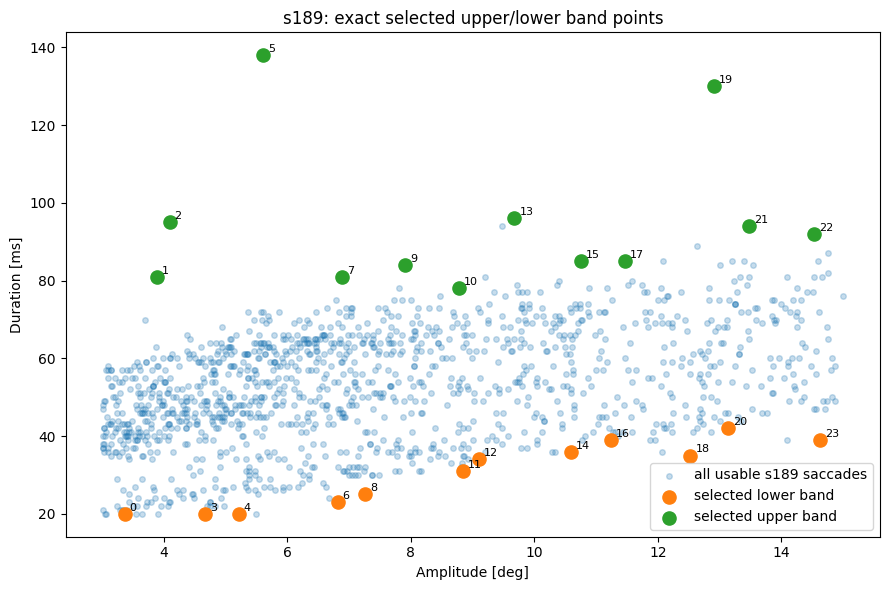

Saved plot: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/s189_two_band_selected_points/s189_selected_points_amp_velocity.png


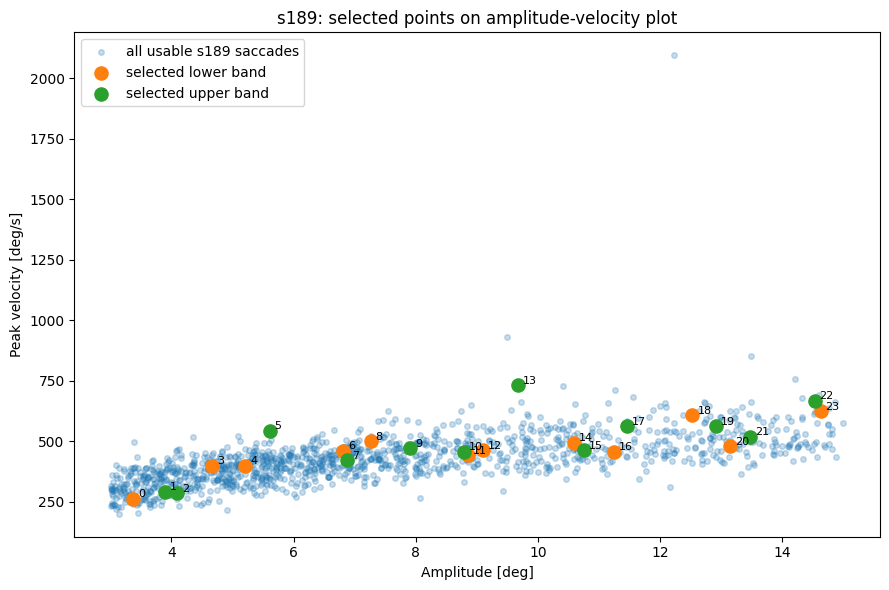


Copy these into your per-trial notebook one row at a time:
--------------------------------------------------------
# selected_row=0 | lower band | amp=3.37, dur=20.0, peak=262.3
SUBJECT_ID = "s189"
BLOCK_ID = "250807_170121"
target_image = "014.jpg"
TARGET_TRIAL = 29
TARGET_SACCADE_INDEX = 3
CSV_START_IDX = 595
CSV_STOP_IDX = 615

# selected_row=1 | upper band | amp=3.89, dur=81.0, peak=291.3
SUBJECT_ID = "s189"
BLOCK_ID = "250807_170121"
target_image = "083.jpg"
TARGET_TRIAL = 60
TARGET_SACCADE_INDEX = 1
CSV_START_IDX = 165
CSV_STOP_IDX = 246

# selected_row=2 | upper band | amp=4.09, dur=95.0, peak=284.9
SUBJECT_ID = "s189"
BLOCK_ID = "250807_171455"
target_image = "064.jpg"
TARGET_TRIAL = 64
TARGET_SACCADE_INDEX = 0
CSV_START_IDX = 54
CSV_STOP_IDX = 149

# selected_row=3 | lower band | amp=4.67, dur=20.0, peak=399.0
SUBJECT_ID = "s189"
BLOCK_ID = "250807_172925"
target_image = "078.jpg"
TARGET_TRIAL = 90
TARGET_SACCADE_INDEX = 0
CSV_START_IDX = 15
CSV_STOP_IDX = 35

# selected_row

In [17]:
# ============================================================
# STEP 1: Pick exact upper/lower band points from all_saccades_s189.csv
# Amplitude vs duration two-band problem
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Config
# -------------------------

SUBJECT_ID = "s189"

OUT_DIR = Path("/content/drive/MyDrive/steer_search_PD/main_sequence_outputs")
csv_path = OUT_DIR / f"all_saccades_{SUBJECT_ID}.csv"

FIG_DIR = OUT_DIR / f"{SUBJECT_ID}_two_band_selected_points"
FIG_DIR.mkdir(parents=True, exist_ok=True)

selected_csv_path = FIG_DIR / f"{SUBJECT_ID}_selected_upper_lower_band_points.csv"

# Choose amplitude range where the two bands are visible
AMP_LO = 3.0
AMP_HI = 15.0
BIN_WIDTH = 1.0

# Pick this many upper/lower examples per amplitude bin
N_PER_BIN = 1

# Basic QC
MIN_AMP = 1.0
MAX_AMP = 25.0
MIN_DUR = 10.0
MAX_DUR = 140.0

REMOVE_MICROSACCADES = True

# -------------------------
# Load all saccades
# -------------------------

df = pd.read_csv(csv_path)

print("Loaded:", csv_path)
print("Rows:", len(df))
print("Columns:")
print(df.columns.tolist())

required_cols = [
    "subject_id",
    "group",
    "block_id",
    "trial",
    "image",
    "stim_id",
    "saccade_index",
    "start_idx",
    "stop_idx",
    "duration_ms",
    "amplitude_deg",
    "peak_velocity_deg_s",
]

missing = [c for c in required_cols if c not in df.columns]
if missing:
    raise ValueError(f"Missing columns: {missing}")

# -------------------------
# Clean/QC
# -------------------------

d = df.copy()

d = d[d["subject_id"].astype(str) == SUBJECT_ID].copy()

d = d[
    np.isfinite(d["amplitude_deg"]) &
    np.isfinite(d["duration_ms"]) &
    np.isfinite(d["peak_velocity_deg_s"]) &
    np.isfinite(d["start_idx"]) &
    np.isfinite(d["stop_idx"])
].copy()

d = d[
    (d["amplitude_deg"] >= MIN_AMP) &
    (d["amplitude_deg"] <= MAX_AMP) &
    (d["duration_ms"] >= MIN_DUR) &
    (d["duration_ms"] <= MAX_DUR)
].copy()

if REMOVE_MICROSACCADES and "is_microsaccade" in d.columns:
    if d["is_microsaccade"].dtype == bool:
        d = d[~d["is_microsaccade"]].copy()
    else:
        d = d[
            ~d["is_microsaccade"]
            .astype(str)
            .str.lower()
            .isin(["true", "1", "yes"])
        ].copy()

# Focus on amplitude range where bands are visible
d = d[
    (d["amplitude_deg"] >= AMP_LO) &
    (d["amplitude_deg"] <= AMP_HI)
].copy()

print("\nAfter QC:", len(d), "saccades")

# -------------------------
# Bin by amplitude
# -------------------------

bins = np.arange(AMP_LO, AMP_HI + BIN_WIDTH, BIN_WIDTH)

d["amp_bin"] = pd.cut(
    d["amplitude_deg"],
    bins=bins,
    include_lowest=True,
)

# Within each amplitude bin, define upper/lower by duration residual
d["bin_median_duration_ms"] = (
    d.groupby("amp_bin", observed=True)["duration_ms"]
     .transform("median")
)

d["duration_residual_ms"] = d["duration_ms"] - d["bin_median_duration_ms"]

d["bin_n"] = (
    d.groupby("amp_bin", observed=True)["duration_ms"]
     .transform("size")
)

# Keep only bins with enough points
min_bin_n = max(6, 2 * N_PER_BIN)
d = d[d["bin_n"] >= min_bin_n].copy()

print("\nAmplitude-bin summary:")
display(
    d.groupby("amp_bin", observed=True)
     .agg(
         n=("duration_ms", "size"),
         amp_mean=("amplitude_deg", "mean"),
         dur_median=("duration_ms", "median"),
         dur_min=("duration_ms", "min"),
         dur_max=("duration_ms", "max"),
     )
)

# -------------------------
# Select lower and upper band points
# -------------------------

# lower band = shorter duration than bin median
lower_band = (
    d.groupby("amp_bin", observed=True, group_keys=False)
     .apply(lambda g: g.nsmallest(N_PER_BIN, "duration_residual_ms"))
     .copy()
)
lower_band["band"] = "lower"

# upper band = longer duration than bin median
upper_band = (
    d.groupby("amp_bin", observed=True, group_keys=False)
     .apply(lambda g: g.nlargest(N_PER_BIN, "duration_residual_ms"))
     .copy()
)
upper_band["band"] = "upper"

selected = pd.concat([lower_band, upper_band], ignore_index=True)

# Make exact lookup key for your per-trial notebook
selected["trace_key"] = (
    selected["subject_id"].astype(str) + "|" +
    selected["block_id"].astype(str) + "|" +
    selected["trial"].astype(int).astype(str) + "|" +
    selected["saccade_index"].astype(int).astype(str)
)

selected = selected.sort_values(
    ["amplitude_deg", "band", "duration_ms"]
).reset_index(drop=True)

selected["selected_row"] = np.arange(len(selected))

# -------------------------
# Display exact rows to inspect
# -------------------------

inspect_cols = [
    "selected_row",
    "band",
    "trace_key",
    "subject_id",
    "group",
    "block_id",
    "trial",
    "image",
    "stim_id",
    "saccade_index",
    "start_idx",
    "stop_idx",
    "onset_ms_from_image",
    "offset_ms_from_image",
    "amplitude_deg",
    "duration_ms",
    "peak_velocity_deg_s",
    "duration_residual_ms",
    "bin_median_duration_ms",
    "amp_bin",
]

inspect_cols = [c for c in inspect_cols if c in selected.columns]

print("\nSelected exact upper/lower band points:")
display(selected[inspect_cols])

# Save selected rows
selected.to_csv(selected_csv_path, index=False)
print("\nSaved selected rows to:")
print(selected_csv_path)

# -------------------------
# Plot amplitude-duration selected points
# -------------------------

plt.figure(figsize=(9, 6))

plt.scatter(
    d["amplitude_deg"],
    d["duration_ms"],
    s=16,
    alpha=0.25,
    label="all usable s189 saccades",
)

plt.scatter(
    lower_band["amplitude_deg"],
    lower_band["duration_ms"],
    s=90,
    label="selected lower band",
)

plt.scatter(
    upper_band["amplitude_deg"],
    upper_band["duration_ms"],
    s=90,
    label="selected upper band",
)

# Label selected points by selected_row
for _, r in selected.iterrows():
    plt.text(
        r["amplitude_deg"] + 0.08,
        r["duration_ms"] + 0.8,
        str(int(r["selected_row"])),
        fontsize=8,
    )

plt.xlabel("Amplitude [deg]")
plt.ylabel("Duration [ms]")
plt.title(f"{SUBJECT_ID}: exact selected upper/lower band points")
plt.legend()
plt.tight_layout()

fig_path = FIG_DIR / f"{SUBJECT_ID}_selected_upper_lower_amp_duration.png"
plt.savefig(fig_path, dpi=200)
print("Saved plot:", fig_path)

plt.show()

# -------------------------
# Also show same selected points on amplitude-velocity plot
# -------------------------

plt.figure(figsize=(9, 6))

plt.scatter(
    d["amplitude_deg"],
    d["peak_velocity_deg_s"],
    s=16,
    alpha=0.25,
    label="all usable s189 saccades",
)

plt.scatter(
    lower_band["amplitude_deg"],
    lower_band["peak_velocity_deg_s"],
    s=90,
    label="selected lower band",
)

plt.scatter(
    upper_band["amplitude_deg"],
    upper_band["peak_velocity_deg_s"],
    s=90,
    label="selected upper band",
)

for _, r in selected.iterrows():
    plt.text(
        r["amplitude_deg"] + 0.08,
        r["peak_velocity_deg_s"] + 5,
        str(int(r["selected_row"])),
        fontsize=8,
    )

plt.xlabel("Amplitude [deg]")
plt.ylabel("Peak velocity [deg/s]")
plt.title(f"{SUBJECT_ID}: selected points on amplitude-velocity plot")
plt.legend()
plt.tight_layout()

fig_path = FIG_DIR / f"{SUBJECT_ID}_selected_points_amp_velocity.png"
plt.savefig(fig_path, dpi=200)
print("Saved plot:", fig_path)

plt.show()

# -------------------------
# Print copy-paste commands for step 2
# -------------------------

print("\nCopy these into your per-trial notebook one row at a time:")
print("--------------------------------------------------------")

for _, r in selected.iterrows():
    print(
        f"# selected_row={int(r['selected_row'])} | {r['band']} band | "
        f"amp={r['amplitude_deg']:.2f}, dur={r['duration_ms']:.1f}, "
        f"peak={r['peak_velocity_deg_s']:.1f}"
    )
    print(f'SUBJECT_ID = "{r["subject_id"]}"')
    print(f'BLOCK_ID = "{r["block_id"]}"')
    print(f'target_image = "{r["image"]}"')
    print(f"TARGET_TRIAL = {int(r['trial'])}")
    print(f"TARGET_SACCADE_INDEX = {int(r['saccade_index'])}")
    print(f"CSV_START_IDX = {int(r['start_idx'])}")
    print(f"CSV_STOP_IDX = {int(r['stop_idx'])}")
    print()

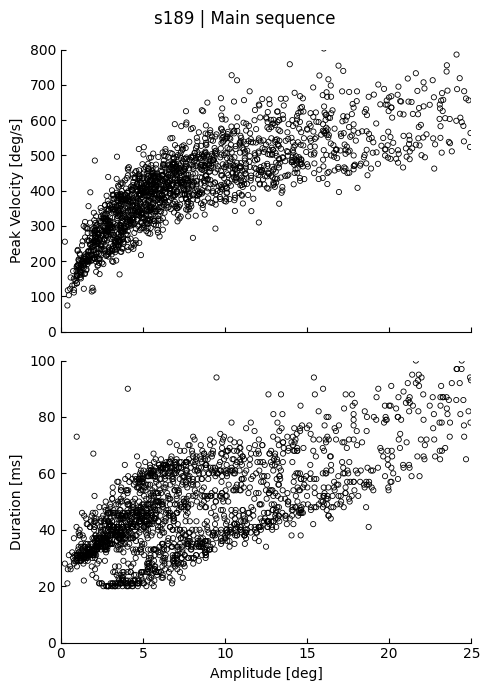

n saccades: 1827
calib_session_id
0    219
1    432
2    447
3    459
4    270
Name: count, dtype: int64
count    100.000000
mean      18.270000
std        3.912825
min        8.000000
25%       15.000000
50%       18.000000
75%       21.000000
max       27.000000
dtype: float64


In [7]:
#plotting main sequence for one subject

# ============================================================
# Plot main sequence for one subject from all_saccades_<SUBJECT_ID>.csv
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

SUBJECT_ID = "s189"

OUT_DIR = Path("/content/drive/MyDrive/steer_search_PD/main_sequence_outputs/startvel30")
csv_path = OUT_DIR / f"all_saccades_{SUBJECT_ID}.csv"

df = pd.read_csv(csv_path)

# optional QC
df = df[
    (df["amplitude_deg"] > 0) &
    (df["duration_ms"] > 0) &
    (df["peak_velocity_deg_s"] > 0) &
    (df["amplitude_deg"] <= 25)
].copy()

fig, axes = plt.subplots(
    2, 1,
    figsize=(5, 7),
    sharex=True
)

# Top: amplitude vs peak velocity
axes[0].scatter(
    df["amplitude_deg"],
    df["peak_velocity_deg_s"],
    s=14,
    facecolors="none",
    edgecolors="black",
    linewidths=0.6,
)

axes[0].set_ylabel("Peak Velocity [deg/s]")
axes[0].set_ylim(0, 800)
axes[0].set_xlim(0, 25)

# Bottom: amplitude vs duration
axes[1].scatter(
    df["amplitude_deg"],
    df["duration_ms"],
    s=14,
    facecolors="none",
    edgecolors="black",
    linewidths=0.6,
)

axes[1].set_xlabel("Amplitude [deg]")
axes[1].set_ylabel("Duration [ms]")
axes[1].set_ylim(0, 100)
axes[1].set_xlim(0, 25)

for ax in axes:
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(direction="in")
    ax.set_xticks([0, 5, 10, 15, 20, 25])

fig.suptitle(f"{SUBJECT_ID} | Main sequence", y=0.98)

plt.tight_layout()
plt.show()

print("n saccades:", len(df))
print(df["calib_session_id"].value_counts().sort_index())
print(df.groupby("trial").size().describe())

In [5]:
# generate all_saccades_subject name

# ============================================================
# Generate all_saccades_<SUBJECT>.csv for ALL subjects
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np

DATA_ROOT = Path("/content/drive/MyDrive/steer_search_PD/steer-search-PD")
OUT_DIR = Path("/content/drive/MyDrive/steer_search_PD/main_sequence_outputs")
OUT_DIR.mkdir(parents=True, exist_ok=True)

subject_dirs = sorted(
    d for d in DATA_ROOT.iterdir()
    if d.is_dir() and (d.name.startswith("p") or d.name.startswith("s"))
)

print(f"Found {len(subject_dirs)} subjects.")

for subject_dir in subject_dirs:

    SUBJECT_ID = subject_dir.name
    print(f"\n========== {SUBJECT_ID} ==========")

    behav_dir = subject_dir / "behav"
    eye_dir = subject_dir / "eye"

    if not behav_dir.exists() or not eye_dir.exists():
        print("Missing behav or eye folder. Skipping.")
        continue

    group = "PD" if SUBJECT_ID.startswith("p") else "Control"

    all_saccades = []
    all_fixations = []
    all_trials = []
    failed_trials = []
    failed_blocks = []

    behav_files = sorted(behav_dir.glob("*.json"))

    for behav_path in behav_files:

      BLOCK_ID = behav_path.stem
      edf_path = eye_dir / f"{BLOCK_ID}.edf"

      # One calibration session per behavior/EDF block
      calibration_session = f"{SUBJECT_ID}_{BLOCK_ID}"

      if not edf_path.exists():
          failed_blocks.append({
              "subject_id": SUBJECT_ID,
              "group": group,
              "block_id": BLOCK_ID,
              "calibration_session": calibration_session,
              "reason": "Missing EDF",
          })
          continue

      try:
          behav = load_behav_json(behav_path)
          samples, events, messages = read_edf_like_pyedfread(edf_path)

          calib_params = build_calib_params(behav)
          print(BLOCK_ID, len(calib_params))
          print(calib_params)

          trials_df = parse_trials_from_messages(messages)

      except Exception as e:
          failed_blocks.append({
              "subject_id": SUBJECT_ID,
              "group": group,
              "block_id": BLOCK_ID,
              "calibration_session": calibration_session,
              "reason": str(e),
          })
          continue

      for _, trial_row in trials_df.iterrows():

          try:
              saccade_rows, fixation_rows, trial_summary = (
                  process_one_trial_for_main_sequence(
                      trial_row=trial_row,
                      samples=samples,
                      events=events,
                      calib_params=calib_params,
                      subject_id=SUBJECT_ID,
                      group=group,
                      block_id=BLOCK_ID,
                      min_saccade_speed_deg_s=50.0,
                  )
              )

              stim_id = f"{BLOCK_ID}_{trial_row['image']}"

              for r in saccade_rows:
                  r["stim_id"] = stim_id
                  r["calibration_session"] = calibration_session
                  r["calib_block_id"] = BLOCK_ID

              for r in fixation_rows:
                  r["stim_id"] = stim_id
                  r["calibration_session"] = calibration_session
                  r["calib_block_id"] = BLOCK_ID

              trial_summary["stim_id"] = stim_id
              trial_summary["calibration_session"] = calibration_session
              trial_summary["calib_block_id"] = BLOCK_ID

              all_saccades.extend(saccade_rows)
              all_fixations.extend(fixation_rows)
              all_trials.append(trial_summary)

          except Exception as e:
              failed_trials.append({
                  "subject_id": SUBJECT_ID,
                  "group": group,
                  "block_id": BLOCK_ID,
                  "calibration_session": calibration_session,
                  "trial": trial_row.get("trial", np.nan),
                  "image": trial_row.get("image", np.nan),
                  "reason": str(e),
              })


    pd.DataFrame(all_saccades).to_csv(
        OUT_DIR / f"all_saccades_{SUBJECT_ID}.csv",
        index=False,
    )

    pd.DataFrame(all_fixations).to_csv(
        OUT_DIR / f"all_fixations_{SUBJECT_ID}.csv",
        index=False,
    )

    pd.DataFrame(all_trials).to_csv(
        OUT_DIR / f"all_trials_{SUBJECT_ID}.csv",
        index=False,
    )

    pd.DataFrame(failed_trials).to_csv(
        OUT_DIR / f"failed_trials_{SUBJECT_ID}.csv",
        index=False,
    )

    pd.DataFrame(failed_blocks).to_csv(
        OUT_DIR / f"failed_blocks_{SUBJECT_ID}.csv",
        index=False,
    )

    print(f"Saccades: {len(all_saccades)}")

print("\nFinished all subjects.")

Found 27 subjects.

========== p001 ==========
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.21626907587427, 17.298733673758214, 1.4479764001030389, 1.3131022692832908, 1.0701345418257333]
Using session : 4 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 5 is 1.824370216414362 < 2.0
...converged
Session 1, worst RMSE at position 0 is 21.733713259007715 > 2.0
...rejecting the data
Session 1, worst RMSE at position 8 is 1.6450321330866557 < 2.0
...converged
Session 2, worst RMSE at position 0 is 1.5715821994180323 < 2.0
...converged
Session 3, worst RMSE at position 15 is 1.8280543551744466 < 2.0
...converged
Session 4, worst RMSE at position 7 is 1.0701345418257333 < 2.0
...converged

Starting consensus calibration...
Session 0, worst RMSE at position 5 is 1.21626907587427 > 1.0
...rejecting the data
Session 0, worst RMSE at position 10 is 1.1079880728041738 > 1.0
...rejecting the data
Session 0, worst RMS

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[0.7679576515916998, 1.135831720558191, 4.402640396698925, 10.143879271967522, 5.955416490759438]
Using session : 0 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 5 is 0.7679576515916998 < 2.0
...converged
Session 1, worst RMSE at position 2 is 2.4800952883747436 > 2.0
...rejecting the data
Session 1, worst RMSE at position 11 is 1.2816341884304958 < 2.0
...converged
Session 2, worst RMSE at position 8 is 5.827089286696311 > 2.0
...rejecting the data
Session 2, worst RMSE at position 0 is 2.1614926186673284 > 2.0
...rejecting the data
Session 2, worst RMSE at position 11 is 1.9223607500432662 < 2.0
...converged
Session 3, worst RMSE at position 2 is 12.342879940263959 > 2.0
...rejecting the data
Session 3, worst RMSE at position 11 is 4.107276800276565 > 2.0
...rejecting the data
Session 3, worst RMSE at position 1 is 3.621229246984561 > 2.0
...rejecting the dat

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.0915054678155836, 1.7150952514343922, 1.187565476096465, 1.364948582955425, 5.5313127107885105]
Using session : 0 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 1 is 1.0915054678155836 < 2.0
...converged
Session 1, worst RMSE at position 14 is 2.521400611772709 > 2.0
...rejecting the data
Session 1, worst RMSE at position 11 is 2.303152624236539 > 2.0
...rejecting the data
Session 1, worst RMSE at position 6 is 1.4540884550384259 < 2.0
...converged
Session 2, worst RMSE at position 6 is 1.475970434711716 < 2.0
...converged
Session 3, worst RMSE at position 10 is 1.5101546301904818 < 2.0
...converged
Session 4, worst RMSE at position 15 is 7.260751331422126 > 2.0
...rejecting the data
Session 4, worst RMSE at position 10 is 5.052482321973899 > 2.0
...rejecting the data
Session 4, worst RMSE at position 5 is 1.3522526227987703 < 2.0
...converged

Starting conse

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Saccades: 1780

========== p002 ==========
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[9.408229674203277, 9.817376951974095, 1.2684125269073137, 9.947896433169726, 9.658258587260534]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 15 is 33.89022981603471 > 2.0
...rejecting the data
Session 0, worst RMSE at position 6 is 2.1093790506130055 > 2.0
...rejecting the data
Session 0, worst RMSE at position 8 is 2.062146596004725 > 2.0
...rejecting the data
Session 0, worst RMSE at position 9 is 1.4652339847668456 < 2.0
...converged
Session 1, worst RMSE at position 8 is 34.023007469094324 > 2.0
...rejecting the data
Session 1, worst RMSE at position 12 is 1.6937233476642246 < 2.0
...converged
Session 2, worst RMSE at position 12 is 1.2684125269073137 < 2.0
...converged
Session 3, worst RMSE at position 1 is 35.37288146245006 > 2.0
...rejecting the data
Session 3, worst RMSE at position 5 is 1.5

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empt

Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[9.773784782473223, 9.925808441090176, 10.68170149412261, 10.344680498492442, 10.034349999953509]
Using session : 0 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 9 is 9.773784782473223 > 2.0
...rejecting the data
Session 0, worst RMSE at position 7 is 8.862918815741052 > 2.0
...rejecting the data
Session 0, worst RMSE at position 1 is 6.947040724808403 > 2.0
...rejecting the data
Session 0, worst RMSE at position 11 is 6.46233307431456 > 2.0
...rejecting the data
Session 0, worst RMSE at position 5 is 3.759732920211052 > 2.0
...rejecting the data
Session 1, worst RMSE at position 10 is 10.203204876319981 > 2.0
...rejecting the data
Session 1, worst RMSE at position 0 is 8.062785703024582 > 2.0
...rejecting the data
Session 1, worst RMSE at position 2 is 6.775409481079955 > 2.0
...rejecting the data
Session 1, worst RMSE at position 12 is 6.695312165804194 > 2.0

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Saccades: 1720

========== p003 ==========
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.0702218862281891, 1.1511174028750004, 1.3059424189494186, 1.6676566997865374, 1.5359809170797074]
Using session : 0 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 7 is 1.0702218862281891 < 2.0
...converged
Session 1, worst RMSE at position 6 is 1.100232445095849 < 2.0
...converged
Session 2, worst RMSE at position 0 is 1.173126314194849 < 2.0
...converged
Session 3, worst RMSE at position 4 is 1.6030056973859854 < 2.0
...converged
Session 4, worst RMSE at position 0 is 1.6559314918711356 < 2.0
...converged

Starting consensus calibration...
Session 0, worst RMSE at position 7 is 1.0702218862281891 > 1.0
...rejecting the data
Session 0, worst RMSE at position 16 is 1.0652954614796215 > 1.0
...rejecting the data
Session 0, worst RMSE at position 12 is 1.0116640660819796 > 1.0
...rejecting the data
Session 0, worst RMSE

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empt

Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.3430650856538449, 1.6840438736189216, 1.7139025532377956, 1.4417867166854996, 1.314721347322761]
Using session : 4 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 16 is 5.119137375667834 > 2.0
...rejecting the data
Session 0, worst RMSE at position 4 is 5.093344106026295 > 2.0
...rejecting the data
Session 0, worst RMSE at position 8 is 5.022917672112755 > 2.0
...rejecting the data
Session 0, worst RMSE at position 10 is 4.450897379259404 > 2.0
...rejecting the data
Session 0, worst RMSE at position 5 is 4.396659558823087 > 2.0
...rejecting the data
Session 1, worst RMSE at position 16 is 6.209668830302824 > 2.0
...rejecting the data
Session 1, worst RMSE at position 5 is 6.145921338975101 > 2.0
...rejecting the data
Session 1, worst RMSE at position 10 is 5.496134212644402 > 2.0
...rejecting the data
Session 1, worst RMSE at position 4 is 4.814869409533986 > 

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empt

Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.5561704734060577, 1.2740625481443948, 1.1291846347630392, 1.3315788068406735, 1.0942307454953855]
Using session : 4 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 0 is 1.8807497211054607 < 2.0
...converged
Session 1, worst RMSE at position 14 is 1.6122303505562674 < 2.0
...converged
Session 2, worst RMSE at position 11 is 2.2881205984703112 > 2.0
...rejecting the data
Session 2, worst RMSE at position 10 is 1.7920026688613615 < 2.0
...converged
Session 3, worst RMSE at position 12 is 1.9004847254284485 < 2.0
...converged
Session 4, worst RMSE at position 16 is 1.0942307454953855 < 2.0
...converged

Starting consensus calibration...
Session 0, worst RMSE at position 0 is 1.5561704734060577 > 1.0
...rejecting the data
Session 0, worst RMSE at position 3 is 1.4036735774184184 > 1.0
...rejecting the data
Session 0, worst RMSE at position 9 is 0.8621355500687169 <

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empt

Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.6121554987734004, 1.3945826796985952, 1.387708339451114, 8.166895151450333, 3.022988207339282]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 0 is 2.192348628949677 > 2.0
...rejecting the data
Session 0, worst RMSE at position 11 is 1.589020650033223 < 2.0
...converged
Session 1, worst RMSE at position 3 is 1.523407230958292 < 2.0
...converged
Session 2, worst RMSE at position 0 is 1.387708339451114 < 2.0
...converged
Session 3, worst RMSE at position 12 is 13.82888714770853 > 2.0
...rejecting the data
Session 3, worst RMSE at position 11 is 7.500431939861386 > 2.0
...rejecting the data
Session 3, worst RMSE at position 5 is 7.4187603510752895 > 2.0
...rejecting the data
Session 3, worst RMSE at position 4 is 1.689577213118262 < 2.0
...converged
Session 4, worst RMSE at position 2 is 2.8002268682384504 > 2.0
...rejecting the data
Session 4, 

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empt

Saccades: 2954

========== p006 ==========
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[6.746448127074487, 5.4177545902848205, 1.7243776538012747, 1.8496822476382972, 11.54729978886134]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 8 is 20.58932654198362 > 2.0
...rejecting the data
Session 0, worst RMSE at position 3 is 2.1444183943628095 > 2.0
...rejecting the data
Session 0, worst RMSE at position 9 is 0.9146776935587788 < 2.0
...converged
Session 1, worst RMSE at position 4 is 19.769772545198578 > 2.0
...rejecting the data
Session 1, worst RMSE at position 6 is 0.9155826766099063 < 2.0
...converged
Session 2, worst RMSE at position 4 is 1.7243776538012747 < 2.0
...converged
Session 3, worst RMSE at position 8 is 1.7941004196830435 < 2.0
...converged
Session 4, worst RMSE at position 8 is 20.909303350322393 > 2.0
...rejecting the data
Session 4, worst RMSE at position 0 is 14.45868165

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[6.627542973596259, 4.801364351950302, 6.4055279030043, 6.485657906463128, 7.280861902138946]
Using session : 1 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 16 is 24.103901340050985 > 2.0
...rejecting the data
Session 0, worst RMSE at position 2 is 5.072137109668423 > 2.0
...rejecting the data
Session 0, worst RMSE at position 7 is 3.0988965390932144 > 2.0
...rejecting the data
Session 0, worst RMSE at position 5 is 2.159449932865336 > 2.0
...rejecting the data
Session 0, worst RMSE at position 13 is 2.0090532940739365 > 2.0
...rejecting the data
Session 1, worst RMSE at position 6 is 4.801364351950302 > 2.0
...rejecting the data
Session 1, worst RMSE at position 12 is 2.2946114251259995 > 2.0
...rejecting the data
Session 1, worst RMSE at position 13 is 2.2454580376072357 > 2.0
...rejecting the data
Session 1, worst RMSE at position 4 is 2.1193781709696555 > 

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[7.039110258087038, 1.333990682734389, 3.079537295151325, 15.592906095078929, 14.044989425190675]
Using session : 1 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 10 is 7.044235073515197 > 2.0
...rejecting the data
Session 0, worst RMSE at position 15 is 3.8362467901358324 > 2.0
...rejecting the data
Session 0, worst RMSE at position 7 is 2.1692173529633636 > 2.0
...rejecting the data
Session 0, worst RMSE at position 8 is 2.0346058750190537 > 2.0
...rejecting the data
Session 0, worst RMSE at position 12 is 1.5235628492689501 < 2.0
...converged
Session 1, worst RMSE at position 14 is 1.333990682734389 < 2.0
...converged
Session 2, worst RMSE at position 3 is 3.0780438299021275 > 2.0
...rejecting the data
Session 2, worst RMSE at position 1 is 1.566148717523206 < 2.0
...converged
Session 3, worst RMSE at position 12 is 17.92017620700651 > 2.0
...rejecting the da

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[3.807953448206742, 3.325147207992148, 5.069983470327999, 7.372175342313934, 6.987145275198331]
Using session : 1 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 3 is 4.769150461216915 > 2.0
...rejecting the data
Session 0, worst RMSE at position 5 is 1.9513081787744335 < 2.0
...converged
Session 1, worst RMSE at position 7 is 3.325147207992148 > 2.0
...rejecting the data
Session 1, worst RMSE at position 9 is 1.667183499879838 < 2.0
...converged
Session 2, worst RMSE at position 5 is 5.309011858802239 > 2.0
...rejecting the data
Session 2, worst RMSE at position 4 is 1.6799006139114785 < 2.0
...converged
Session 3, worst RMSE at position 9 is 8.717999235729103 > 2.0
...rejecting the data
Session 3, worst RMSE at position 12 is 7.250250644594031 > 2.0
...rejecting the data
Session 3, worst RMSE at position 7 is 1.5746707517975078 < 2.0
...converged
Session 4, wor

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[3.470565285871503, 1.101078350100889, 1.0180414287390696, 1.3018689847290297, 4.4907904095771585]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 3 is 3.881336414652609 > 2.0
...rejecting the data
Session 0, worst RMSE at position 8 is 1.5878143302166432 < 2.0
...converged
Session 1, worst RMSE at position 5 is 1.0174581076008655 < 2.0
...converged
Session 2, worst RMSE at position 8 is 1.0180414287390696 < 2.0
...converged
Session 3, worst RMSE at position 3 is 2.0919007137090264 > 2.0
...rejecting the data
Session 3, worst RMSE at position 5 is 1.479926174062268 < 2.0
...converged
Session 4, worst RMSE at position 11 is 5.328561609084083 > 2.0
...rejecting the data
Session 4, worst RMSE at position 5 is 1.958258455511275 < 2.0
...converged

Starting consensus calibration...
Session 0, worst RMSE at position 8 is 0.9937690830854261 < 1.0
...co

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[6.583270511346354, 1.7631469650101248, 1.544044339389322, 2.046020690229147, 1.8844717966252071]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 16 is 9.59354112018061 > 2.0
...rejecting the data
Session 0, worst RMSE at position 1 is 1.7543218805559573 < 2.0
...converged
Session 1, worst RMSE at position 14 is 2.496560226530701 > 2.0
...rejecting the data
Session 1, worst RMSE at position 15 is 2.3998743112314287 > 2.0
...rejecting the data
Session 1, worst RMSE at position 2 is 1.5639943623603398 < 2.0
...converged
Session 2, worst RMSE at position 8 is 1.544044339389322 < 2.0
...converged
Session 3, worst RMSE at position 7 is 2.32834491373807 > 2.0
...rejecting the data
Session 3, worst RMSE at position 0 is 2.1613376980922765 > 2.0
...rejecting the data
Session 3, worst RMSE at position 11 is 1.2859264735407274 < 2.0
...converged
Session 4

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empt

Saccades: 6812

========== p009 ==========
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[5.950577600097009, 8.126658788722768, 2.038968456535018, 0.9678410134753862, 1.4390623363989639]
Using session : 3 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 7 is 5.727344490108721 > 2.0
...rejecting the data
Session 0, worst RMSE at position 9 is 2.6148129926929222 > 2.0
...rejecting the data
Session 0, worst RMSE at position 10 is 1.8606139056294977 < 2.0
...converged
Session 1, worst RMSE at position 2 is 9.617745223190035 > 2.0
...rejecting the data
Session 1, worst RMSE at position 10 is 1.5226386809993988 < 2.0
...converged
Session 2, worst RMSE at position 9 is 2.1416598989491282 > 2.0
...rejecting the data
Session 2, worst RMSE at position 12 is 1.2640047760323023 < 2.0
...converged
Session 3, worst RMSE at position 2 is 0.9678410134753862 < 2.0
...converged
Session 4, worst RMSE at position 4 is 1.56184138

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[3.8870600624708818, 2.3614721014007305, 2.24241192120845, 2.2142636792353545, 1.9040799500316108]
Using session : 4 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 4 is 4.948950056858779 > 2.0
...rejecting the data
Session 0, worst RMSE at position 1 is 2.1884114232516416 > 2.0
...rejecting the data
Session 0, worst RMSE at position 3 is 1.5386021836320845 < 2.0
...converged
Session 1, worst RMSE at position 10 is 2.98042040273955 > 2.0
...rejecting the data
Session 1, worst RMSE at position 5 is 2.0006607771422784 > 2.0
...rejecting the data
Session 1, worst RMSE at position 1 is 1.642289394035491 < 2.0
...converged
Session 2, worst RMSE at position 5 is 2.5186981509000295 > 2.0
...rejecting the data
Session 2, worst RMSE at position 7 is 2.007259336157759 > 2.0
...rejecting the data
Session 2, worst RMSE at position 0 is 1.617806251348426 < 2.0
...converged
Se

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[8.279668939551698, 4.259078471751599, 4.802868202036172, 6.45860956169614, 3.5970838386147994]
Using session : 4 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 9 is 9.486835621846456 > 2.0
...rejecting the data
Session 0, worst RMSE at position 15 is 4.475316031834924 > 2.0
...rejecting the data
Session 0, worst RMSE at position 6 is 2.534706489273433 > 2.0
...rejecting the data
Session 0, worst RMSE at position 12 is 1.391951314589896 < 2.0
...converged
Session 1, worst RMSE at position 8 is 3.9154246784285034 > 2.0
...rejecting the data
Session 1, worst RMSE at position 4 is 3.845501396798277 > 2.0
...rejecting the data
Session 1, worst RMSE at position 7 is 2.328674640337245 > 2.0
...rejecting the data
Session 1, worst RMSE at position 2 is 2.241576164351266 > 2.0
...rejecting the data
Session 1, worst RMSE at position 10 is 2.239042154284063 > 2.0
...reject

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Saccades: 1751

========== p012 ==========
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.290393719800115, 4.177170780445506, 3.6369580979481917, 5.671627747461712, 6.120863714044472]
Using session : 0 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 7 is 1.290393719800115 < 2.0
...converged
Session 1, worst RMSE at position 6 is 6.082694288980936 > 2.0
...rejecting the data
Session 1, worst RMSE at position 5 is 5.700582442596827 > 2.0
...rejecting the data
Session 1, worst RMSE at position 9 is 4.174790050632072 > 2.0
...rejecting the data
Session 1, worst RMSE at position 4 is 1.0519340315607395 < 2.0
...converged
Session 2, worst RMSE at position 13 is 4.131720872912072 > 2.0
...rejecting the data
Session 2, worst RMSE at position 6 is 2.700765605909645 > 2.0
...rejecting the data
Session 2, worst RMSE at position 10 is 0.9685517444694977 < 2.0
...converged
Session 3, worst RMSE at position 10 is 6.6790

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[2.384223907960678, 7.09441332052954, 1.8614146827046154, 2.6847259287006504, 4.902583818442981]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 8 is 3.3748476705849852 > 2.0
...rejecting the data
Session 0, worst RMSE at position 11 is 1.8732917030404999 < 2.0
...converged
Session 1, worst RMSE at position 14 is 8.116593904043347 > 2.0
...rejecting the data
Session 1, worst RMSE at position 4 is 3.8106570176984937 > 2.0
...rejecting the data
Session 1, worst RMSE at position 15 is 1.7860208108389746 < 2.0
...converged
Session 2, worst RMSE at position 0 is 1.8614146827046154 < 2.0
...converged
Session 3, worst RMSE at position 11 is 4.334447513874066 > 2.0
...rejecting the data
Session 3, worst RMSE at position 7 is 2.952666983065443 > 2.0
...rejecting the data
Session 3, worst RMSE at position 9 is 2.5321452112092735 > 2.0
...rejecting the dat

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[6.119083357575886, 1.8822223434917817, 3.063690814993487, 5.601162168647977, 8.015884826924015]
Using session : 1 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 11 is 6.603958475189672 > 2.0
...rejecting the data
Session 0, worst RMSE at position 8 is 6.449112832941709 > 2.0
...rejecting the data
Session 0, worst RMSE at position 0 is 3.052190277748362 > 2.0
...rejecting the data
Session 0, worst RMSE at position 5 is 3.0459527663702364 > 2.0
...rejecting the data
Session 0, worst RMSE at position 10 is 2.994654273635593 > 2.0
...rejecting the data
Session 1, worst RMSE at position 14 is 1.8822223434917817 < 2.0
...converged
Session 2, worst RMSE at position 11 is 3.8020161192525874 > 2.0
...rejecting the data
Session 2, worst RMSE at position 1 is 1.7862760910863604 < 2.0
...converged
Session 3, worst RMSE at position 11 is 6.808719199776939 > 2.0
...rejecting

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Saccades: 1620

========== s178 ==========
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[0.8149001770249179, 5.864540218663919, 0.693792079899976, 1.171331228470844, 12.316556113174716]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 1 is 1.1445620703960646 < 2.0
...converged
Session 1, worst RMSE at position 9 is 6.660926795796283 > 2.0
...rejecting the data
Session 1, worst RMSE at position 13 is 1.0126167857353012 < 2.0
...converged
Session 2, worst RMSE at position 6 is 0.693792079899976 < 2.0
...converged
Session 3, worst RMSE at position 15 is 1.512304448185103 < 2.0
...converged
Session 4, worst RMSE at position 15 is 14.546426291833324 > 2.0
...rejecting the data
Session 4, worst RMSE at position 11 is 1.977736466875597 < 2.0
...converged

Starting consensus calibration...
Session 0, worst RMSE at position 1 is 0.8149001770249179 < 1.0
...converged
Session 1, worst RMSE at position

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.982313145779914, 1.7108743012802323, 11.711709267004622, 2.42517993680753, 8.385723583902687]
Using session : 1 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 12 is 2.241213697933092 > 2.0
...rejecting the data
Session 0, worst RMSE at position 5 is 1.45104159805994 < 2.0
...converged
Session 1, worst RMSE at position 13 is 1.7108743012802323 < 2.0
...converged
Session 2, worst RMSE at position 1 is 14.60016002603347 > 2.0
...rejecting the data
Session 2, worst RMSE at position 2 is 8.872987474159189 > 2.0
...rejecting the data
Session 2, worst RMSE at position 8 is 1.747939986294239 < 2.0
...converged
Session 3, worst RMSE at position 8 is 2.9626298384683465 > 2.0
...rejecting the data
Session 3, worst RMSE at position 15 is 1.254040524792828 < 2.0
...converged
Session 4, worst RMSE at position 4 is 10.54716661985527 > 2.0
...rejecting the data
Session 4, wo

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.0082129477987518, 4.723877675547999, 1.478888853987198, 1.0845495824625861, 1.6578355915807703]
Using session : 0 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 7 is 1.0082129477987518 < 2.0
...converged
Session 1, worst RMSE at position 8 is 5.60638713890718 > 2.0
...rejecting the data
Session 1, worst RMSE at position 0 is 2.5909812900601876 > 2.0
...rejecting the data
Session 1, worst RMSE at position 11 is 1.0670215903347247 < 2.0
...converged
Session 2, worst RMSE at position 3 is 2.470056837893428 > 2.0
...rejecting the data
Session 2, worst RMSE at position 7 is 2.2487356139564705 > 2.0
...rejecting the data
Session 2, worst RMSE at position 2 is 1.2819478539854565 < 2.0
...converged
Session 3, worst RMSE at position 10 is 2.8356395276991826 > 2.0
...rejecting the data
Session 3, worst RMSE at position 12 is 1.727218921508264 < 2.0
...converged
Session

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[5.062843184027844, 3.06875335589331, 3.9152976912286492, 1.984672569892602, 1.153384183112967]
Using session : 4 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 8 is 5.977542825859088 > 2.0
...rejecting the data
Session 0, worst RMSE at position 6 is 1.8327342093926409 < 2.0
...converged
Session 1, worst RMSE at position 14 is 3.57546925164234 > 2.0
...rejecting the data
Session 1, worst RMSE at position 1 is 1.2980717613616988 < 2.0
...converged
Session 2, worst RMSE at position 14 is 4.534477067663674 > 2.0
...rejecting the data
Session 2, worst RMSE at position 2 is 3.093670635042346 > 2.0
...rejecting the data
Session 2, worst RMSE at position 15 is 2.0089629196393366 > 2.0
...rejecting the data
Session 2, worst RMSE at position 10 is 1.4966856890846765 < 2.0
...converged
Session 3, worst RMSE at position 15 is 2.221244825019854 > 2.0
...rejecting the data
S

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[2.5843684331342622, 3.746971175336058, 1.353781493680635, 3.7397348363531346, 2.5901794220128633]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 11 is 3.9753965049639906 > 2.0
...rejecting the data
Session 0, worst RMSE at position 7 is 2.7581841619814957 > 2.0
...rejecting the data
Session 0, worst RMSE at position 3 is 1.8618433317394005 < 2.0
...converged
Session 1, worst RMSE at position 13 is 5.27563702724325 > 2.0
...rejecting the data
Session 1, worst RMSE at position 10 is 5.051509560416145 > 2.0
...rejecting the data
Session 1, worst RMSE at position 11 is 4.1600754828844195 > 2.0
...rejecting the data
Session 1, worst RMSE at position 16 is 3.1216729425124554 > 2.0
...rejecting the data
Session 1, worst RMSE at position 14 is 2.09713445408372 > 2.0
...rejecting the data
Session 2, worst RMSE at position 16 is 1.353781493680635 < 2.0


/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empt

Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.1026529397250635, 2.0683505064278074, 7.658150262772862, 1.8685888077958483, 12.538668094722588]
Using session : 0 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 8 is 1.1026529397250635 < 2.0
...converged
Session 1, worst RMSE at position 12 is 2.464425304750772 > 2.0
...rejecting the data
Session 1, worst RMSE at position 7 is 1.8730714471875454 < 2.0
...converged
Session 2, worst RMSE at position 12 is 8.355205990651951 > 2.0
...rejecting the data
Session 2, worst RMSE at position 16 is 1.804445747518914 < 2.0
...converged
Session 3, worst RMSE at position 9 is 2.9148484298293913 > 2.0
...rejecting the data
Session 3, worst RMSE at position 14 is 1.5590829452778587 < 2.0
...converged
Session 4, worst RMSE at position 14 is 13.317453725278712 > 2.0
...rejecting the data
Session 4, worst RMSE at position 11 is 5.406833724683468 > 2.0
...rejecting the data
Ses

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empt

Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.6813353232504578, 1.8784051380952353, 1.272782221471137, 2.9885442306249903, 1.5695764045790095]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 4 is 2.6785460215624455 > 2.0
...rejecting the data
Session 0, worst RMSE at position 2 is 2.163334085274899 > 2.0
...rejecting the data
Session 0, worst RMSE at position 16 is 2.12192364055124 > 2.0
...rejecting the data
Session 0, worst RMSE at position 3 is 1.9483434985324137 < 2.0
...converged
Session 1, worst RMSE at position 3 is 2.206055137034415 > 2.0
...rejecting the data
Session 1, worst RMSE at position 12 is 1.6238789952391388 < 2.0
...converged
Session 2, worst RMSE at position 3 is 1.272782221471137 < 2.0
...converged
Session 3, worst RMSE at position 14 is 3.327900163384535 > 2.0
...rejecting the data
Session 3, worst RMSE at position 16 is 1.541590893670568 < 2.0
...converged
Session 

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empt

Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[2.210686080285089, 0.7741618535499062, 2.019852818529768, 6.292870051917277, 1.0900350613625074]
Using session : 1 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 12 is 3.7586833527527177 > 2.0
...rejecting the data
Session 0, worst RMSE at position 6 is 2.225992811387331 > 2.0
...rejecting the data
Session 0, worst RMSE at position 15 is 1.8431892060297224 < 2.0
...converged
Session 1, worst RMSE at position 10 is 0.7741618535499062 < 2.0
...converged
Session 2, worst RMSE at position 11 is 2.669726642280713 > 2.0
...rejecting the data
Session 2, worst RMSE at position 4 is 1.2354049201194939 < 2.0
...converged
Session 3, worst RMSE at position 16 is 6.748394347953317 > 2.0
...rejecting the data
Session 3, worst RMSE at position 14 is 1.7601717995795196 < 2.0
...converged
Session 4, worst RMSE at position 8 is 1.3812815285383007 < 2.0
...converged

Starting con

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empt

Saccades: 2449

========== s184 ==========
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[9.783457058913438, 13.604237512269037, 1.3895690057065095, 1.7930160877625816, 3.233455392416248]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 9 is 10.89510998691959 > 2.0
...rejecting the data
Session 0, worst RMSE at position 4 is 4.997235172019908 > 2.0
...rejecting the data
Session 0, worst RMSE at position 6 is 3.7194225953593545 > 2.0
...rejecting the data
Session 0, worst RMSE at position 2 is 2.531239470547996 > 2.0
...rejecting the data
Session 0, worst RMSE at position 14 is 1.4184572607440902 < 2.0
...converged
Session 1, worst RMSE at position 0 is 14.473086578489385 > 2.0
...rejecting the data
Session 1, worst RMSE at position 2 is 1.3560614280170218 < 2.0
...converged
Session 2, worst RMSE at position 11 is 1.3895690057065095 < 2.0
...converged
Session 3, worst RMSE at position 11 is 2

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[6.063864281060816, 3.438011468660152, 0.22047642439038734, 2.4155784565254286, 4.312159972177228]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 16 is 7.053499909823743 > 2.0
...rejecting the data
Session 0, worst RMSE at position 5 is 5.436421650697851 > 2.0
...rejecting the data
Session 0, worst RMSE at position 1 is 4.112240577030817 > 2.0
...rejecting the data
Session 0, worst RMSE at position 3 is 4.010394696828187 > 2.0
...rejecting the data
Session 0, worst RMSE at position 13 is 3.3366672247115297 > 2.0
...rejecting the data
Session 1, worst RMSE at position 12 is 7.342508424535688 > 2.0
...rejecting the data
Session 1, worst RMSE at position 6 is 3.923914713126992 > 2.0
...rejecting the data
Session 1, worst RMSE at position 11 is 3.8489931856411013 > 2.0
...rejecting the data
Session 1, worst RMSE at position 2 is 3.4472166790345615 

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[5.964899483444329, 2.582378790281478, 3.673251036400108, 2.8220351567446365, 3.371708159666595]
Using session : 1 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 8 is 6.8672398429203065 > 2.0
...rejecting the data
Session 0, worst RMSE at position 2 is 2.617269485240977 > 2.0
...rejecting the data
Session 0, worst RMSE at position 0 is 2.528780798225297 > 2.0
...rejecting the data
Session 0, worst RMSE at position 5 is 2.282219646865717 > 2.0
...rejecting the data
Session 0, worst RMSE at position 7 is 2.0067263008547402 > 2.0
...rejecting the data
Session 1, worst RMSE at position 1 is 2.582378790281478 > 2.0
...rejecting the data
Session 1, worst RMSE at position 2 is 1.6703588836501801 < 2.0
...converged
Session 2, worst RMSE at position 16 is 4.696243253480619 > 2.0
...rejecting the data
Session 2, worst RMSE at position 14 is 2.5491477841303993 > 2.0
...rej

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Saccades: 2598

========== s185 ==========
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[4.071729266241684, 2.0522374172552027, 1.0016186336105932, 3.228657222314061, 0.7577364875871303]
Using session : 4 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 9 is 4.946801647155898 > 2.0
...rejecting the data
Session 0, worst RMSE at position 10 is 1.7726190959057555 < 2.0
...converged
Session 1, worst RMSE at position 11 is 2.4733541578668135 > 2.0
...rejecting the data
Session 1, worst RMSE at position 0 is 2.3228351077267937 > 2.0
...rejecting the data
Session 1, worst RMSE at position 12 is 2.1648142386519837 > 2.0
...rejecting the data
Session 1, worst RMSE at position 4 is 1.704726492274261 < 2.0
...converged
Session 2, worst RMSE at position 8 is 1.1779436478024834 < 2.0
...converged
Session 3, worst RMSE at position 0 is 3.50295097433682 > 2.0
...rejecting the data
Session 3, worst RMSE at position 7 is 1.

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Saccades: 2952

========== s186 ==========
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.3251483989118065, 6.21211668033158, 12.134019657408565, 13.188417995987429, 1.777857820456757]
Using session : 0 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 10 is 1.3251483989118065 < 2.0
...converged
Session 1, worst RMSE at position 1 is 7.947247521777287 > 2.0
...rejecting the data
Session 1, worst RMSE at position 3 is 4.859218875515293 > 2.0
...rejecting the data
Session 1, worst RMSE at position 2 is 4.64988324660782 > 2.0
...rejecting the data
Session 1, worst RMSE at position 11 is 2.089922609799147 > 2.0
...rejecting the data
Session 1, worst RMSE at position 13 is 1.6241407094834726 < 2.0
...converged
Session 2, worst RMSE at position 16 is 23.56789153959744 > 2.0
...rejecting the data
Session 2, worst RMSE at position 1 is 1.6012904635187648 < 2.0
...converged
Session 3, worst RMSE at position 11 is 45.

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.080312088546831, 14.392173232090903, 12.20589759410168, 10.3679908543768, 1.3157940924126958]
Using session : 0 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 10 is 1.080312088546831 < 2.0
...converged
Session 1, worst RMSE at position 1 is 28.74866614921908 > 2.0
...rejecting the data
Session 1, worst RMSE at position 12 is 1.118683570061793 < 2.0
...converged
Session 2, worst RMSE at position 1 is 42.59752404607366 > 2.0
...rejecting the data
Session 2, worst RMSE at position 4 is 23.604820997603444 > 2.0
...rejecting the data
Session 2, worst RMSE at position 6 is 19.281867208064803 > 2.0
...rejecting the data
Session 2, worst RMSE at position 5 is 16.313317725547577 > 2.0
...rejecting the data
Session 2, worst RMSE at position 12 is 1.0448728214809475 < 2.0
...converged
Session 3, worst RMSE at position 7 is 35.04765666283351 > 2.0
...rejecting the data
S

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[0.9451280790152501, 0.7843951135957234, 15.833702353844124, 1.100944802842281, 0.9900245916700393]
Using session : 1 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 13 is 1.059748842101555 < 2.0
...converged
Session 1, worst RMSE at position 6 is 0.7843951135957234 < 2.0
...converged
Session 2, worst RMSE at position 2 is 23.415467247111035 > 2.0
...rejecting the data
Session 2, worst RMSE at position 13 is 0.7571058450071911 < 2.0
...converged
Session 3, worst RMSE at position 7 is 1.2720932926976976 < 2.0
...converged
Session 4, worst RMSE at position 1 is 1.1673900208468033 < 2.0
...converged

Starting consensus calibration...
Session 0, worst RMSE at position 8 is 0.9451280790152501 < 1.0
...converged
Session 1, worst RMSE at position 6 is 0.7843951135957234 < 1.0
...converged
Session 2, worst RMSE at position 3 is 0.6485900627953703 < 1.0
...converged
Sessi

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.658706243097979, 0.8821652090291361, 10.97068937821554, 4.0328117898503955, 0.5948449796527234]
Using session : 4 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 0 is 2.153094369648327 > 2.0
...rejecting the data
Session 0, worst RMSE at position 4 is 1.2285387425952776 < 2.0
...converged
Session 1, worst RMSE at position 15 is 1.4459684199289948 < 2.0
...converged
Session 2, worst RMSE at position 10 is 12.449388739129386 > 2.0
...rejecting the data
Session 2, worst RMSE at position 15 is 1.1502960887527238 < 2.0
...converged
Session 3, worst RMSE at position 5 is 4.556728667977607 > 2.0
...rejecting the data
Session 3, worst RMSE at position 2 is 1.0142915595315716 < 2.0
...converged
Session 4, worst RMSE at position 6 is 0.5948449796527234 < 2.0
...converged

Starting consensus calibration...
Session 0, worst RMSE at position 11 is 0.6079930674541848 < 1.0


/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.2858638290323894, 0.9477254878915876, 1.2024859212611463, 1.1230374162444658, 1.4921770408291326]
Using session : 1 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 10 is 1.1059406463640722 < 2.0
...converged
Session 1, worst RMSE at position 6 is 0.9477254878915876 < 2.0
...converged
Session 2, worst RMSE at position 0 is 1.281507209347745 < 2.0
...converged
Session 3, worst RMSE at position 1 is 1.3280289584785014 < 2.0
...converged
Session 4, worst RMSE at position 16 is 1.9626312873272576 < 2.0
...converged

Starting consensus calibration...
Session 0, worst RMSE at position 13 is 1.2858638290323894 > 1.0
...rejecting the data
Session 0, worst RMSE at position 10 is 0.9653737139421611 < 1.0
...converged
Session 1, worst RMSE at position 6 is 0.9477254878915876 < 1.0
...converged
Session 2, worst RMSE at position 0 is 1.2024859212611463 > 1.0
...rejecting th

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[1.3222338884558984, 1.2468961622372774, 0.5874751671962394, 0.8212695332691377, 0.917769031275369]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 6 is 1.7264039659619992 < 2.0
...converged
Session 1, worst RMSE at position 15 is 1.463358958170167 < 2.0
...converged
Session 2, worst RMSE at position 7 is 0.5874751671962394 < 2.0
...converged
Session 3, worst RMSE at position 13 is 1.1680108847032218 < 2.0
...converged
Session 4, worst RMSE at position 10 is 1.1301673891245012 < 2.0
...converged

Starting consensus calibration...
Session 0, worst RMSE at position 9 is 1.3222338884558984 > 1.0
...rejecting the data
Session 0, worst RMSE at position 6 is 1.2304021669435012 > 1.0
...rejecting the data
Session 0, worst RMSE at position 3 is 1.2492681027338612 > 1.0
...rejecting the data
Session 0, worst RMSE at position 15 is 1.1806333155698097 > 1.

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Saccades: 3323

========== s194 ==========
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[7.585097668681897, 1.505974772843668, 3.1068364866046747, 5.620857476856871, 8.651327467417662]
Using session : 1 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 9 is 9.333865582399495 > 2.0
...rejecting the data
Session 0, worst RMSE at position 14 is 1.736283581597445 < 2.0
...converged
Session 1, worst RMSE at position 4 is 1.505974772843668 < 2.0
...converged
Session 2, worst RMSE at position 0 is 3.284294703477915 > 2.0
...rejecting the data
Session 2, worst RMSE at position 12 is 2.2706572545697212 > 2.0
...rejecting the data
Session 2, worst RMSE at position 1 is 1.2430587908287842 < 2.0
...converged
Session 3, worst RMSE at position 0 is 6.509038172618123 > 2.0
...rejecting the data
Session 3, worst RMSE at position 5 is 1.8747723737179764 < 2.0
...converged
Session 4, worst RMSE at position 6 is 9.1543170107069

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))
/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[5.546246632662141, 4.988842793309034, 2.470670748022617, 6.496811687029895, 2.64328475876804]
Using session : 2 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 5 is 6.679360919755932 > 2.0
...rejecting the data
Session 0, worst RMSE at position 14 is 2.7488992671616925 > 2.0
...rejecting the data
Session 0, worst RMSE at position 8 is 2.5256299674734524 > 2.0
...rejecting the data
Session 0, worst RMSE at position 12 is 2.194224609095174 > 2.0
...rejecting the data
Session 0, worst RMSE at position 7 is 1.8906716570160023 < 2.0
...converged
Session 1, worst RMSE at position 9 is 5.664852880437953 > 2.0
...rejecting the data
Session 1, worst RMSE at position 5 is 2.003368080696811 > 2.0
...rejecting the data
Session 1, worst RMSE at position 8 is 1.6733887593047019 < 2.0
...converged
Session 2, worst RMSE at position 7 is 2.470670748022617 > 2.0
...rejecting the 

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Saccades: 791

========== s195 ==========
Baseline calibration for prelim diagnosis...

Worst-case RMSE for each session in RMSE
[8.16312609488083, 7.80989719911943, 0.941627592360859, 0.8811611841197874, 0.9561408954050618]
Using session : 3 as a baseline...


Starting baseline calibration...
Session 0, worst RMSE at position 1 is 10.135012395698856 > 2.0
...rejecting the data
Session 0, worst RMSE at position 12 is 0.8794401216987531 < 2.0
...converged
Session 1, worst RMSE at position 2 is 8.260249178062622 > 2.0
...rejecting the data
Session 1, worst RMSE at position 1 is 0.7308086351502665 < 2.0
...converged
Session 2, worst RMSE at position 2 is 1.015907736862882 < 2.0
...converged
Session 3, worst RMSE at position 12 is 0.8811611841197874 < 2.0
...converged
Session 4, worst RMSE at position 13 is 1.2782539557008814 < 2.0
...converged

Starting consensus calibration...
Session 0, worst RMSE at position 12 is 0.875614744697537 < 1.0
...converged
Session 1, worst RMSE at position 0

/content/drive/MyDrive/eyeprocess/eyeprocess/utils/saccades/drift_char.py:66: RuntimeWarning: Mean of empty slice
  mn_speed = float(np.nanmean(sp))


Saccades: 2706

Finished all subjects.


Found 28 subjects.
Plotting p001


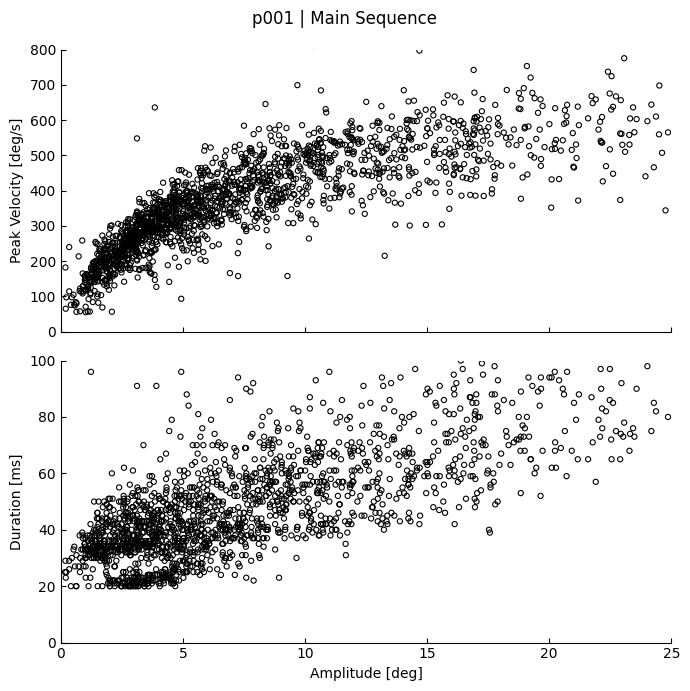

Plotting p001_250421_160302


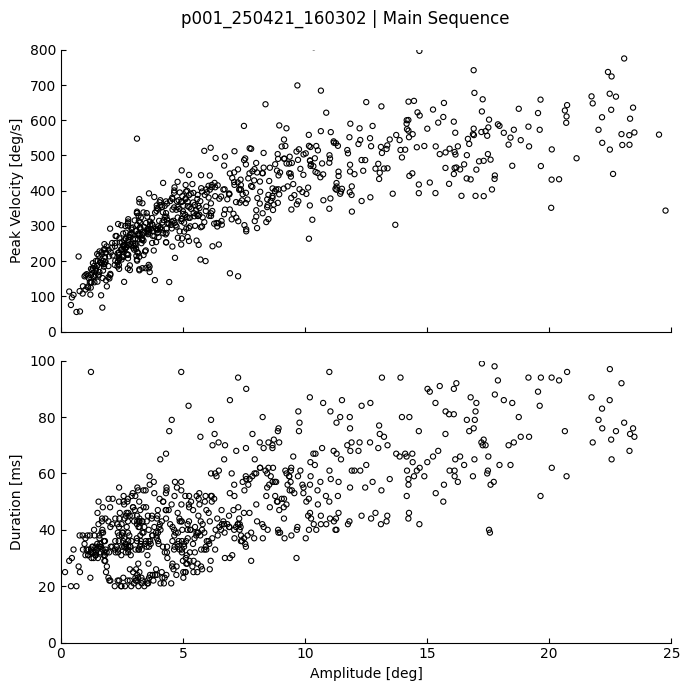

Plotting p002


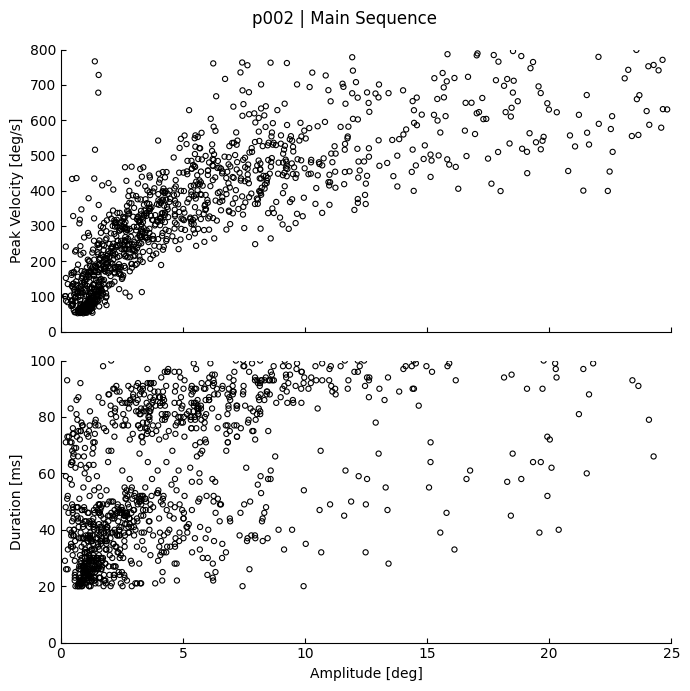

Plotting p003


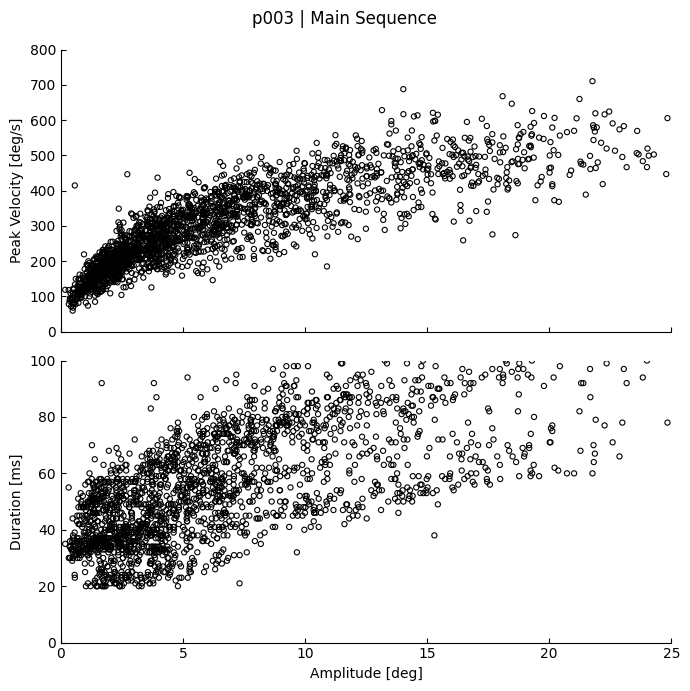

Plotting p004


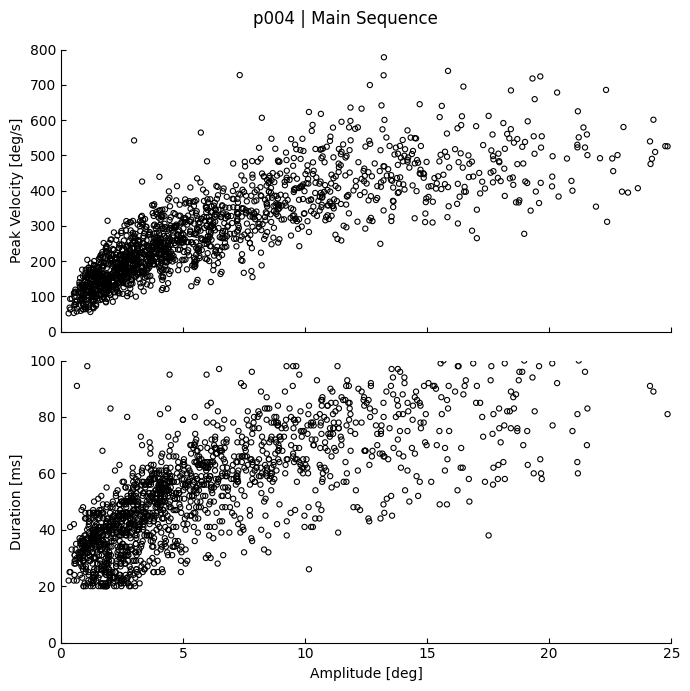

Plotting p005


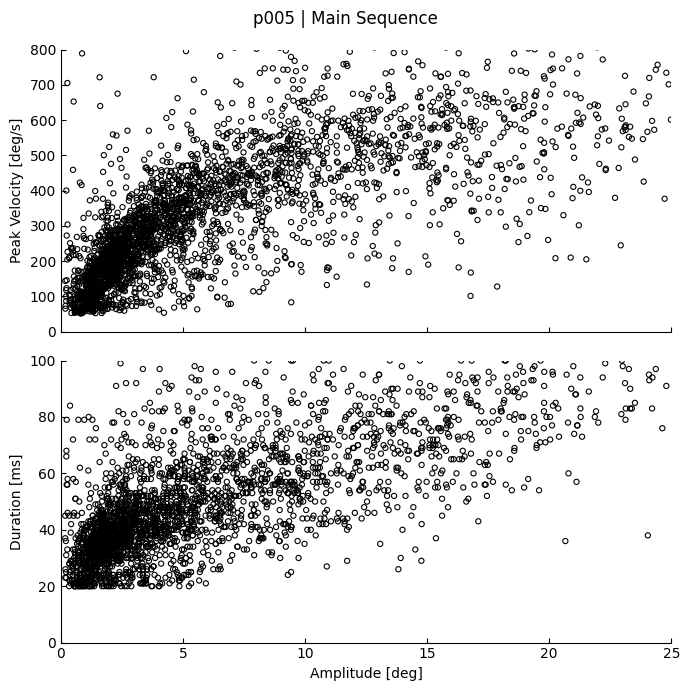

Plotting p006


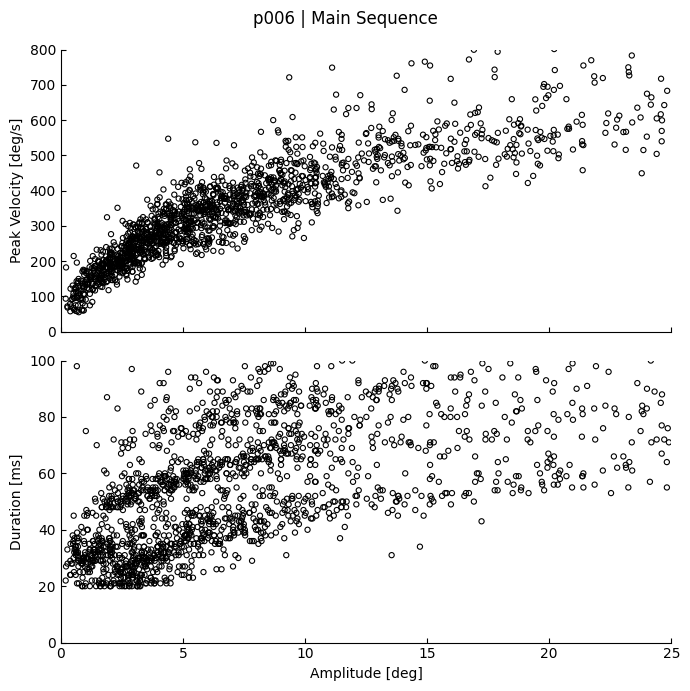

Plotting p007


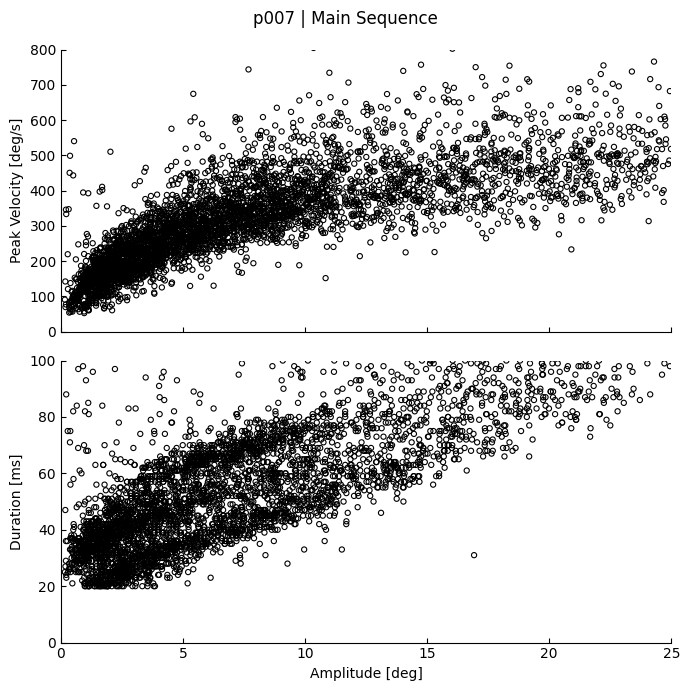

Plotting p008


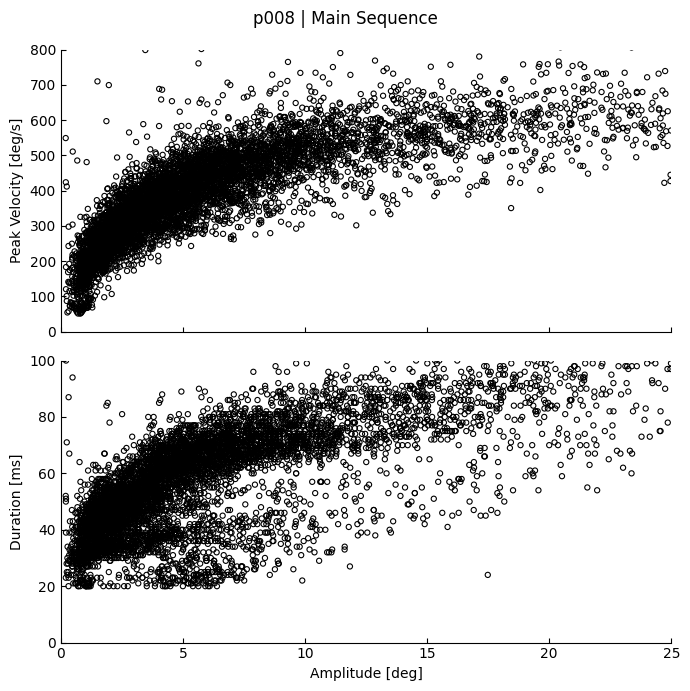

Plotting p009


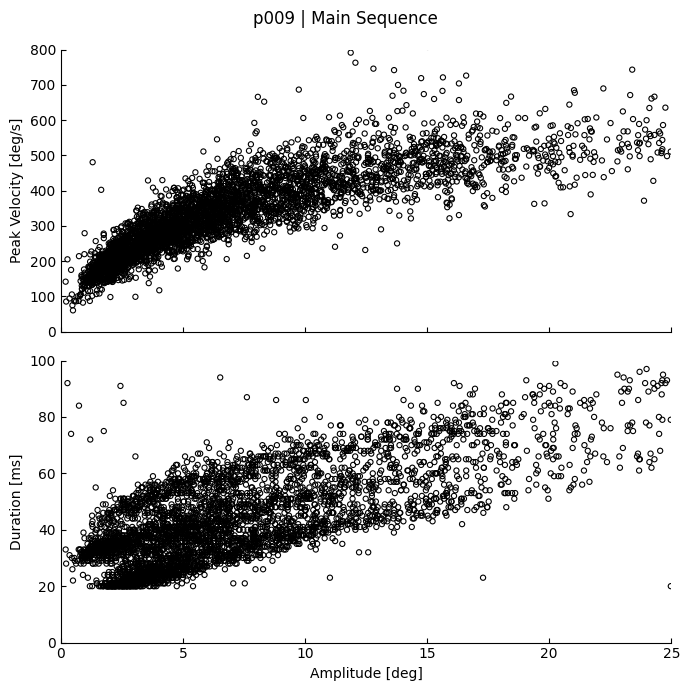

Plotting p010


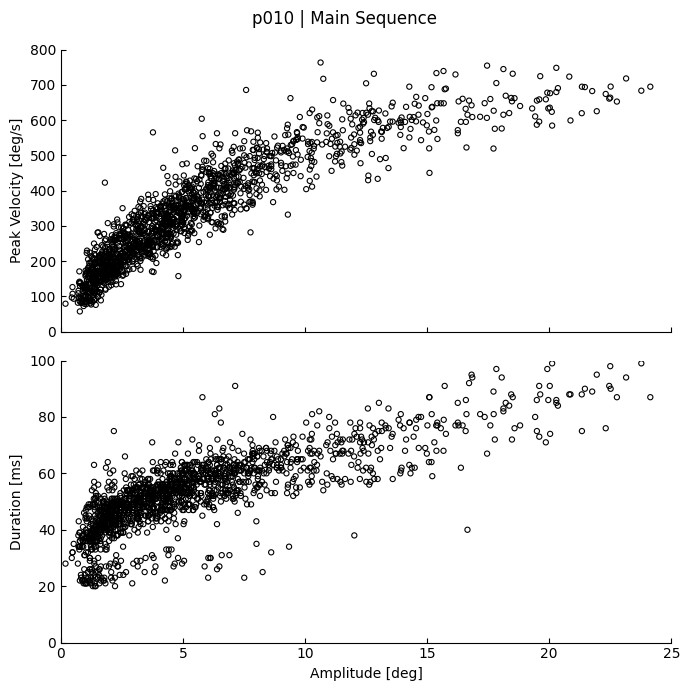

Plotting p011


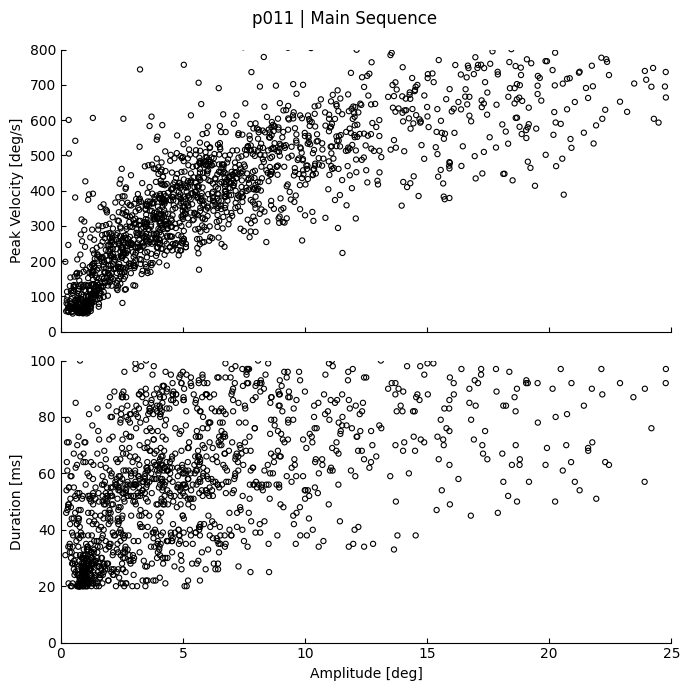

Plotting p012


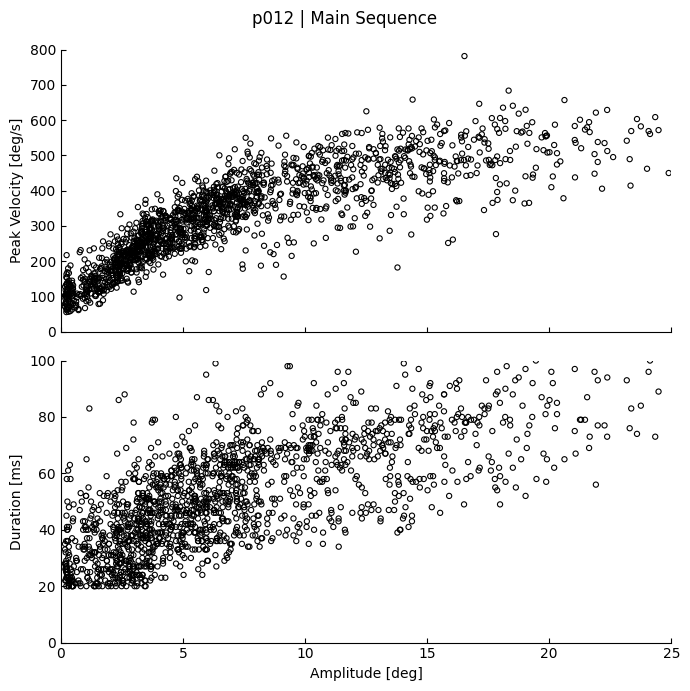

Plotting s178


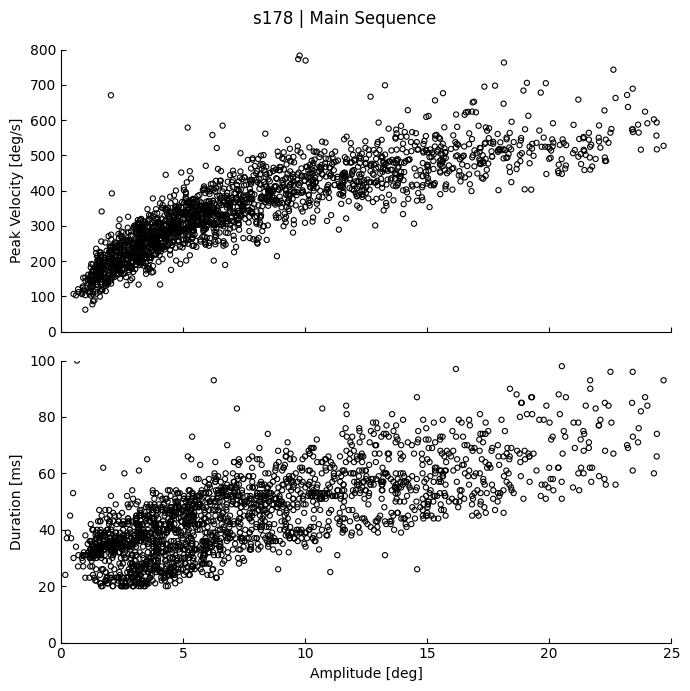

Plotting s179


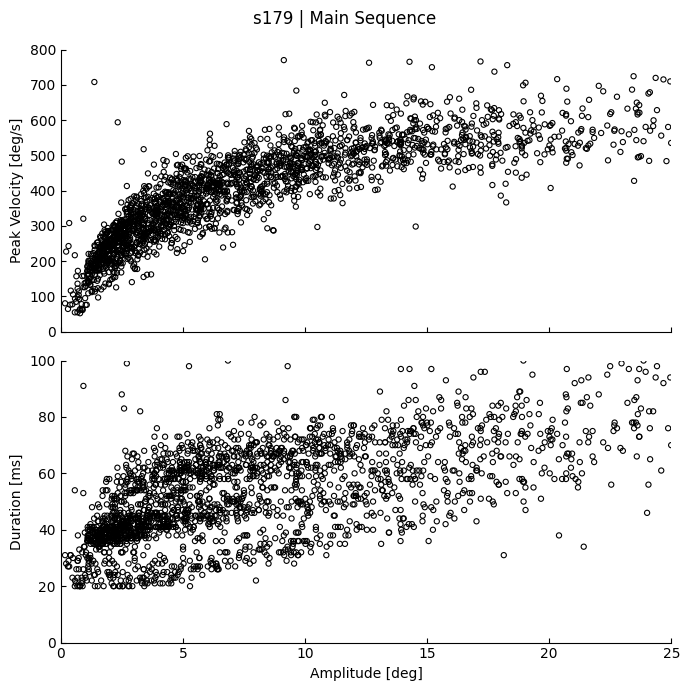

Plotting s180


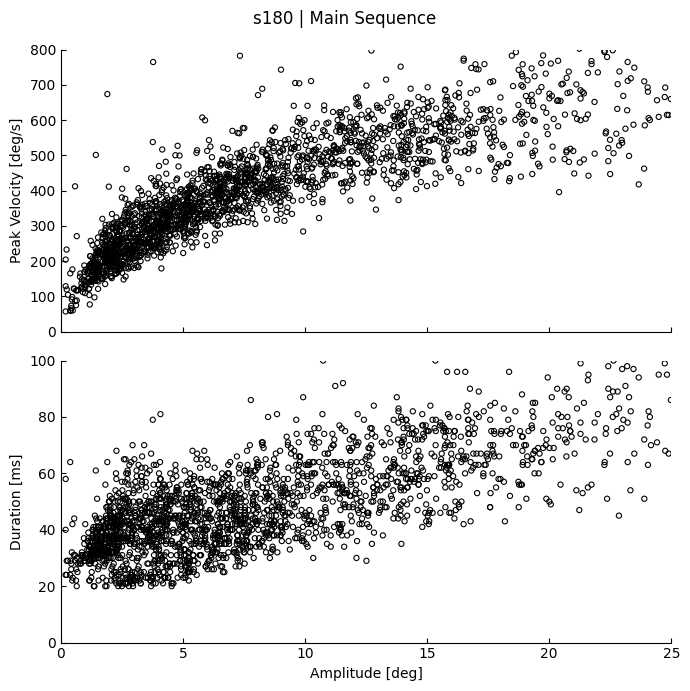

Plotting s181


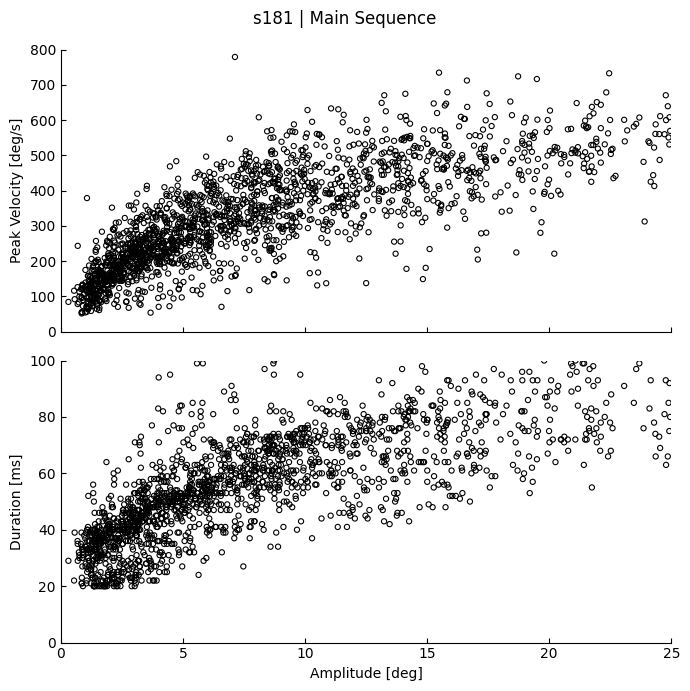

Plotting s182


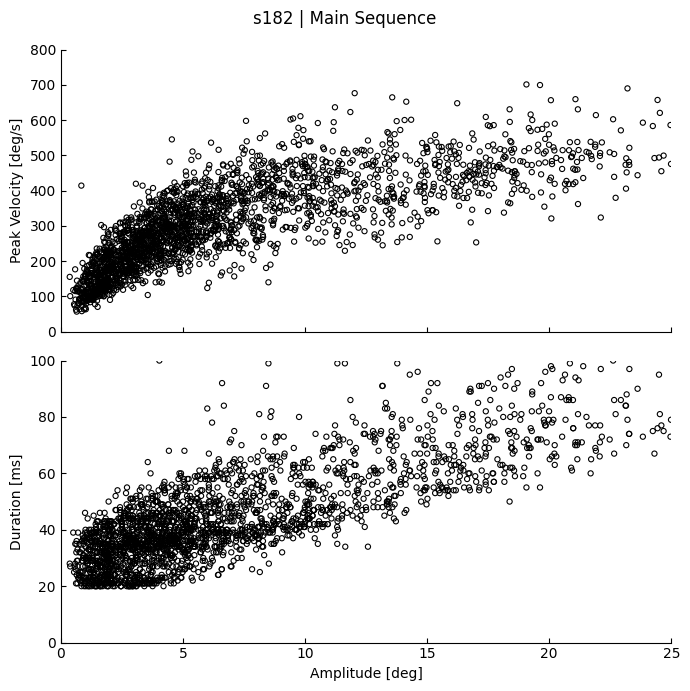

Plotting s183


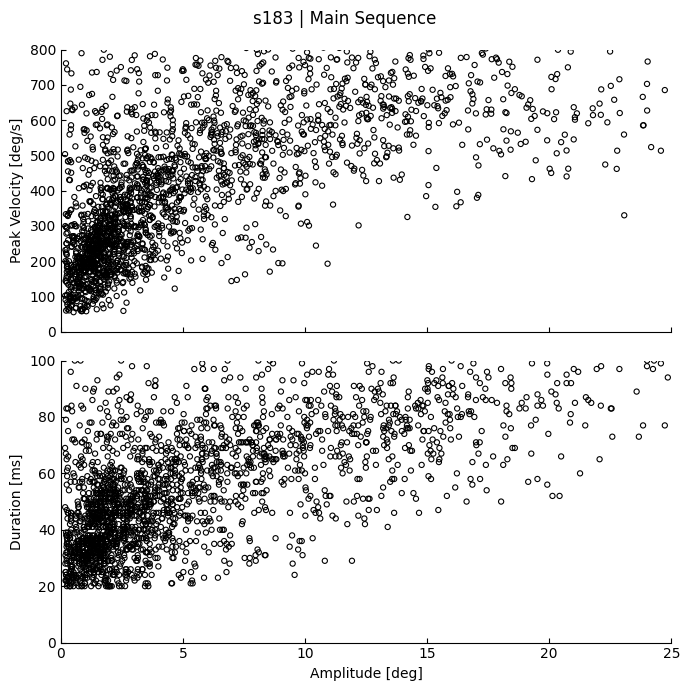

Plotting s184


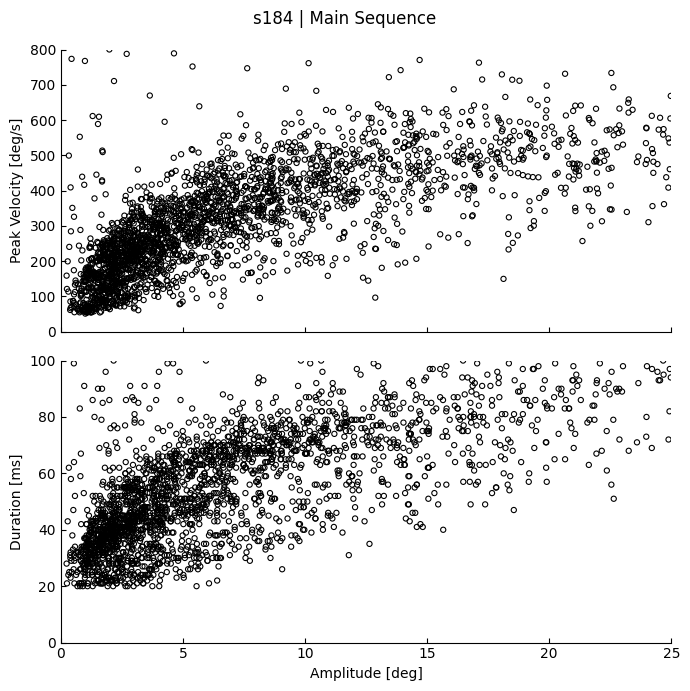

Plotting s185


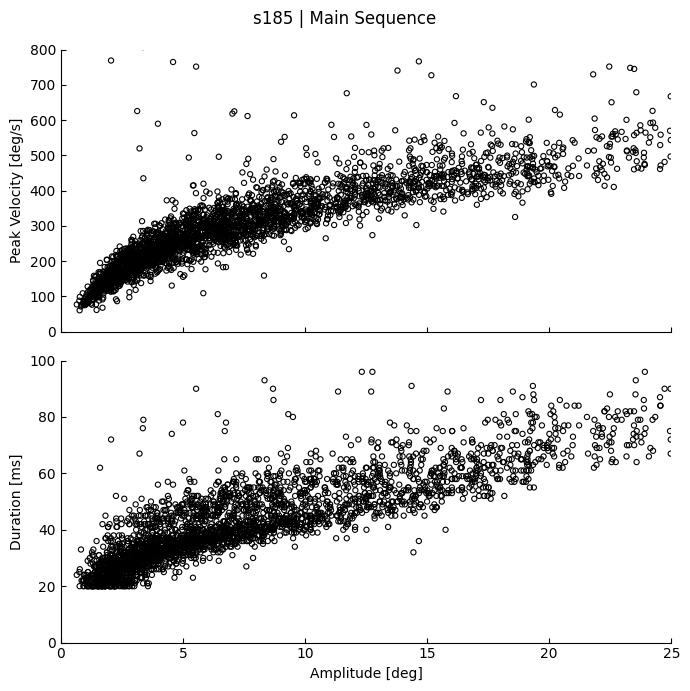

Plotting s186


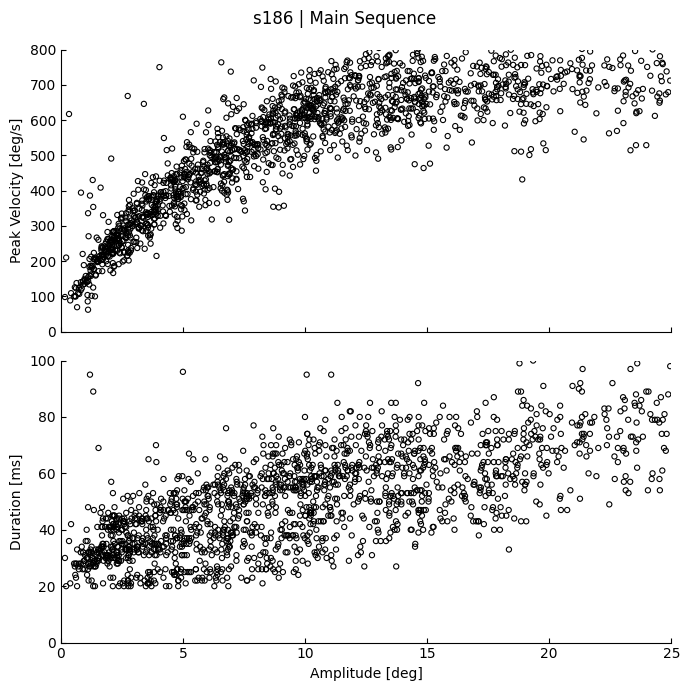

Plotting s187


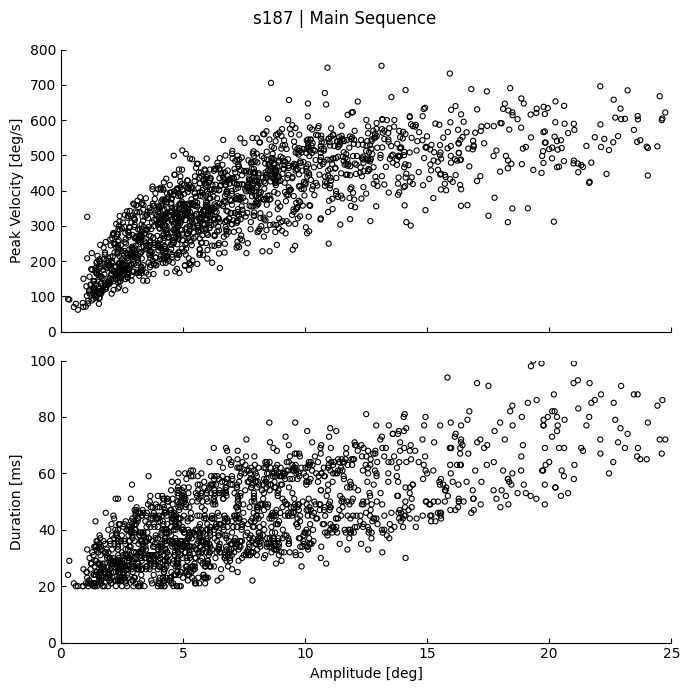

Plotting s188


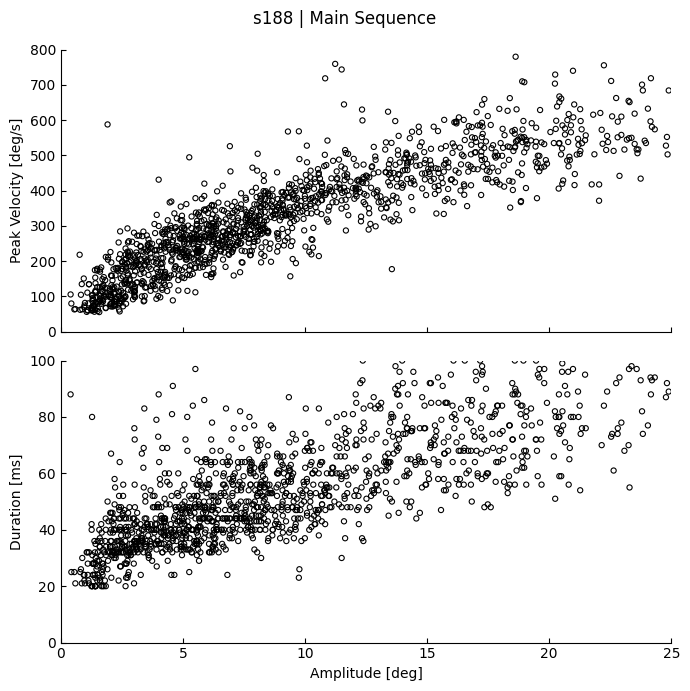

Plotting s189


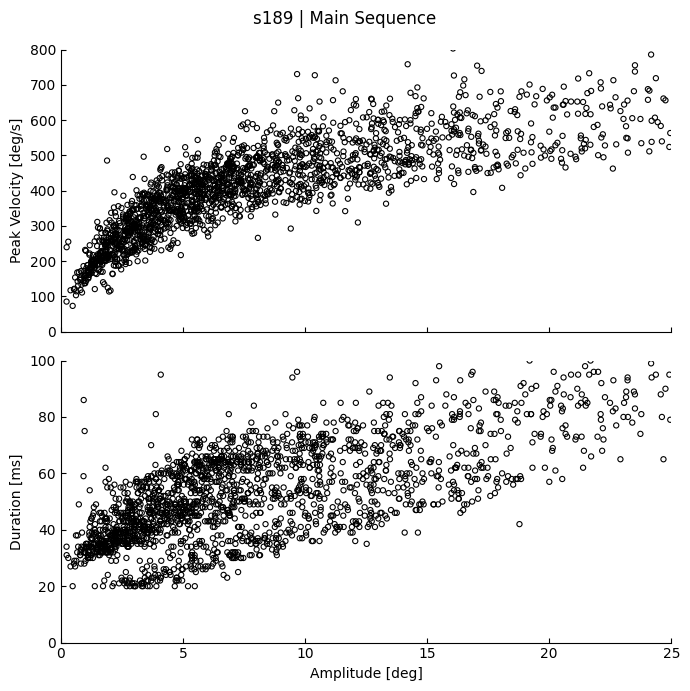

Plotting s193


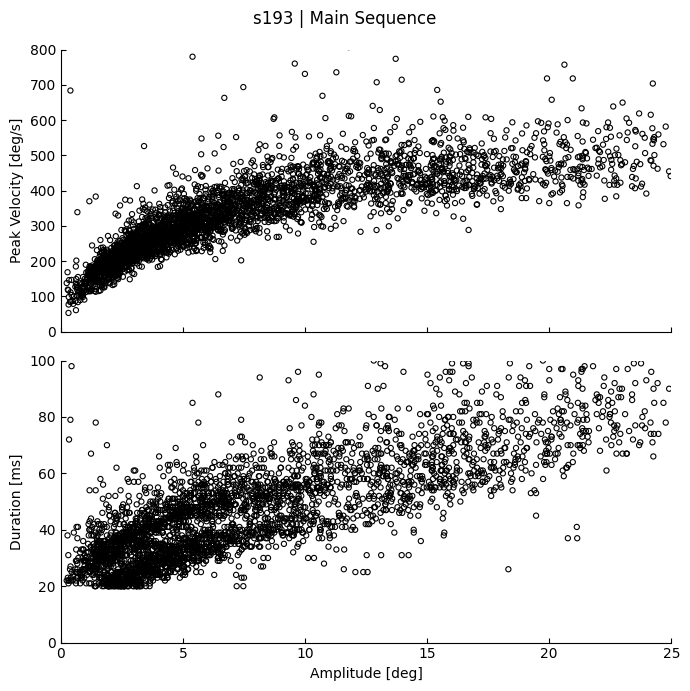

Plotting s194


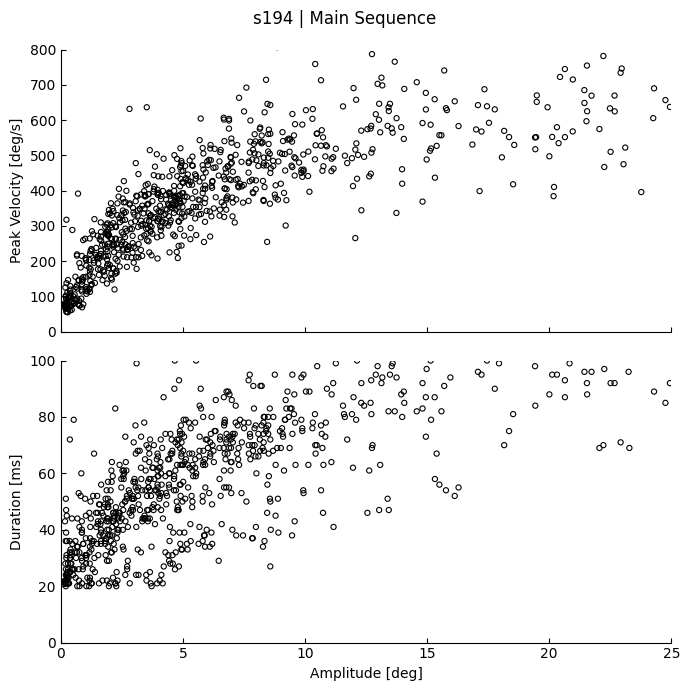

Plotting s195


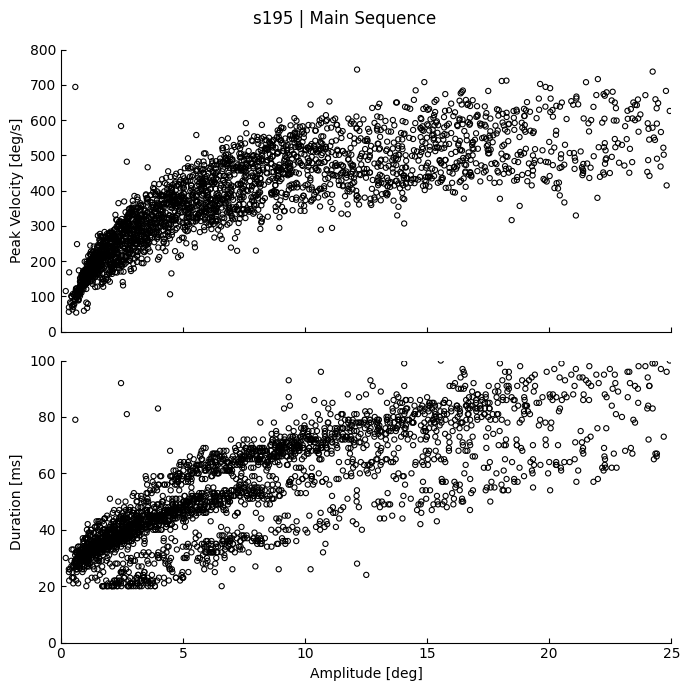


Done.
Figures saved to: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/main_sequence_figures


In [6]:
#plot all main sequences per subject

# ============================================================
# Plot main sequence for ALL subjects
# Uses all_saccades_<SUBJECT_ID>.csv files
# ============================================================


import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

OUT_DIR = Path("/content/drive/MyDrive/steer_search_PD/main_sequence_outputs")

SAVE_FIGURES = True

if SAVE_FIGURES:
    FIG_DIR = OUT_DIR / "main_sequence_figures"
    FIG_DIR.mkdir(exist_ok=True)

csv_files = sorted(OUT_DIR.glob("all_saccades_*.csv"))

print(f"Found {len(csv_files)} subjects.")

for csv_path in csv_files:

    SUBJECT_ID = csv_path.stem.replace("all_saccades_", "")

    print(f"Plotting {SUBJECT_ID}")

    df = pd.read_csv(csv_path)

    # -------------------------
    # QC
    # -------------------------
    df = df[
        (df["amplitude_deg"] > 0) &
        (df["duration_ms"] > 0) &
        (df["peak_velocity_deg_s"] > 0) &
        (df["amplitude_deg"] <= 25)
    ].copy()

    if len(df) == 0:
        print(f"Skipping {SUBJECT_ID}: no valid saccades after QC.")
        continue

    fig, axes = plt.subplots(
        2, 1,
        figsize=(7, 7),
        sharex=True
    )

    # -------------------------
    # Amplitude vs Peak Velocity
    # -------------------------
    axes[0].scatter(
        df["amplitude_deg"],
        df["peak_velocity_deg_s"],
        s=14,
        facecolors="none",
        edgecolors="black",
        linewidths=0.8,
    )

    axes[0].set_ylabel("Peak Velocity [deg/s]")
    axes[0].set_ylim(0, 800)
    axes[0].set_xlim(0, 25)

    # -------------------------
    # Amplitude vs Duration
    # -------------------------
    axes[1].scatter(
        df["amplitude_deg"],
        df["duration_ms"],
        s=14,
        facecolors="none",
        edgecolors="black",
        linewidths=0.8,
    )

    axes[1].set_xlabel("Amplitude [deg]")
    axes[1].set_ylabel("Duration [ms]")
    axes[1].set_ylim(0, 100)
    axes[1].set_xlim(0, 25)

    # -------------------------
    # Formatting
    # -------------------------
    for ax in axes:
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.tick_params(direction="in")
        ax.set_xticks([0, 5, 10, 15, 20, 25])

    fig.suptitle(f"{SUBJECT_ID} | Main Sequence", y=0.98)

    plt.tight_layout()

    if SAVE_FIGURES:
        fig.savefig(
            FIG_DIR / f"{SUBJECT_ID}_main_sequence.png",
            dpi=300,
            bbox_inches="tight"
        )

    plt.show()
    plt.close(fig)

print("\nDone.")

if SAVE_FIGURES:
    print(f"Figures saved to: {FIG_DIR}")

Found 27 subject CSV files.

Plotting and fitting p001
p001: V=142.93, n=1750, peak>1000=7, peak>2000=3, R2_inlier=0.655


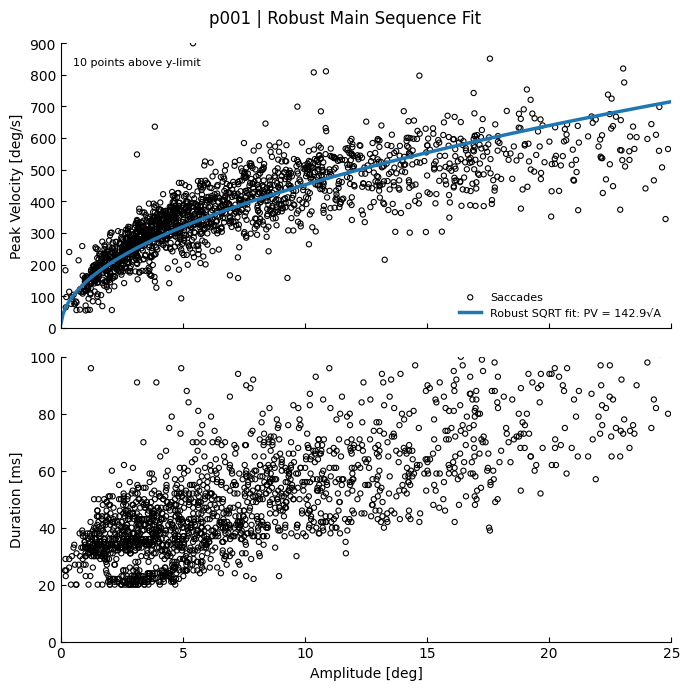


Plotting and fitting p002
p002: V=156.26, n=1621, peak>1000=484, peak>2000=462, R2_inlier=0.679


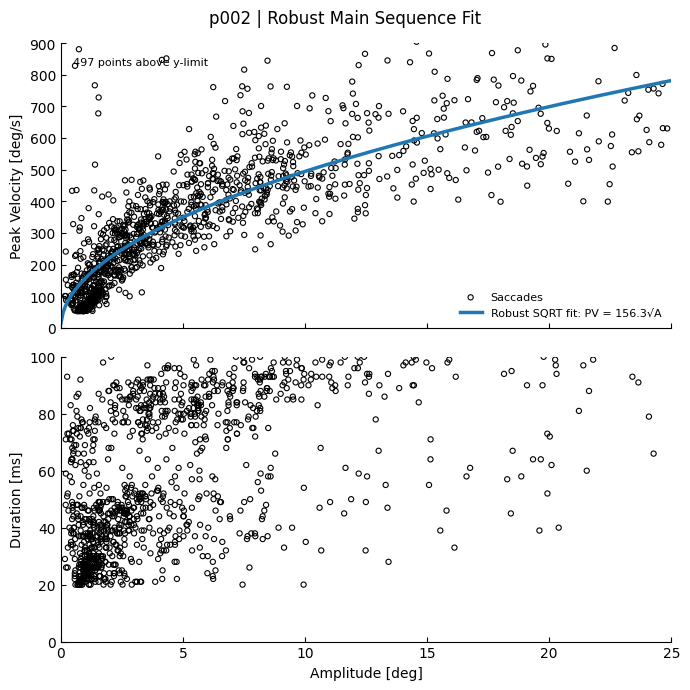


Plotting and fitting p003
p003: V=125.31, n=2120, peak>1000=0, peak>2000=0, R2_inlier=0.754


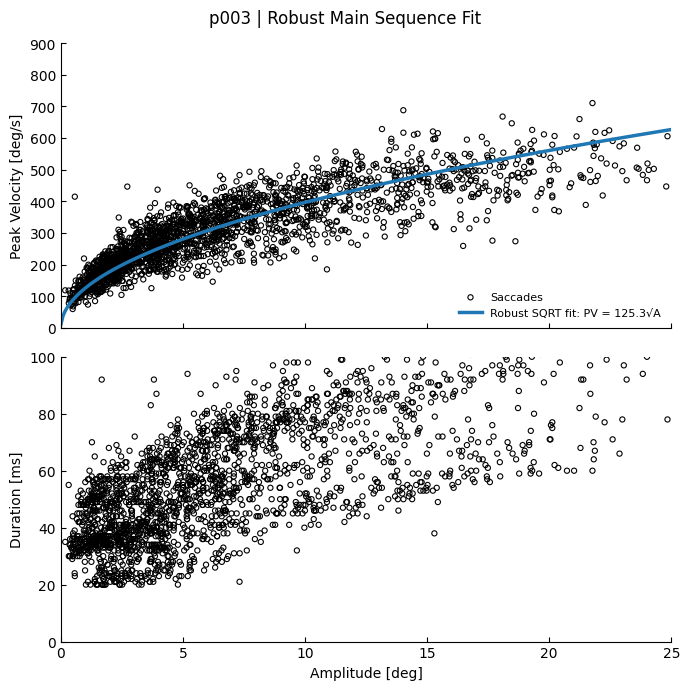


Plotting and fitting p004
p004: V=118.90, n=1627, peak>1000=0, peak>2000=0, R2_inlier=0.736


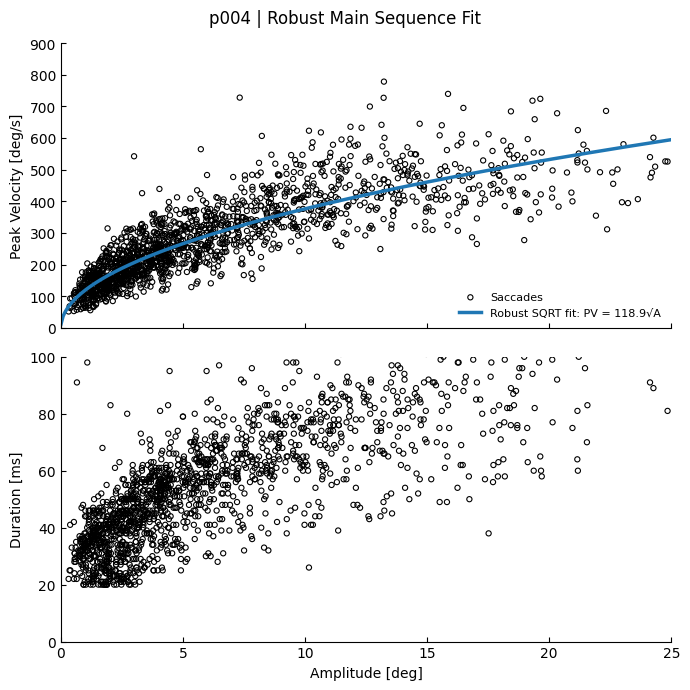


Plotting and fitting p005
p005: V=146.05, n=2898, peak>1000=76, peak>2000=54, R2_inlier=0.564


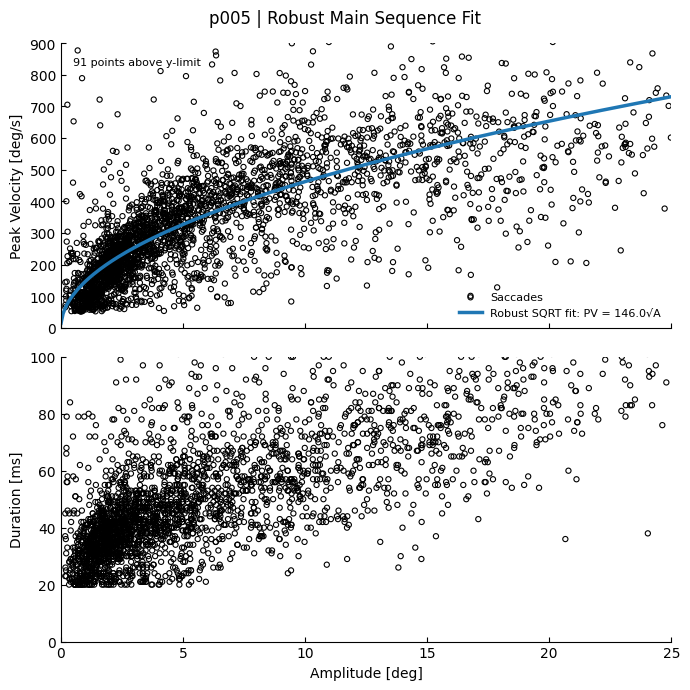


Plotting and fitting p006
p006: V=135.46, n=1645, peak>1000=71, peak>2000=61, R2_inlier=0.798


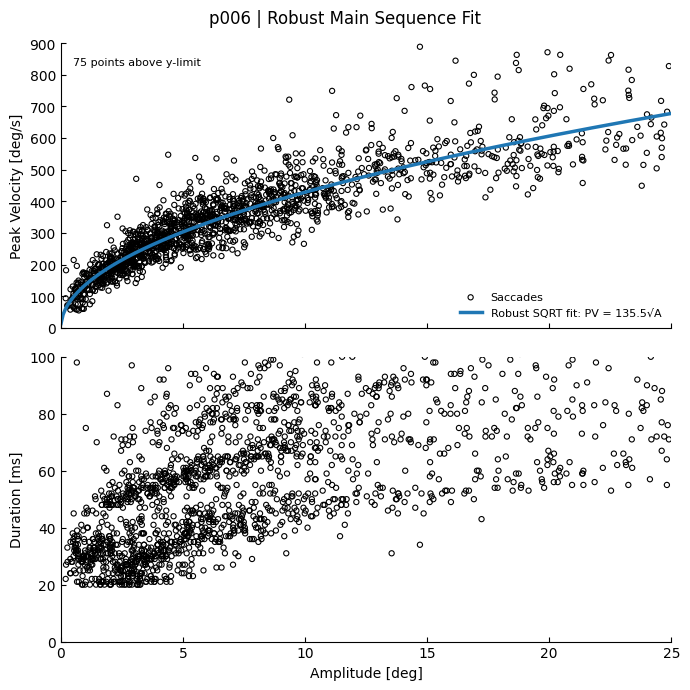


Plotting and fitting p007
p007: V=117.59, n=4338, peak>1000=26, peak>2000=23, R2_inlier=0.634


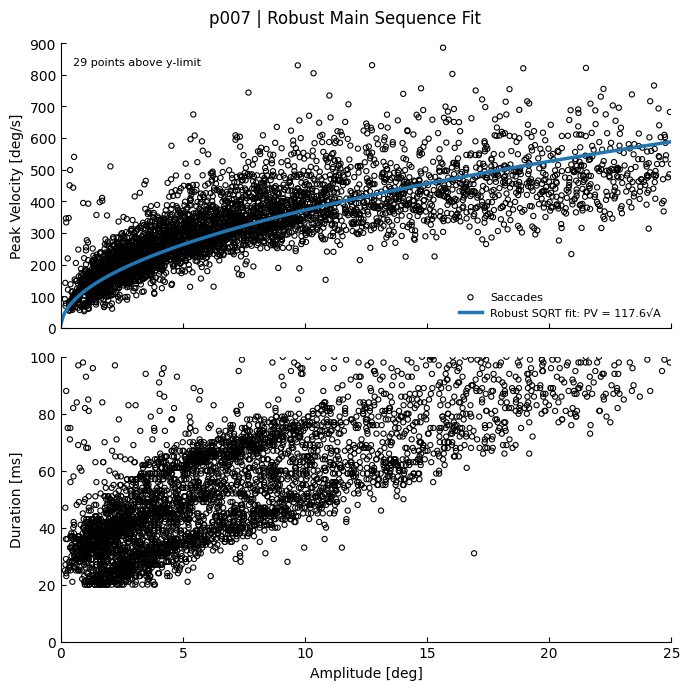


Plotting and fitting p008
p008: V=169.24, n=6710, peak>1000=77, peak>2000=40, R2_inlier=0.597


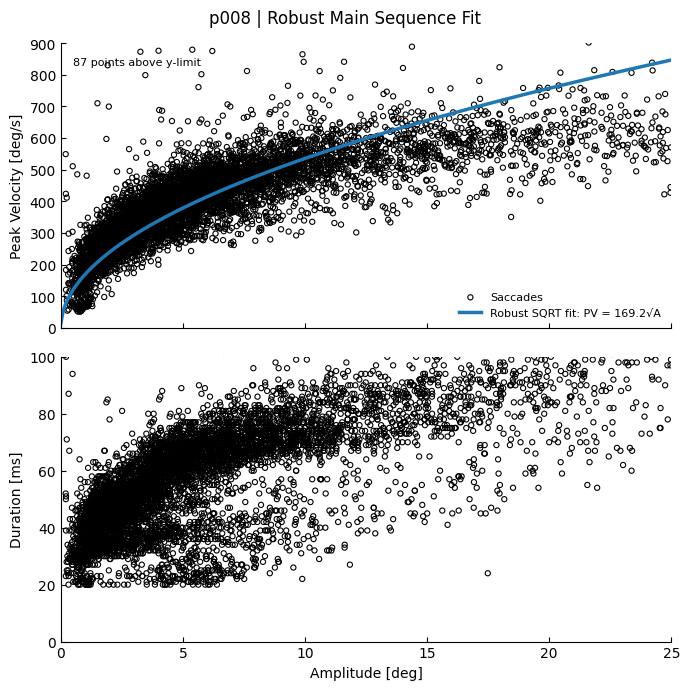


Plotting and fitting p009
p009: V=130.91, n=4134, peak>1000=25, peak>2000=15, R2_inlier=0.733


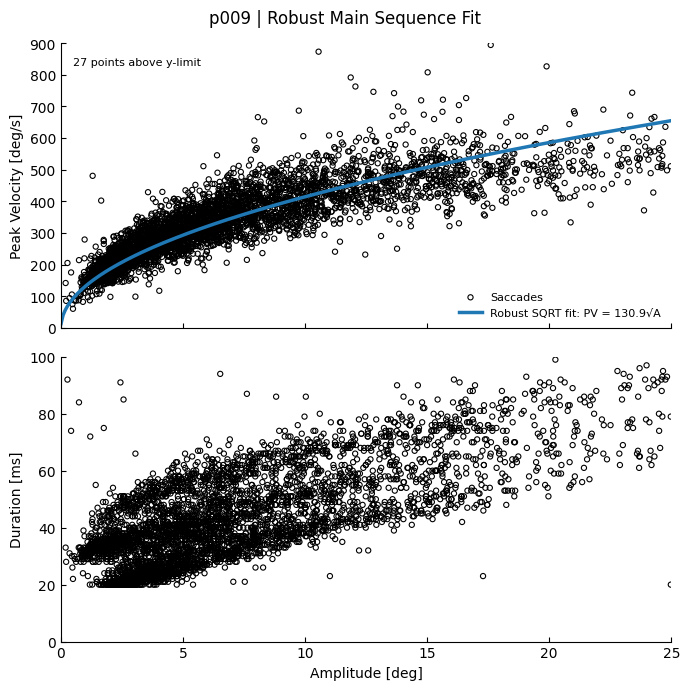


Plotting and fitting p010
p010: V=154.08, n=1523, peak>1000=1, peak>2000=0, R2_inlier=0.863


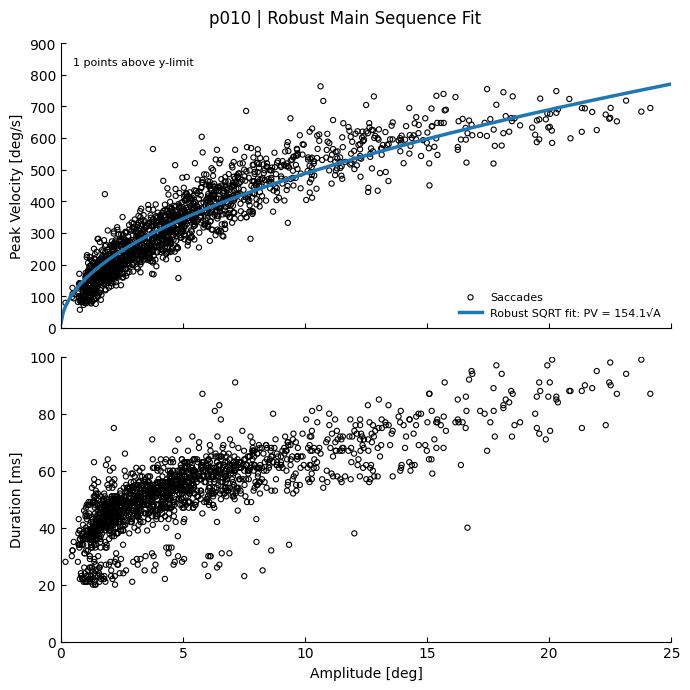


Plotting and fitting p011
p011: V=160.29, n=1711, peak>1000=67, peak>2000=7, R2_inlier=0.654


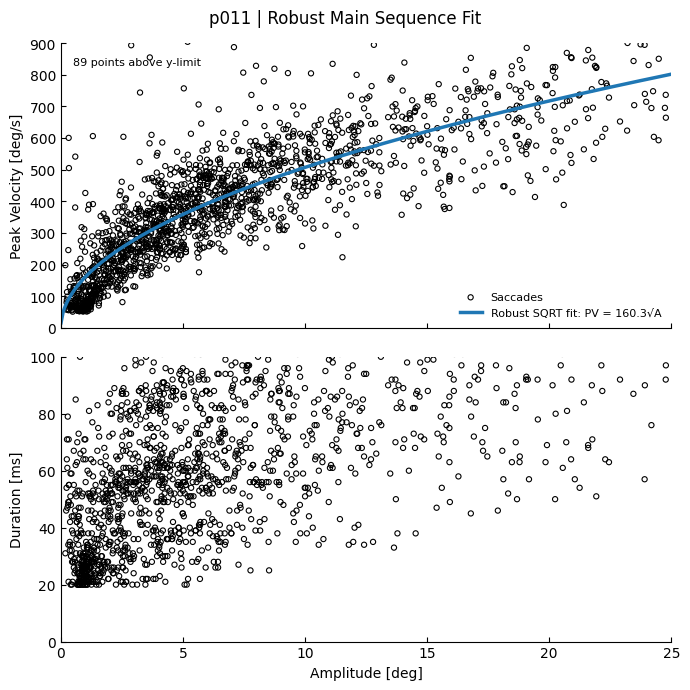


Plotting and fitting p012
p012: V=130.78, n=1599, peak>1000=0, peak>2000=0, R2_inlier=0.764


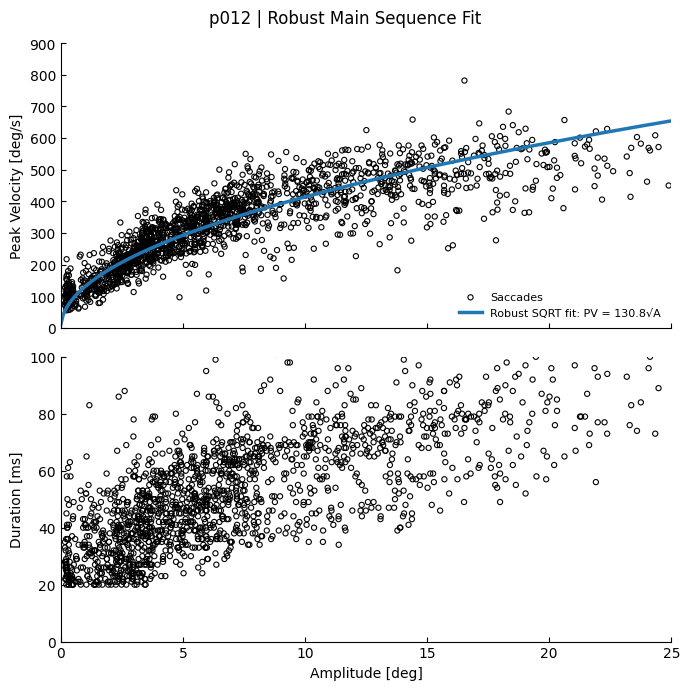


Plotting and fitting s178
s178: V=129.70, n=2059, peak>1000=38, peak>2000=25, R2_inlier=0.711


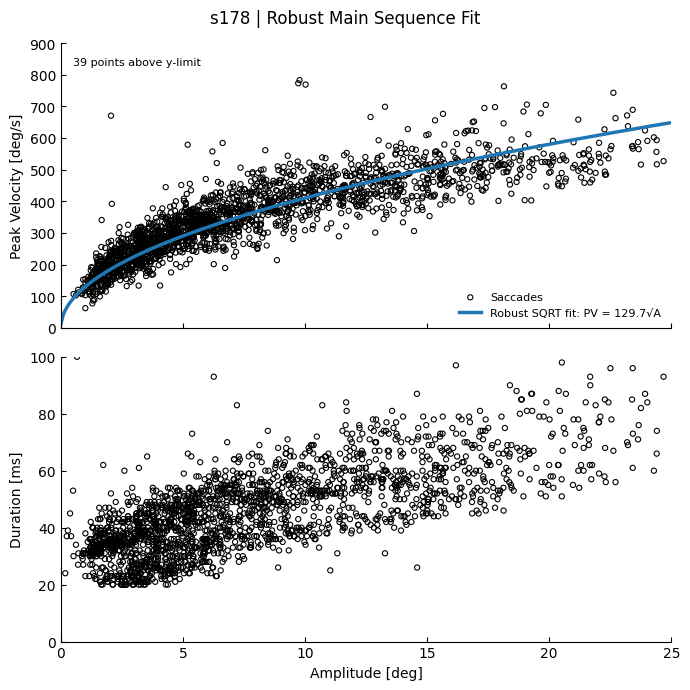


Plotting and fitting s179
s179: V=149.63, n=2145, peak>1000=25, peak>2000=6, R2_inlier=0.682


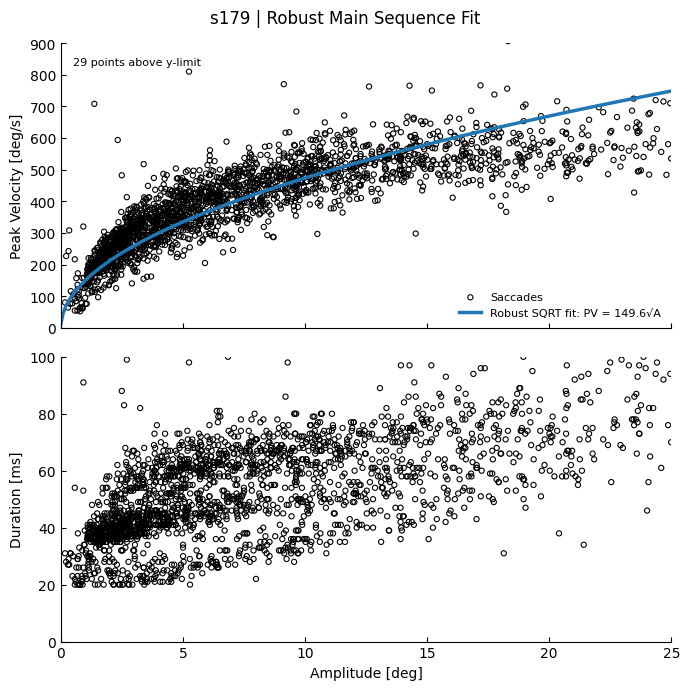


Plotting and fitting s180
s180: V=148.94, n=2064, peak>1000=4, peak>2000=1, R2_inlier=0.755


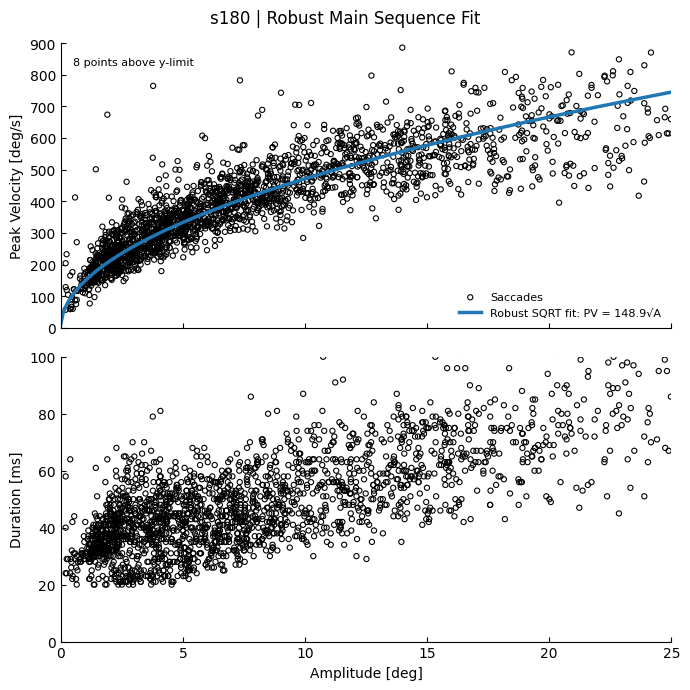


Plotting and fitting s181
s181: V=121.14, n=1815, peak>1000=1, peak>2000=0, R2_inlier=0.660


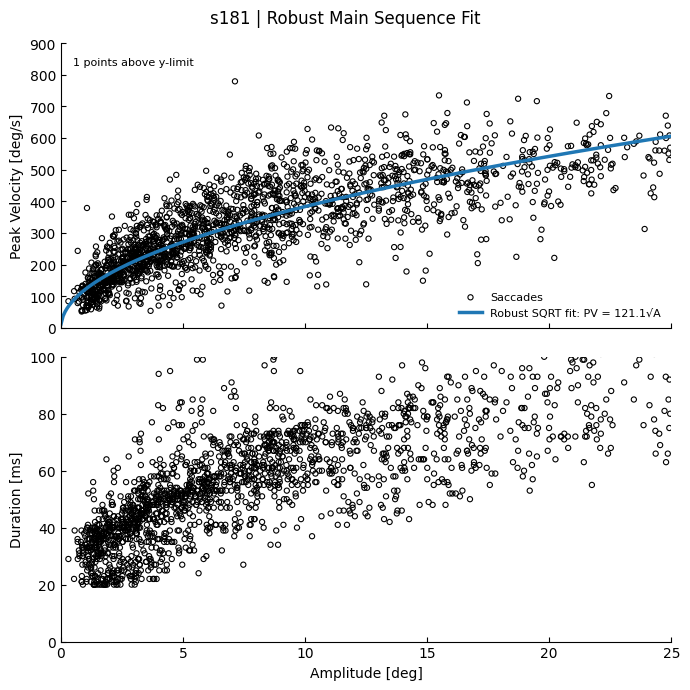


Plotting and fitting s182
s182: V=123.77, n=2261, peak>1000=0, peak>2000=0, R2_inlier=0.652


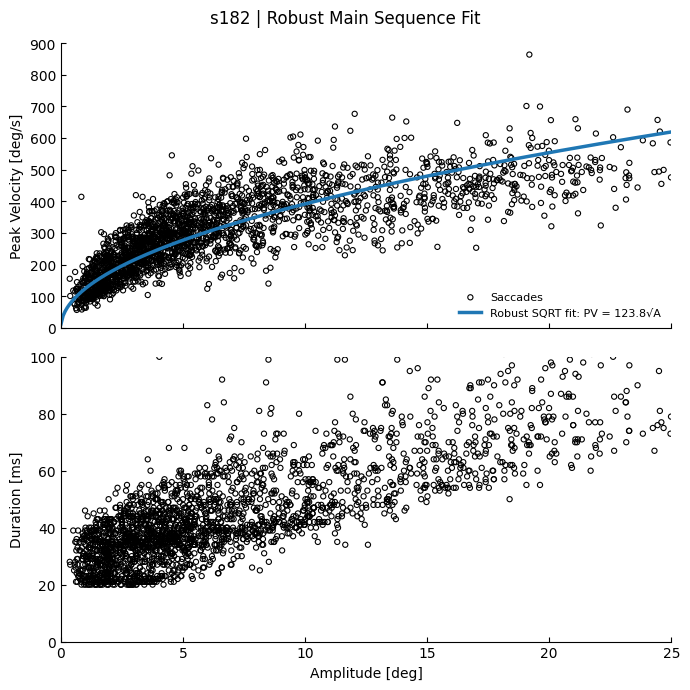


Plotting and fitting s183
s183: V=191.08, n=2424, peak>1000=182, peak>2000=11, R2_inlier=0.321


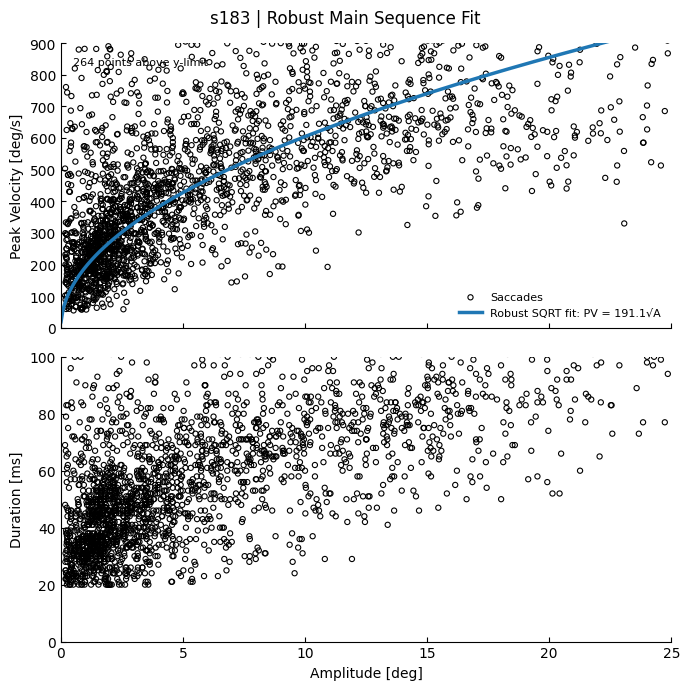


Plotting and fitting s184
s184: V=125.98, n=2486, peak>1000=11, peak>2000=3, R2_inlier=0.514


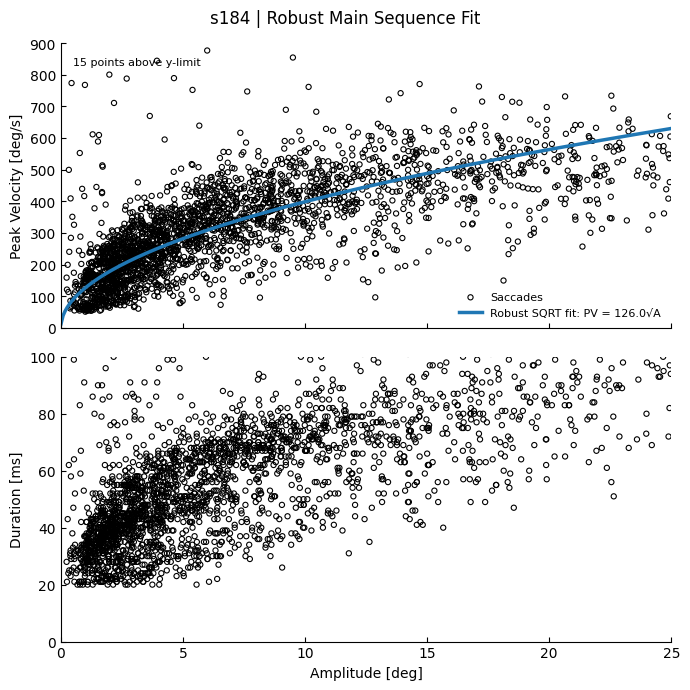


Plotting and fitting s185
s185: V=112.67, n=2907, peak>1000=7, peak>2000=0, R2_inlier=0.733


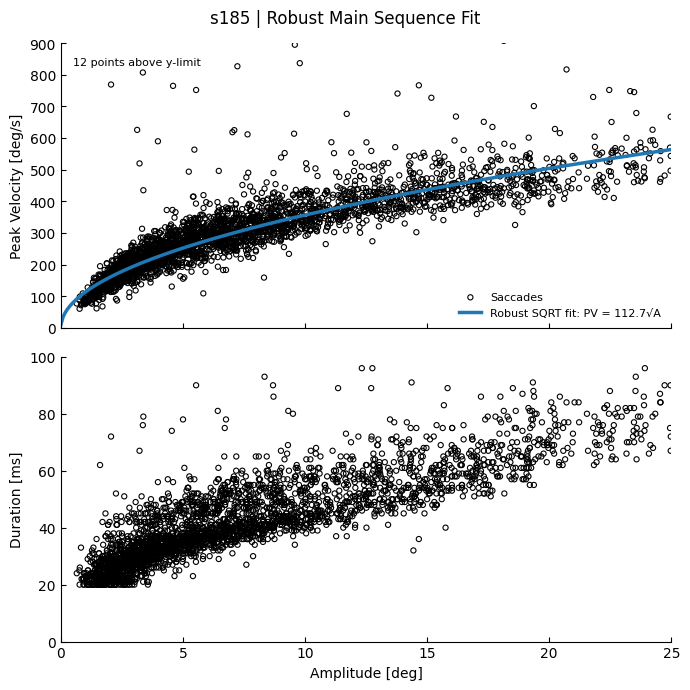


Plotting and fitting s186
s186: V=178.65, n=1638, peak>1000=41, peak>2000=8, R2_inlier=0.720


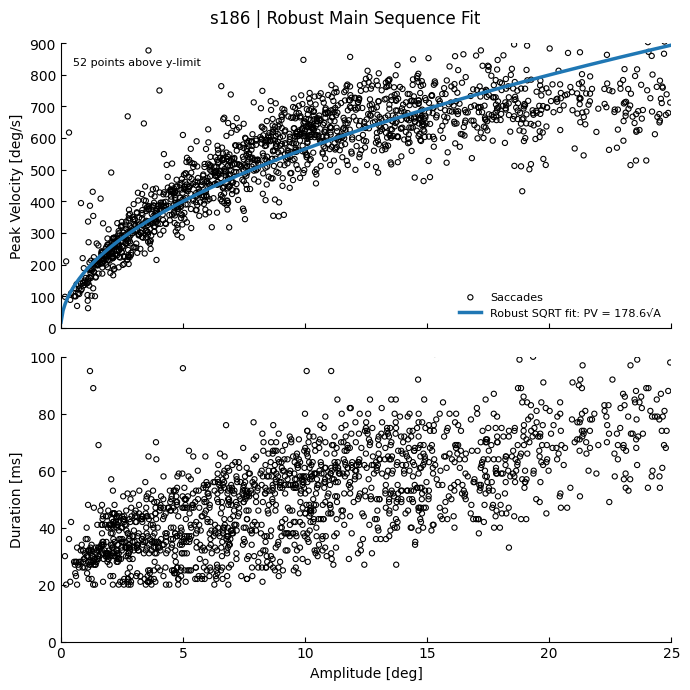


Plotting and fitting s187
s187: V=138.61, n=1668, peak>1000=0, peak>2000=0, R2_inlier=0.661


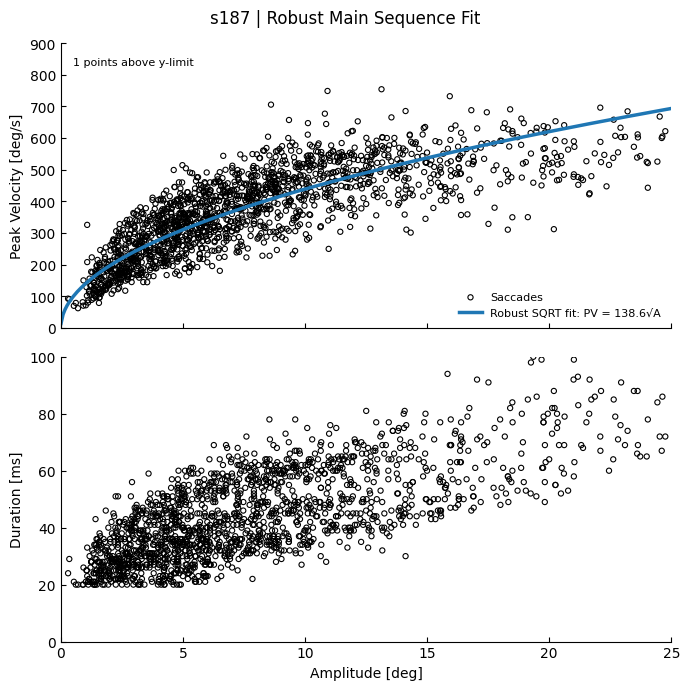


Plotting and fitting s188
s188: V=114.64, n=1369, peak>1000=4, peak>2000=1, R2_inlier=0.752


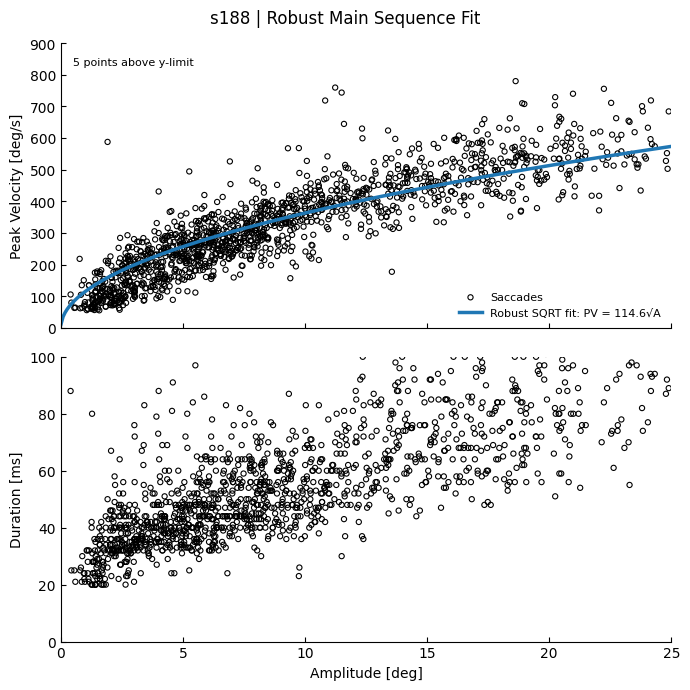


Plotting and fitting s189
s189: V=151.43, n=1893, peak>1000=1, peak>2000=1, R2_inlier=0.614


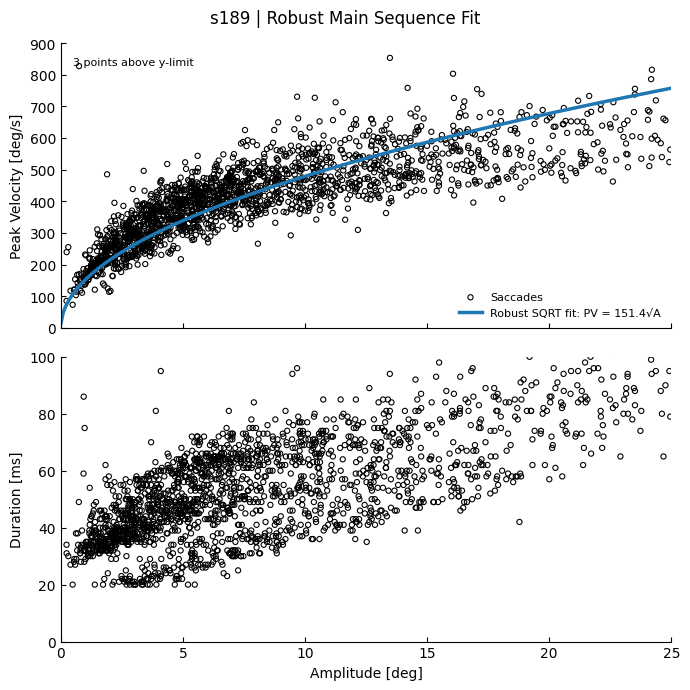


Plotting and fitting s193
s193: V=124.41, n=3272, peak>1000=30, peak>2000=3, R2_inlier=0.617


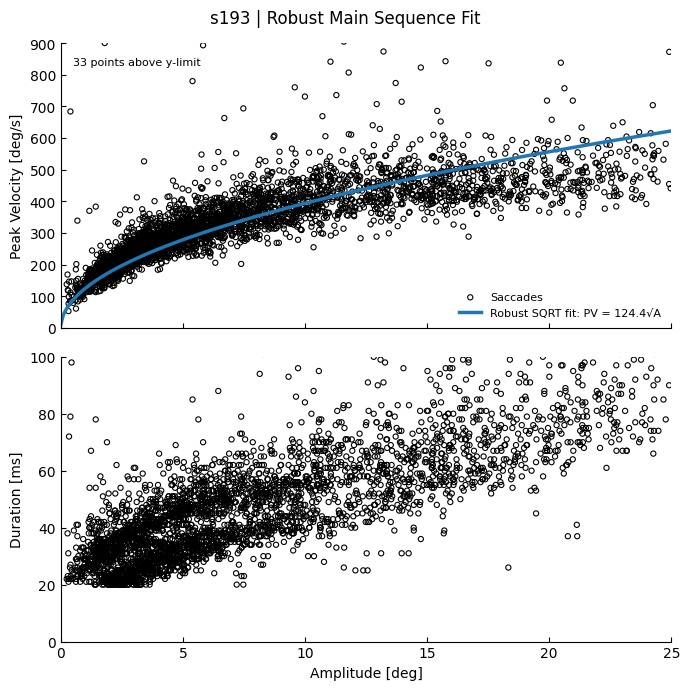


Plotting and fitting s194
s194: V=161.62, n=784, peak>1000=2, peak>2000=0, R2_inlier=0.720


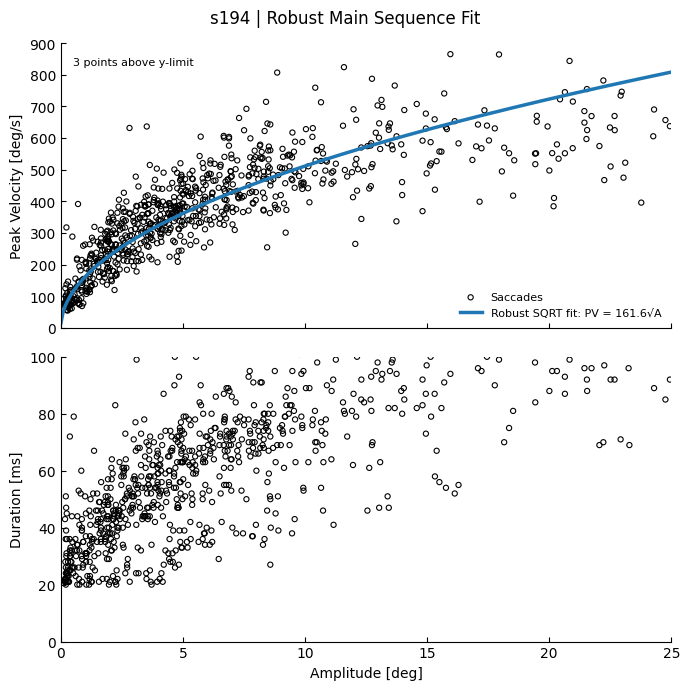


Plotting and fitting s195
s195: V=144.87, n=2647, peak>1000=11, peak>2000=2, R2_inlier=0.672


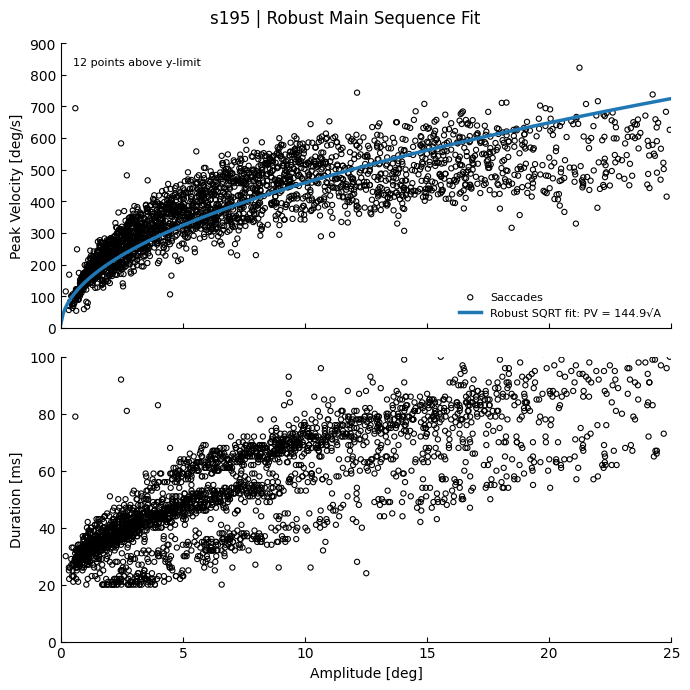


Done.
Saved fit summary to: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/robust_sqrt_main_sequence_fit_summary.csv
Figures saved to: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/main_sequence_figures_robust_sqrt_fit


,subject_id,n_fit,V_sqrt,r2_inlier_peak_le_1200,mae_inlier_peak_le_1200,n_peak_gt_1000,n_peak_gt_2000,fit_success
0,p001,1750,142.933220,0.654517,56.312950,7,3,True
1,p002,1621,156.258974,0.678657,84.197184,484,462,True
2,p003,2120,125.310586,0.753565,45.438195,0,0,True
3,p004,1627,118.895485,0.735956,50.164012,0,0,True
4,p005,2898,146.047488,0.564426,87.721760,76,54,True
5,p006,1645,135.459152,0.797699,46.904765,71,61,True
6,p007,4338,117.593881,0.634488,57.881078,26,23,True
7,p008,6710,169.236621,0.596701,61.923156,77,40,True
8,p009,4134,130.912575,0.732878,43.644090,25,15,True
9,p010,1523,154.082646,0.862939,43.510958,1,0,True


,min_V,max_V,range_V
group,,,
Control,112.668030,191.082408,78.414378
PD,117.593881,169.236621,51.642740


In [16]:
#fitting curve

# ============================================================
# Robust main-sequence curve fitting for ALL subjects
# Peak velocity vs amplitude
#
# Model:
#   peak_velocity = V * sqrt(amplitude)
#
# Robust to extreme peak-velocity outliers using scipy least_squares
# ============================================================

import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
from pandas.errors import EmptyDataError
from scipy.optimize import least_squares

OUT_DIR = Path("/content/drive/MyDrive/steer_search_PD/main_sequence_outputs")

SAVE_FIGURES = True

if SAVE_FIGURES:
    FIG_DIR = OUT_DIR / "main_sequence_figures_robust_sqrt_fit"
    FIG_DIR.mkdir(exist_ok=True)

# Only include true subject files:
# all_saccades_p001.csv, all_saccades_s189.csv, etc.
# Excludes files like all_saccades_s189_enriched.csv
csv_files = sorted([
    p for p in OUT_DIR.glob("all_saccades_*.csv")
    if re.fullmatch(r"all_saccades_[ps]\d{3}\.csv", p.name)
])

print(f"Found {len(csv_files)} subject CSV files.")

# -------------------------
# Robust fit settings
# -------------------------
LOSS = "cauchy"      # strongest downweighting for huge outliers
F_SCALE = 100.0     # residual size, in deg/s, where points start being treated as outlier-like

MIN_SACCADES_FOR_FIT = 20

PLOT_XMAX = 25
PLOT_YMAX = 900

summary_rows = []


def sqrt_main_sequence(amplitude, V):
    """
    One-parameter SQRT main-sequence model:
        peak_velocity = V * sqrt(amplitude)
    """
    return V * np.sqrt(amplitude)


def fit_robust_sqrt(amplitude, peak_velocity):
    """
    Robustly fit:
        peak_velocity = V * sqrt(amplitude)

    Uses scipy.optimize.least_squares with robust loss.
    """

    x = np.asarray(amplitude, dtype=float)
    y = np.asarray(peak_velocity, dtype=float)

    valid = (
        np.isfinite(x) &
        np.isfinite(y) &
        (x > 0) &
        (y > 0)
    )

    x = x[valid]
    y = y[valid]

    if len(x) < MIN_SACCADES_FOR_FIT:
        return None

    z = np.sqrt(x)

    # Robust initial estimate:
    # y / sqrt(x) should be around V.
    # Median is not pulled much by a few huge outliers.
    ratio = y / z
    ratio = ratio[np.isfinite(ratio) & (ratio > 0)]

    if len(ratio) == 0:
        V0 = 100.0
    else:
        V0 = float(np.nanmedian(ratio))

    V0 = np.clip(V0, 1.0, 1000.0)

    def residual(theta):
        V = theta[0]
        return sqrt_main_sequence(x, V) - y

    res = least_squares(
        residual,
        x0=np.array([V0]),
        bounds=([0.0], [1000.0]),
        loss=LOSS,
        f_scale=F_SCALE,
        max_nfev=10000
    )

    V_hat = float(res.x[0])
    y_hat = sqrt_main_sequence(x, V_hat)

    # Ordinary R2 can look bad if there are huge outliers,
    # so compute it only on a reasonable plotting/inlier range.
    inlier_like = y <= 1200

    if inlier_like.sum() >= 3:
        yy = y[inlier_like]
        yy_hat = y_hat[inlier_like]

        ss_res = np.sum((yy - yy_hat) ** 2)
        ss_tot = np.sum((yy - np.mean(yy)) ** 2)

        r2_inlier = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan
        mae_inlier = np.mean(np.abs(yy - yy_hat))
    else:
        r2_inlier = np.nan
        mae_inlier = np.nan

    return {
        "V": V_hat,
        "n_fit": len(x),
        "n_peak_gt_1000": int(np.sum(y > 1000)),
        "n_peak_gt_2000": int(np.sum(y > 2000)),
        "r2_inlier": r2_inlier,
        "mae_inlier": mae_inlier,
        "success": bool(res.success),
        "message": res.message
    }


for csv_path in csv_files:

    SUBJECT_ID = csv_path.stem.replace("all_saccades_", "")

    print(f"\nPlotting and fitting {SUBJECT_ID}")

    # -------------------------
    # Skip empty files
    # -------------------------
    if csv_path.stat().st_size == 0:
        print(f"Skipping {SUBJECT_ID}: empty CSV file.")
        continue

    try:
        df = pd.read_csv(csv_path)
    except EmptyDataError:
        print(f"Skipping {SUBJECT_ID}: no columns to parse.")
        continue

    if len(df) == 0:
        print(f"Skipping {SUBJECT_ID}: CSV has columns but no rows.")
        continue

    # -------------------------
    # Required columns
    # -------------------------
    required_cols = [
        "amplitude_deg",
        "duration_ms",
        "peak_velocity_deg_s"
    ]

    missing_cols = [c for c in required_cols if c not in df.columns]

    if missing_cols:
        print(f"Skipping {SUBJECT_ID}: missing columns {missing_cols}")
        continue

    # -------------------------
    # Basic QC
    # Important:
    # We do NOT remove super high peak velocities here.
    # The robust fit handles them.
    # -------------------------
    df = df[
        np.isfinite(df["amplitude_deg"]) &
        np.isfinite(df["duration_ms"]) &
        np.isfinite(df["peak_velocity_deg_s"]) &
        (df["amplitude_deg"] > 0) &
        (df["duration_ms"] > 0) &
        (df["peak_velocity_deg_s"] > 0) &
        (df["amplitude_deg"] <= 25)
    ].copy()

    if len(df) == 0:
        print(f"Skipping {SUBJECT_ID}: no valid saccades after QC.")
        continue

    # -------------------------
    # Robust fit
    # -------------------------
    fit = fit_robust_sqrt(
        df["amplitude_deg"].values,
        df["peak_velocity_deg_s"].values
    )

    if fit is None:
        print(f"Skipping {SUBJECT_ID}: fewer than {MIN_SACCADES_FOR_FIT} valid saccades.")
        continue

    V_hat = fit["V"]

    print(
        f"{SUBJECT_ID}: V={V_hat:.2f}, "
        f"n={fit['n_fit']}, "
        f"peak>1000={fit['n_peak_gt_1000']}, "
        f"peak>2000={fit['n_peak_gt_2000']}, "
        f"R2_inlier={fit['r2_inlier']:.3f}"
    )

    summary_rows.append({
        "subject_id": SUBJECT_ID,
        "n_fit": fit["n_fit"],
        "V_sqrt": V_hat,
        "r2_inlier_peak_le_1200": fit["r2_inlier"],
        "mae_inlier_peak_le_1200": fit["mae_inlier"],
        "n_peak_gt_1000": fit["n_peak_gt_1000"],
        "n_peak_gt_2000": fit["n_peak_gt_2000"],
        "fit_success": fit["success"]
    })

    # -------------------------
    # Plot
    # -------------------------
    fig, axes = plt.subplots(
        2, 1,
        figsize=(7, 7),
        sharex=True
    )

    # Amplitude vs Peak Velocity
    axes[0].scatter(
        df["amplitude_deg"],
        df["peak_velocity_deg_s"],
        s=14,
        facecolors="none",
        edgecolors="black",
        linewidths=0.8,
        label="Saccades"
    )

    amp_grid = np.linspace(0.01, PLOT_XMAX, 300)
    pv_fit = sqrt_main_sequence(amp_grid, V_hat)

    axes[0].plot(
        amp_grid,
        pv_fit,
        linewidth=2.5,
        label=f"Robust SQRT fit: PV = {V_hat:.1f}√A"
    )

    axes[0].set_ylabel("Peak Velocity [deg/s]")
    axes[0].set_ylim(0, PLOT_YMAX)
    axes[0].set_xlim(0, PLOT_XMAX)
    axes[0].legend(frameon=False, fontsize=8, loc="lower right")

    hidden_high = int((df["peak_velocity_deg_s"] > PLOT_YMAX).sum())

    if hidden_high > 0:
        axes[0].text(
            0.02,
            0.95,
            f"{hidden_high} points above y-limit",
            transform=axes[0].transAxes,
            va="top",
            ha="left",
            fontsize=8
        )

    # Amplitude vs Duration
    axes[1].scatter(
        df["amplitude_deg"],
        df["duration_ms"],
        s=14,
        facecolors="none",
        edgecolors="black",
        linewidths=0.8,
    )

    axes[1].set_xlabel("Amplitude [deg]")
    axes[1].set_ylabel("Duration [ms]")
    axes[1].set_ylim(0, 100)
    axes[1].set_xlim(0, PLOT_XMAX)

    # Formatting
    for ax in axes:
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.tick_params(direction="in")
        ax.set_xticks([0, 5, 10, 15, 20, 25])

    fig.suptitle(
        f"{SUBJECT_ID} | Robust Main Sequence Fit",
        y=0.98
    )

    plt.tight_layout()

    if SAVE_FIGURES:
        fig.savefig(
            FIG_DIR / f"{SUBJECT_ID}_main_sequence_robust_sqrt_fit.png",
            dpi=300,
            bbox_inches="tight"
        )

    plt.show()
    plt.close(fig)


# -------------------------
# Save summary table
# -------------------------
summary_df = pd.DataFrame(summary_rows)

summary_path = OUT_DIR / "robust_sqrt_main_sequence_fit_summary.csv"
summary_df.to_csv(summary_path, index=False)

print("\nDone.")
print(f"Saved fit summary to: {summary_path}")

if SAVE_FIGURES:
    print(f"Figures saved to: {FIG_DIR}")

display(summary_df)

summary_df["group"] = np.where(summary_df["subject_id"].str.startswith("p"), "PD", "Control")
display(summary_df.groupby("group")["V_sqrt"].agg(min_V="min", max_V="max", range_V=lambda x: x.max() - x.min()))

Subjects included in summary:
group
Control    15
PD         12
Name: count, dtype: int64


,group,n_subjects,mean_V,std_V,median_V,min_V,max_V,q25_V,q75_V,range_V,iqr_V
0,Control,15,141.142878,23.045154,138.608463,112.668030,191.082408,124.091556,150.531346,78.414378,26.439790
1,PD,12,140.649794,16.843342,139.196186,117.593881,169.236621,129.410936,154.626728,51.642740,25.215791


Saved V range summary to: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/pd_vs_control_V_sqrt_range_summary.csv
n PD: 12
n Control: 15


,metric,n_PD,n_Control,PD_mean,Control_mean,PD_median,Control_median,mean_diff_PD_minus_Control,mean_diff_95CI_low,mean_diff_95CI_high,median_diff_PD_minus_Control,median_diff_95CI_low,median_diff_95CI_high,welch_t,welch_p,mannwhitney_U,mannwhitney_p,cohen_d_PD_minus_Control,hedges_g_PD_minus_Control,cliffs_delta_PD_minus_Control
0,V_sqrt,12,15,140.649794,141.142878,139.196186,138.608463,-0.493083,-15.051008,13.600801,0.587723,-18.783079,25.473195,-0.064169,0.94935,96.0,0.788413,-0.023996,-0.023269,0.066667


Saved V statistical comparison to: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/pd_vs_control_V_sqrt_statistical_comparison.csv


/tmp/ipykernel_1972/4183887238.py:396: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


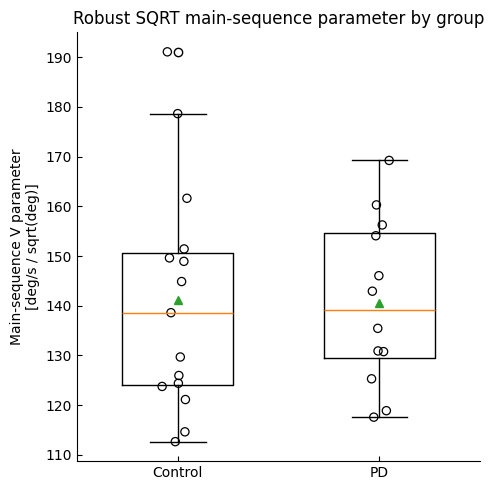

Saved figure to: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/pd_vs_control_V_sqrt_boxplot.png


,group,pred_peak_velocity_at_5deg_mean,pred_peak_velocity_at_5deg_std,pred_peak_velocity_at_5deg_median,pred_peak_velocity_at_5deg_min,pred_peak_velocity_at_5deg_max,pred_peak_velocity_at_10deg_mean,pred_peak_velocity_at_10deg_std,pred_peak_velocity_at_10deg_median,pred_peak_velocity_at_10deg_min,...,pred_peak_velocity_at_15deg_mean,pred_peak_velocity_at_15deg_std,pred_peak_velocity_at_15deg_median,pred_peak_velocity_at_15deg_min,pred_peak_velocity_at_15deg_max,pred_peak_velocity_at_20deg_mean,pred_peak_velocity_at_20deg_std,pred_peak_velocity_at_20deg_median,pred_peak_velocity_at_20deg_min,pred_peak_velocity_at_20deg_max
0,Control,315.605070,51.530530,309.937946,251.933374,427.273253,446.332970,72.875174,438.318446,356.287594,...,546.644016,89.253496,536.828269,436.361404,740.058983,631.210139,103.061060,619.875891,503.866748,854.546506
1,PD,314.502502,37.662858,311.252134,262.947911,378.424589,444.773703,53.263325,440.176990,371.864502,...,544.734312,65.233984,539.104511,455.439142,655.450616,629.005003,75.325717,622.504269,525.895823,756.849179


Saved predicted PV comparison to: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/pd_vs_control_predicted_peak_velocity_fixed_amplitudes.csv


,group,n_fit_count,n_fit_mean,n_fit_std,n_fit_median,n_fit_min,n_fit_max,r2_inlier_peak_le_1200_count,r2_inlier_peak_le_1200_mean,r2_inlier_peak_le_1200_std,...,n_peak_gt_1000_std,n_peak_gt_1000_median,n_peak_gt_1000_min,n_peak_gt_1000_max,n_peak_gt_2000_count,n_peak_gt_2000_mean,n_peak_gt_2000_std,n_peak_gt_2000_median,n_peak_gt_2000_min,n_peak_gt_2000_max
0,Control,15,2095.466667,621.000790,2064.0,784,3272,15,0.652321,0.111098,...,45.986333,7.0,0,182,15,4.066667,6.670475,1.0,0,25
1,PD,12,2639.666667,1625.315876,1730.5,1523,6710,12,0.702550,0.087039,...,134.461552,25.5,0,484,12,55.416667,129.909380,11.0,0,462


Saved fit-quality comparison to: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/pd_vs_control_fit_quality_summary.csv


,metric,n_PD,n_Control,PD_mean,Control_mean,PD_median,Control_median,PD_min,PD_max,Control_min,...,mannwhitney_p,cohen_d_PD_minus_Control,hedges_g_PD_minus_Control,cliffs_delta_PD_minus_Control,mean_diff_PD_minus_Control,mean_diff_95CI_low,mean_diff_95CI_high,median_diff_PD_minus_Control,median_diff_95CI_low,median_diff_95CI_high
0,V_sqrt,12,15,140.649794,141.142878,139.196186,138.608463,117.593881,169.236621,112.668030,...,0.788413,-0.023996,-0.023269,0.066667,-0.493083,-15.051008,13.600801,0.587723,-18.783079,25.473195
1,r2_inlier_peak_le_1200,12,15,0.702550,0.652321,0.705767,0.671610,0.564426,0.862939,0.320847,...,0.341349,0.496245,0.481207,0.222222,0.050229,-0.016551,0.125307,0.034157,-0.056806,0.098771
2,mae_inlier_peak_le_1200,12,15,59.271802,63.328791,53.238481,59.630778,43.510958,87.721760,36.278664,...,0.510068,-0.186897,-0.181234,-0.155556,-4.056989,-20.431129,9.850723,-6.392297,-15.023344,14.108075
3,n_fit,12,15,2639.666667,2095.466667,1730.500000,2064.000000,1523.000000,6710.000000,784.000000,...,0.826200,0.463542,0.449495,-0.055556,544.200000,-290.078750,1582.434167,-333.500000,-755.500000,1457.000000
4,n_peak_gt_1000,12,15,69.500000,23.800000,25.500000,7.000000,0.000000,484.000000,0.000000,...,0.447508,0.478032,0.463546,0.177778,45.700000,-15.150000,132.101250,18.500000,-11.000000,67.000000
5,n_peak_gt_2000,12,15,55.416667,4.066667,11.000000,1.000000,0.000000,462.000000,0.000000,...,0.141989,0.594903,0.576876,0.333333,51.350000,4.932917,129.366667,10.000000,-2.000000,46.000000


Saved all fit metric comparisons to: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/pd_vs_control_all_fit_metric_comparisons.csv
Found 27 raw subject saccade CSV files.


,subject_id,group,n_valid_saccades_raw,median_amplitude_deg,mean_amplitude_deg,median_peak_velocity_deg_s,mean_peak_velocity_deg_s,median_duration_ms,mean_duration_ms,n_peak_gt_1000_raw,n_peak_gt_2000_raw
0,p001,PD,1750,6.000468,7.709870,366.900292,379.885258,45.0,50.701143,7,3
1,p002,PD,1621,5.600381,7.305388,458.889376,2901.516428,84.0,87.913017,484,462
2,p003,PD,2120,5.377116,6.884303,298.546763,307.140783,54.0,56.809906,0,0
3,p004,PD,1627,4.458412,6.342308,256.154927,280.943939,52.0,55.468961,0,0
4,p005,PD,2898,4.563839,6.619985,318.933950,423.660671,48.0,57.808144,76,54


Saved raw subject-level saccade metrics to: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/subject_level_raw_saccade_metrics.csv


,metric,n_PD,n_Control,PD_mean,Control_mean,PD_median,Control_median,PD_min,PD_max,Control_min,...,mannwhitney_p,cohen_d_PD_minus_Control,hedges_g_PD_minus_Control,cliffs_delta_PD_minus_Control,mean_diff_PD_minus_Control,mean_diff_95CI_low,mean_diff_95CI_high,median_diff_PD_minus_Control,median_diff_95CI_low,median_diff_95CI_high
0,n_valid_saccades_raw,12,15,2639.666667,2095.466667,1730.500000,2064.000000,1523.000000,6710.000000,784.000000,...,0.826200,0.463542,0.449495,-0.055556,544.200000,-290.078750,1582.434167,-333.500000,-755.500000,1457.000000
1,median_amplitude_deg,12,15,5.401502,6.261488,5.618199,6.331666,4.458412,6.279019,4.031482,...,0.013734,-0.830085,-0.804931,-0.566667,-0.859987,-1.580342,-0.168466,-0.713467,-1.804311,-0.146514
2,mean_amplitude_deg,12,15,6.992982,7.826618,7.195002,7.905313,5.671656,7.933719,6.279945,...,0.010415,-0.982169,-0.952406,-0.588889,-0.833636,-1.430881,-0.246235,-0.710312,-1.429658,-0.212107
3,median_peak_velocity_deg_s,12,15,341.989447,371.490216,326.192016,370.535550,256.154927,458.889376,289.912043,...,0.393153,-0.445894,-0.432382,-0.200000,-29.500770,-77.376714,14.805396,-44.343534,-73.211441,32.685409
4,mean_peak_velocity_deg_s,12,15,591.073934,389.995800,370.131048,377.588103,280.943939,2901.516428,304.497734,...,0.826200,0.411523,0.399053,0.055556,201.078134,-51.922658,641.196731,-7.457054,-61.785285,82.489944
5,median_duration_ms,12,15,54.750000,49.200000,53.000000,51.000000,41.000000,84.000000,40.000000,...,0.163104,0.644365,0.624839,0.322222,5.550000,-0.666667,12.750000,2.000000,-1.500000,10.000000
6,mean_duration_ms,12,15,58.876644,52.830910,56.329573,53.171157,44.162796,87.913017,43.180599,...,0.179641,0.650773,0.631053,0.311111,6.045734,-0.742321,13.569282,3.158416,-1.542926,10.607161
7,n_peak_gt_1000_raw,12,15,69.500000,23.800000,25.500000,7.000000,0.000000,484.000000,0.000000,...,0.447508,0.478032,0.463546,0.177778,45.700000,-15.150000,132.101250,18.500000,-11.000000,67.000000
8,n_peak_gt_2000_raw,12,15,55.416667,4.066667,11.000000,1.000000,0.000000,462.000000,0.000000,...,0.141989,0.594903,0.576876,0.333333,51.350000,4.932917,129.366667,10.000000,-2.000000,46.000000


Saved raw saccade metric comparisons to: /content/drive/MyDrive/steer_search_PD/main_sequence_outputs/pd_vs_control_raw_saccade_metric_comparisons.csv

Done.


In [15]:
# ============================================================
# PD vs Control comparisons for robust SQRT main-sequence fits
# ============================================================

import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy import stats
from pathlib import Path
from pandas.errors import EmptyDataError

try:
    from IPython.display import display
except ImportError:
    display = print


OUT_DIR = Path("/content/drive/MyDrive/steer_search_PD/main_sequence_outputs")
summary_path = OUT_DIR / "robust_sqrt_main_sequence_fit_summary.csv"

# -------------------------
# Load summary table
# -------------------------
if "summary_df" not in globals():
    summary_df = pd.read_csv(summary_path)

summary_df = summary_df.copy()

if "subject_id" not in summary_df.columns:
    raise ValueError("summary_df must contain a 'subject_id' column.")

if "V_sqrt" not in summary_df.columns:
    raise ValueError("summary_df must contain a 'V_sqrt' column.")

# -------------------------
# Add group labels
# -------------------------
summary_df["subject_id"] = summary_df["subject_id"].astype(str)

summary_df["group"] = (
    summary_df["subject_id"]
    .str[0]
    .str.lower()
    .map({"p": "PD", "s": "Control"})
)

summary_df["V_sqrt"] = pd.to_numeric(summary_df["V_sqrt"], errors="coerce")

summary_df = summary_df.dropna(subset=["group", "V_sqrt"]).copy()

print("Subjects included in summary:")
print(summary_df["group"].value_counts())


# ============================================================
# Helper functions
# ============================================================

def safe_mean(x):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    return np.mean(x) if len(x) else np.nan


def safe_median(x):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    return np.median(x) if len(x) else np.nan


def cohen_d_independent(x, y):
    """
    Cohen's d for two independent groups.
    Positive means x > y.
    Here x = PD, y = Control.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    x = x[np.isfinite(x)]
    y = y[np.isfinite(y)]

    nx = len(x)
    ny = len(y)

    if nx < 2 or ny < 2:
        return np.nan

    sx = np.var(x, ddof=1)
    sy = np.var(y, ddof=1)

    pooled_sd = np.sqrt(((nx - 1) * sx + (ny - 1) * sy) / (nx + ny - 2))

    if pooled_sd == 0:
        return np.nan

    return (np.mean(x) - np.mean(y)) / pooled_sd


def hedges_g_from_d(d, nx, ny):
    """
    Small-sample corrected Cohen's d.
    """
    if not np.isfinite(d):
        return np.nan

    df = nx + ny - 2

    if df <= 0:
        return np.nan

    correction = 1 - (3 / (4 * df - 1))
    return d * correction


def cliffs_delta(x, y):
    """
    Cliff's delta.
    Positive means values in x tend to be larger than values in y.
    Range: -1 to +1.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    x = x[np.isfinite(x)]
    y = y[np.isfinite(y)]

    if len(x) == 0 or len(y) == 0:
        return np.nan

    greater = 0
    less = 0

    for xi in x:
        greater += np.sum(xi > y)
        less += np.sum(xi < y)

    return (greater - less) / (len(x) * len(y))


def bootstrap_diff_ci(x, y, statistic=np.mean, n_boot=10000, seed=42):
    """
    Bootstrap CI for difference:
        statistic(PD) - statistic(Control)
    """
    rng = np.random.default_rng(seed)

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    x = x[np.isfinite(x)]
    y = y[np.isfinite(y)]

    if len(x) == 0 or len(y) == 0:
        return np.nan, np.nan, np.nan

    diffs = []

    for _ in range(n_boot):
        xb = rng.choice(x, size=len(x), replace=True)
        yb = rng.choice(y, size=len(y), replace=True)
        diffs.append(statistic(xb) - statistic(yb))

    diffs = np.asarray(diffs)

    obs = statistic(x) - statistic(y)
    lo, hi = np.percentile(diffs, [2.5, 97.5])

    return obs, lo, hi


def compare_pd_control(df, metric_col, group_col="group", n_boot=10000, seed=42):
    """
    Compare PD vs Control for one subject-level metric.
    Returns summary statistics, tests, effect sizes, bootstrap CIs.
    """

    if metric_col not in df.columns:
        raise ValueError(f"Metric column not found: {metric_col}")

    temp = df[[group_col, metric_col]].copy()
    temp[metric_col] = pd.to_numeric(temp[metric_col], errors="coerce")
    temp = temp.dropna(subset=[group_col, metric_col])

    pd_vals = temp.loc[temp[group_col] == "PD", metric_col].values
    ctrl_vals = temp.loc[temp[group_col] == "Control", metric_col].values

    result = {
        "metric": metric_col,
        "n_PD": len(pd_vals),
        "n_Control": len(ctrl_vals),

        "PD_mean": safe_mean(pd_vals),
        "Control_mean": safe_mean(ctrl_vals),

        "PD_median": safe_median(pd_vals),
        "Control_median": safe_median(ctrl_vals),

        "PD_min": np.min(pd_vals) if len(pd_vals) else np.nan,
        "PD_max": np.max(pd_vals) if len(pd_vals) else np.nan,
        "Control_min": np.min(ctrl_vals) if len(ctrl_vals) else np.nan,
        "Control_max": np.max(ctrl_vals) if len(ctrl_vals) else np.nan,
    }

    # Welch t-test
    if len(pd_vals) >= 2 and len(ctrl_vals) >= 2:
        ttest = stats.ttest_ind(pd_vals, ctrl_vals, equal_var=False)
        result["welch_t"] = ttest.statistic
        result["welch_p"] = ttest.pvalue
    else:
        result["welch_t"] = np.nan
        result["welch_p"] = np.nan

    # Mann-Whitney U test
    if len(pd_vals) >= 1 and len(ctrl_vals) >= 1:
        mw = stats.mannwhitneyu(pd_vals, ctrl_vals, alternative="two-sided")
        result["mannwhitney_U"] = mw.statistic
        result["mannwhitney_p"] = mw.pvalue
    else:
        result["mannwhitney_U"] = np.nan
        result["mannwhitney_p"] = np.nan

    # Effect sizes
    d = cohen_d_independent(pd_vals, ctrl_vals)
    g = hedges_g_from_d(d, len(pd_vals), len(ctrl_vals))
    delta = cliffs_delta(pd_vals, ctrl_vals)

    result["cohen_d_PD_minus_Control"] = d
    result["hedges_g_PD_minus_Control"] = g
    result["cliffs_delta_PD_minus_Control"] = delta

    # Bootstrap CIs
    mean_diff, mean_lo, mean_hi = bootstrap_diff_ci(
        pd_vals,
        ctrl_vals,
        statistic=np.mean,
        n_boot=n_boot,
        seed=seed
    )

    median_diff, median_lo, median_hi = bootstrap_diff_ci(
        pd_vals,
        ctrl_vals,
        statistic=np.median,
        n_boot=n_boot,
        seed=seed
    )

    result["mean_diff_PD_minus_Control"] = mean_diff
    result["mean_diff_95CI_low"] = mean_lo
    result["mean_diff_95CI_high"] = mean_hi

    result["median_diff_PD_minus_Control"] = median_diff
    result["median_diff_95CI_low"] = median_lo
    result["median_diff_95CI_high"] = median_hi

    return result


def flatten_multiindex_columns(df):
    """
    Flattens MultiIndex columns after groupby aggregation.
    """
    if isinstance(df.columns, pd.MultiIndex):
        df = df.copy()
        df.columns = [
            "_".join([str(x) for x in col if str(x) != ""])
            for col in df.columns
        ]
    return df


# ============================================================
# 1. V range by group
# ============================================================

v_range_summary = (
    summary_df
    .groupby("group")["V_sqrt"]
    .agg(
        n_subjects="count",
        mean_V="mean",
        std_V="std",
        median_V="median",
        min_V="min",
        max_V="max",
        q25_V=lambda x: np.percentile(x, 25),
        q75_V=lambda x: np.percentile(x, 75),
    )
    .reset_index()
)

v_range_summary["range_V"] = v_range_summary["max_V"] - v_range_summary["min_V"]
v_range_summary["iqr_V"] = v_range_summary["q75_V"] - v_range_summary["q25_V"]

display(v_range_summary)

v_range_path = OUT_DIR / "pd_vs_control_V_sqrt_range_summary.csv"
v_range_summary.to_csv(v_range_path, index=False)

print(f"Saved V range summary to: {v_range_path}")


# ============================================================
# 2. Statistical comparison: PD vs Control for V_sqrt
# ============================================================

pd_v = summary_df.loc[summary_df["group"] == "PD", "V_sqrt"].dropna().values
ctrl_v = summary_df.loc[summary_df["group"] == "Control", "V_sqrt"].dropna().values

print("n PD:", len(pd_v))
print("n Control:", len(ctrl_v))

# Welch t-test
if len(pd_v) >= 2 and len(ctrl_v) >= 2:
    welch = stats.ttest_ind(pd_v, ctrl_v, equal_var=False)
    welch_t = welch.statistic
    welch_p = welch.pvalue
else:
    welch_t = np.nan
    welch_p = np.nan

# Mann-Whitney U test
if len(pd_v) >= 1 and len(ctrl_v) >= 1:
    mw = stats.mannwhitneyu(pd_v, ctrl_v, alternative="two-sided")
    mw_u = mw.statistic
    mw_p = mw.pvalue
else:
    mw_u = np.nan
    mw_p = np.nan

# Effect sizes
d = cohen_d_independent(pd_v, ctrl_v)
g = hedges_g_from_d(d, len(pd_v), len(ctrl_v))
delta = cliffs_delta(pd_v, ctrl_v)

# Bootstrap CIs
mean_diff, mean_lo, mean_hi = bootstrap_diff_ci(pd_v, ctrl_v, statistic=np.mean)
median_diff, median_lo, median_hi = bootstrap_diff_ci(pd_v, ctrl_v, statistic=np.median)

v_comparison = pd.DataFrame([{
    "metric": "V_sqrt",

    "n_PD": len(pd_v),
    "n_Control": len(ctrl_v),

    "PD_mean": safe_mean(pd_v),
    "Control_mean": safe_mean(ctrl_v),

    "PD_median": safe_median(pd_v),
    "Control_median": safe_median(ctrl_v),

    "mean_diff_PD_minus_Control": mean_diff,
    "mean_diff_95CI_low": mean_lo,
    "mean_diff_95CI_high": mean_hi,

    "median_diff_PD_minus_Control": median_diff,
    "median_diff_95CI_low": median_lo,
    "median_diff_95CI_high": median_hi,

    "welch_t": welch_t,
    "welch_p": welch_p,

    "mannwhitney_U": mw_u,
    "mannwhitney_p": mw_p,

    "cohen_d_PD_minus_Control": d,
    "hedges_g_PD_minus_Control": g,
    "cliffs_delta_PD_minus_Control": delta,
}])

display(v_comparison)

v_comp_path = OUT_DIR / "pd_vs_control_V_sqrt_statistical_comparison.csv"
v_comparison.to_csv(v_comp_path, index=False)

print(f"Saved V statistical comparison to: {v_comp_path}")


# ============================================================
# 3. Plot V_sqrt by group
# ============================================================

plot_df = summary_df.dropna(subset=["group", "V_sqrt"]).copy()

groups = ["Control", "PD"]
data = [
    plot_df.loc[plot_df["group"] == g, "V_sqrt"].values
    for g in groups
]

fig, ax = plt.subplots(figsize=(5, 5))

ax.boxplot(
    data,
    labels=groups,
    showmeans=True,
    widths=0.55
)

rng = np.random.default_rng(42)

for i, vals in enumerate(data, start=1):
    jitter = rng.normal(loc=i, scale=0.04, size=len(vals))
    ax.scatter(
        jitter,
        vals,
        s=35,
        facecolors="none",
        edgecolors="black",
        linewidths=0.9
    )

ax.set_ylabel("Main-sequence V parameter\n[deg/s / sqrt(deg)]")
ax.set_title("Robust SQRT main-sequence parameter by group")

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.tick_params(direction="in")

plt.tight_layout()

fig_path = OUT_DIR / "pd_vs_control_V_sqrt_boxplot.png"
fig.savefig(fig_path, dpi=300, bbox_inches="tight")

plt.show()

print(f"Saved figure to: {fig_path}")


# ============================================================
# 4. Predicted peak velocity at fixed amplitudes
# ============================================================

fixed_amps = [5, 10, 15, 20]

for A in fixed_amps:
    summary_df[f"pred_peak_velocity_at_{A}deg"] = summary_df["V_sqrt"] * np.sqrt(A)

pred_cols = [
    f"pred_peak_velocity_at_{A}deg"
    for A in fixed_amps
]

pred_summary = (
    summary_df
    .groupby("group")[pred_cols]
    .agg(["mean", "std", "median", "min", "max"])
)

pred_summary_flat = flatten_multiindex_columns(pred_summary.reset_index())

display(pred_summary_flat)

pred_path = OUT_DIR / "pd_vs_control_predicted_peak_velocity_fixed_amplitudes.csv"
pred_summary_flat.to_csv(pred_path, index=False)

print(f"Saved predicted PV comparison to: {pred_path}")


# ============================================================
# 5. Compare fit-quality metrics between PD and Control
# ============================================================

fit_quality_metrics = [
    "n_fit",
    "r2_inlier_peak_le_1200",
    "mae_inlier_peak_le_1200",
    "n_peak_gt_1000",
    "n_peak_gt_2000",
]

fit_quality_metrics = [
    c for c in fit_quality_metrics
    if c in summary_df.columns
]

fit_quality_summary = (
    summary_df
    .groupby("group")[fit_quality_metrics]
    .agg(["count", "mean", "std", "median", "min", "max"])
)

fit_quality_summary_flat = flatten_multiindex_columns(
    fit_quality_summary.reset_index()
)

display(fit_quality_summary_flat)

fit_quality_path = OUT_DIR / "pd_vs_control_fit_quality_summary.csv"
fit_quality_summary_flat.to_csv(fit_quality_path, index=False)

print(f"Saved fit-quality comparison to: {fit_quality_path}")


# ============================================================
# 6. Compare several main-sequence fit metrics
# ============================================================

metrics_to_compare = [
    "V_sqrt",
    "r2_inlier_peak_le_1200",
    "mae_inlier_peak_le_1200",
    "n_fit",
    "n_peak_gt_1000",
    "n_peak_gt_2000",
]

comparison_rows = []

for metric in metrics_to_compare:
    if metric in summary_df.columns:
        comparison_rows.append(compare_pd_control(summary_df, metric))

comparison_df = pd.DataFrame(comparison_rows)

display(comparison_df)

comparison_path = OUT_DIR / "pd_vs_control_all_fit_metric_comparisons.csv"
comparison_df.to_csv(comparison_path, index=False)

print(f"Saved all fit metric comparisons to: {comparison_path}")


# ============================================================
# 7. Build subject-level raw saccade metric table
# ============================================================

csv_files = sorted([
    p for p in OUT_DIR.glob("all_saccades_*.csv")
    if re.fullmatch(r"all_saccades_[ps]\d{3}\.csv", p.name)
])

print(f"Found {len(csv_files)} raw subject saccade CSV files.")

raw_rows = []

for csv_path in csv_files:

    subject_id = csv_path.stem.replace("all_saccades_", "")

    if csv_path.stat().st_size == 0:
        print(f"Skipping {subject_id}: empty CSV file.")
        continue

    try:
        df = pd.read_csv(csv_path)
    except EmptyDataError:
        print(f"Skipping {subject_id}: no columns to parse.")
        continue

    required_cols = [
        "amplitude_deg",
        "duration_ms",
        "peak_velocity_deg_s"
    ]

    missing_cols = [c for c in required_cols if c not in df.columns]

    if missing_cols:
        print(f"Skipping {subject_id}: missing columns {missing_cols}")
        continue

    # Same basic QC as fitting
    df = df[
        np.isfinite(df["amplitude_deg"]) &
        np.isfinite(df["duration_ms"]) &
        np.isfinite(df["peak_velocity_deg_s"]) &
        (df["amplitude_deg"] > 0) &
        (df["duration_ms"] > 0) &
        (df["peak_velocity_deg_s"] > 0) &
        (df["amplitude_deg"] <= 25)
    ].copy()

    if len(df) == 0:
        print(f"Skipping {subject_id}: no valid saccades after QC.")
        continue

    group = "PD" if subject_id.startswith("p") else "Control"

    raw_rows.append({
        "subject_id": subject_id,
        "group": group,

        "n_valid_saccades_raw": len(df),

        "median_amplitude_deg": df["amplitude_deg"].median(),
        "mean_amplitude_deg": df["amplitude_deg"].mean(),

        "median_peak_velocity_deg_s": df["peak_velocity_deg_s"].median(),
        "mean_peak_velocity_deg_s": df["peak_velocity_deg_s"].mean(),

        "median_duration_ms": df["duration_ms"].median(),
        "mean_duration_ms": df["duration_ms"].mean(),

        "n_peak_gt_1000_raw": int((df["peak_velocity_deg_s"] > 1000).sum()),
        "n_peak_gt_2000_raw": int((df["peak_velocity_deg_s"] > 2000).sum()),
    })

raw_subject_df = pd.DataFrame(raw_rows)

display(raw_subject_df.head())

raw_subject_path = OUT_DIR / "subject_level_raw_saccade_metrics.csv"
raw_subject_df.to_csv(raw_subject_path, index=False)

print(f"Saved raw subject-level saccade metrics to: {raw_subject_path}")


# ============================================================
# 8. PD vs Control comparisons for raw saccade metrics
# ============================================================

raw_metrics_to_compare = [
    "n_valid_saccades_raw",
    "median_amplitude_deg",
    "mean_amplitude_deg",
    "median_peak_velocity_deg_s",
    "mean_peak_velocity_deg_s",
    "median_duration_ms",
    "mean_duration_ms",
    "n_peak_gt_1000_raw",
    "n_peak_gt_2000_raw",
]

raw_comparison_rows = []

if len(raw_subject_df) > 0:
    for metric in raw_metrics_to_compare:
        if metric in raw_subject_df.columns:
            raw_comparison_rows.append(compare_pd_control(raw_subject_df, metric))

raw_comparison_df = pd.DataFrame(raw_comparison_rows)

display(raw_comparison_df)

raw_comparison_path = OUT_DIR / "pd_vs_control_raw_saccade_metric_comparisons.csv"
raw_comparison_df.to_csv(raw_comparison_path, index=False)

print(f"Saved raw saccade metric comparisons to: {raw_comparison_path}")


print("\nDone.")

In [ ]:
# # ============================================================
# # all main sequences per subject colored by calib session
# #Plot main sequence for ALL subjects
# # Color saccades by calibration session
# # Uses all_saccades_<SUBJECT_ID>.csv files
# # ============================================================

# import pandas as pd
# import matplotlib.pyplot as plt
# from pathlib import Path

# OUT_DIR = Path("/content/drive/MyDrive/steer_search_PD/main_sequence_outputs")

# SAVE_FIGURES = True

# if SAVE_FIGURES:
#     FIG_DIR = OUT_DIR / "main_sequence_figures_by_calib"
#     FIG_DIR.mkdir(exist_ok=True)

# csv_files = sorted(OUT_DIR.glob("all_saccades_*.csv"))

# print(f"Found {len(csv_files)} subjects.")

# for csv_path in csv_files:

#     SUBJECT_ID = csv_path.stem.replace("all_saccades_", "")

#     print(f"Plotting {SUBJECT_ID}")

#     df = pd.read_csv(csv_path)

#     # -------------------------
#     # QC
#     # -------------------------
#     df = df[
#         (df["amplitude_deg"] > 0) &
#         (df["duration_ms"] > 0) &
#         (df["peak_velocity_deg_s"] > 0) &
#         (df["amplitude_deg"] <= 25)
#     ].copy()

#     if len(df) == 0:
#         print(f"Skipping {SUBJECT_ID}: no valid saccades after QC.")
#         continue

#     # -------------------------
#     # Calibration session column
#     # -------------------------
#     if "calib_session_id" not in df.columns:
#         raise ValueError(
#             f"{csv_path.name} does not contain 'calib_session_id'. "
#             "Regenerate the saccade CSVs with calibration session saved."
#         )

#     df["calib_session_id"] = df["calib_session_id"].fillna("unknown")

#     sessions = sorted(df["calib_session_id"].unique())

#     cmap = plt.get_cmap("tab20")

#     color_map = {
#         session: cmap(i % cmap.N)
#         for i, session in enumerate(sessions)
#     }

#     fig, axes = plt.subplots(
#         2, 1,
#         figsize=(7, 7),
#         sharex=True
#     )

#     # -------------------------
#     # Amplitude vs Peak Velocity
#     # -------------------------
#     for session in sessions:
#         d = df[df["calib_session_id"] == session]

#         axes[0].scatter(
#             d["amplitude_deg"],
#             d["peak_velocity_deg_s"],
#             s=14,
#             facecolors="none",
#             edgecolors=[color_map[session]],
#             linewidths=0.8,
#             label=str(session),
#         )

#     axes[0].set_ylabel("Peak Velocity [deg/s]")
#     axes[0].set_ylim(0, 800)
#     axes[0].set_xlim(0, 25)

#     # -------------------------
#     # Amplitude vs Duration
#     # -------------------------
#     for session in sessions:
#         d = df[df["calib_session_id"] == session]

#         axes[1].scatter(
#             d["amplitude_deg"],
#             d["duration_ms"],
#             s=14,
#             facecolors="none",
#             edgecolors=[color_map[session]],
#             linewidths=0.8,
#         )

#     axes[1].set_xlabel("Amplitude [deg]")
#     axes[1].set_ylabel("Duration [ms]")
#     axes[1].set_ylim(0, 100)
#     axes[1].set_xlim(0, 25)

#     # -------------------------
#     # Formatting
#     # -------------------------
#     for ax in axes:
#         ax.spines["top"].set_visible(False)
#         ax.spines["right"].set_visible(False)
#         ax.tick_params(direction="in")
#         ax.set_xticks([0, 5, 10, 15, 20, 25])

#     axes[0].legend(
#         title="Calibration session",
#         fontsize=7,
#         title_fontsize=8,
#         loc="upper left",
#         bbox_to_anchor=(1.02, 1),
#         frameon=False,
#     )

#     fig.suptitle(f"{SUBJECT_ID} | Main Sequence by Calibration Session", y=0.98)

#     plt.tight_layout()

#     if SAVE_FIGURES:
#         fig.savefig(
#             FIG_DIR / f"{SUBJECT_ID}_main_sequence_by_calib.png",
#             dpi=300,
#             bbox_inches="tight"
#         )

#     plt.show()
#     plt.close(fig)

# print("\nDone.")

# if SAVE_FIGURES:
#     print(f"Figures saved to: {FIG_DIR}")

# df = pd.read_csv(
#     "/content/drive/MyDrive/steer_search_PD/main_sequence_outputs/all_saccades_p010.csv"
# )

# print(df["calib_session_id"].value_counts().sort_index())

# print(sorted(df["calib_session_id"].unique()))



In [ ]:
# #fitting curve for subject

# # ============================================================
# # Per-subject main sequence fitting using FIXED SQRT model
# # Based on Gibaldi & Sabatini 2020
# # ============================================================

# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# from sklearn.metrics import r2_score

# SUBJECT_ID = "s188"

# df = all_saccades_subject_df.copy()

# # -------------------------
# # Choose your column names
# # -------------------------
# amp_col = "amplitude_deg"
# vel_col = "peak_velocity_deg_s"   # change if needed
# dur_col = "duration_ms"

# print(df.columns)

# # -------------------------
# # Clean data
# # -------------------------
# df = df.replace([np.inf, -np.inf], np.nan)
# df = df.dropna(subset=[amp_col, vel_col, dur_col])

# df = df[
#     (df[amp_col] >= 1.0) &
#     (df[amp_col] <= 25.0) &
#     (df[vel_col] > 20) &
#     (df[vel_col] < 1200) &
#     (df[dur_col] > 5) &
#     (df[dur_col] < 150)
# ].copy()

# print("Saccades after filtering:", len(df))

# # -------------------------
# # Fixed SQRT model
# # Vpeak(A) = VA + V * sqrt(A - Ath)
# # -------------------------

# Ath = 1.0

# # Estimate VA from saccades near 1 deg
# near_1 = df[(df[amp_col] >= 0.75) & (df[amp_col] <= 1.25)]

# if len(near_1) >= 5:
#     VA = near_1[vel_col].median()
# else:
#     # fallback: use lowest 10% amplitudes
#     low_amp_cutoff = df[amp_col].quantile(0.10)
#     VA = df[df[amp_col] <= low_amp_cutoff][vel_col].median()

# print(f"Ath = {Ath:.2f} deg")
# print(f"VA  = {VA:.2f} deg/s")

# fit_df = df[df[amp_col] > Ath].copy()

# x = fit_df[amp_col].to_numpy()
# y = fit_df[vel_col].to_numpy()

# z = np.sqrt(x - Ath)

# # one-parameter least squares fit:
# # y - VA = V * z
# V_hat = np.sum(z * (y - VA)) / np.sum(z ** 2)

# y_pred = VA + V_hat * z
# r2 = r2_score(y, y_pred)

# print("\nFixed SQRT fit:")
# print(f"Subject = {SUBJECT_ID}")
# print(f"V       = {V_hat:.3f}")
# print(f"R²      = {r2:.3f}")

# # -------------------------
# # Bootstrap
# # -------------------------
# N_BOOT = 1000
# BOOT_SIZE = 50
# rng = np.random.default_rng(42)

# boot_results = []

# if len(fit_df) < BOOT_SIZE:
#     print(f"Warning: only {len(fit_df)} saccades available; using bootstrap size = {len(fit_df)}")
#     BOOT_SIZE = len(fit_df)

# for b in range(N_BOOT):
#     boot = fit_df.sample(
#         n=BOOT_SIZE,
#         replace=True,
#         random_state=int(rng.integers(0, 1_000_000))
#     )

#     xb = boot[amp_col].to_numpy()
#     yb = boot[vel_col].to_numpy()
#     zb = np.sqrt(xb - Ath)

#     Vb = np.sum(zb * (yb - VA)) / np.sum(zb ** 2)

#     yb_pred = VA + Vb * zb
#     r2b = r2_score(yb, yb_pred)

#     boot_results.append({
#         "subject_id": SUBJECT_ID,
#         "V": Vb,
#         "R2": r2b,
#         "n_saccades": BOOT_SIZE,
#         "Ath": Ath,
#         "VA": VA,
#     })

# boot_df = pd.DataFrame(boot_results)

# summary = {
#     "subject_id": SUBJECT_ID,
#     "n_saccades_total": len(df),
#     "n_saccades_fit": len(fit_df),
#     "Ath": Ath,
#     "VA": VA,
#     "V_full_fit": V_hat,
#     "R2_full_fit": r2,
#     "V_boot_median": boot_df["V"].median(),
#     "V_boot_mean": boot_df["V"].mean(),
#     "V_boot_sd": boot_df["V"].std(),
#     "V_boot_ci_low": boot_df["V"].quantile(0.025),
#     "V_boot_ci_high": boot_df["V"].quantile(0.975),
#     "R2_boot_median": boot_df["R2"].median(),
# }

# summary_df = pd.DataFrame([summary])

# display(summary_df)
# display(boot_df.head())

# # -------------------------
# # Plot fitted curve
# # -------------------------
# x_grid = np.linspace(Ath, df[amp_col].max(), 300)
# y_grid = VA + V_hat * np.sqrt(x_grid - Ath)

# plt.figure(figsize=(8, 6))
# plt.scatter(
#     df[amp_col],
#     df[vel_col],
#     facecolors="none",
#     edgecolors="black",
#     alpha=0.35
# )

# plt.plot(x_grid, y_grid, linewidth=3)

# plt.xlabel("Amplitude [deg]")
# plt.ylabel("Peak Velocity [deg/s]")
# plt.title(
#     f"{SUBJECT_ID} | FIXED SQRT main sequence\n"
#     f"V={V_hat:.2f}, R²={r2:.3f}, "
#     f"boot median V={summary['V_boot_median']:.2f}"
# )

# plt.tight_layout()
# plt.show()



In [ ]:


# # -------------------------
# # 6. Bulk loop over all subjects / blocks / trials
# # -------------------------

# all_saccades = []
# all_fixations = []
# all_trials = []
# failed_trials = []
# failed_blocks = []

# subject_dirs = sorted([
#     p for p in DATA_ROOT.iterdir()
#     if p.is_dir() and (p.name.startswith("p") or p.name.startswith("s"))
# ])

# print("Number of subject folders:", len(subject_dirs))
# print("First few:", [p.name for p in subject_dirs[:10]])

# # For debugging, uncomment:
# # subject_dirs = subject_dirs[:2]

# for subject_dir in subject_dirs:
#     subject_id = subject_dir.name
#     group = "PD" if subject_id.startswith("p") else "Control"

#     behav_dir = subject_dir / "behav"
#     eye_dir = subject_dir / "eye"

#     if not behav_dir.exists() or not eye_dir.exists():
#         failed_blocks.append({
#             "subject_id": subject_id,
#             "group": group,
#             "block_id": np.nan,
#             "reason": "missing_behav_or_eye_dir",
#         })
#         continue

#     behav_files = sorted(behav_dir.glob("*.json"))

#     print(f"\nSubject {subject_id} ({group}) | blocks: {len(behav_files)}")

#     for behav_path in behav_files:
#         block_id = behav_path.stem
#         edf_path = eye_dir / f"{block_id}.edf"

#         if not edf_path.exists():
#             failed_blocks.append({
#                 "subject_id": subject_id,
#                 "group": group,
#                 "block_id": block_id,
#                 "reason": f"missing_edf: {edf_path}",
#             })
#             continue

#         print(f"  Block {block_id}")

#         try:
#             behav = load_behav_json(behav_path)
#             samples, events, messages = read_edf_like_pyedfread(edf_path)
#             calib_params = build_calib_params(behav)
#             trials_df = parse_trials_from_messages(messages)

#         except Exception as e:
#             failed_blocks.append({
#                 "subject_id": subject_id,
#                 "group": group,
#                 "block_id": block_id,
#                 "reason": f"block_load_parse_calib_failed: {e}",
#             })
#             continue

#         for _, trial_row in trials_df.iterrows():
#             if trial_row["status"] != "ok":
#                 failed_trials.append({
#                     "subject_id": subject_id,
#                     "group": group,
#                     "block_id": block_id,
#                     "trial": trial_row.get("trial", np.nan),
#                     "image": trial_row.get("image", np.nan),
#                     "reason": trial_row["status"],
#                 })
#                 continue

#             try:
#                 saccade_rows, fixation_rows, trial_summary = process_one_trial_for_main_sequence(
#                     trial_row=trial_row,
#                     samples=samples,
#                     events=events,
#                     calib_params=calib_params,
#                     subject_id=subject_id,
#                     group=group,
#                     block_id=block_id,
#                     min_saccade_speed_deg_s=50.0,
#                 )

#                 all_saccades.extend(saccade_rows)
#                 all_fixations.extend(fixation_rows)
#                 all_trials.append(trial_summary)

#             except Exception as e:
#                 failed_trials.append({
#                     "subject_id": subject_id,
#                     "group": group,
#                     "block_id": block_id,
#                     "trial": trial_row.get("trial", np.nan),
#                     "image": trial_row.get("image", np.nan),
#                     "reason": str(e),
#                 })

# # -------------------------
# # 7. Create dataframes
# # -------------------------

# all_saccades_df = pd.DataFrame(all_saccades)
# all_fixations_df = pd.DataFrame(all_fixations)
# all_trials_df = pd.DataFrame(all_trials)
# failed_trials_df = pd.DataFrame(failed_trials)
# failed_blocks_df = pd.DataFrame(failed_blocks)

# print("\nDONE")
# print("Saccades:", len(all_saccades_df))
# print("Fixations:", len(all_fixations_df))
# print("Trials:", len(all_trials_df))
# print("Failed trials:", len(failed_trials_df))
# print("Failed blocks:", len(failed_blocks_df))

# display(all_saccades_df.head())
# display(all_trials_df.head())
# display(failed_trials_df.head())
# display(failed_blocks_df.head())

# # -------------------------
# # 8. Save outputs
# # -------------------------

# all_saccades_path = OUT_DIR / "all_saccades.csv"
# all_fixations_path = OUT_DIR / "all_fixations.csv"
# all_trials_path = OUT_DIR / "all_trials.csv"
# failed_trials_path = OUT_DIR / "failed_trials.csv"
# failed_blocks_path = OUT_DIR / "failed_blocks.csv"

# all_saccades_df.to_csv(all_saccades_path, index=False)
# all_fixations_df.to_csv(all_fixations_path, index=False)
# all_trials_df.to_csv(all_trials_path, index=False)
# failed_trials_df.to_csv(failed_trials_path, index=False)
# failed_blocks_df.to_csv(failed_blocks_path, index=False)

# print("\nSaved:")
# print(all_saccades_path)
# print(all_fixations_path)
# print(all_trials_path)
# print(failed_trials_path)
# print(failed_blocks_path)

# # -------------------------
# # 9. Quick subject-level summary
# # -------------------------

# if len(all_saccades_df) > 0:
#     subject_summary_df = (
#         all_saccades_df
#         .groupby(["subject_id", "group"])
#         .agg(
#             n_saccades=("amplitude_deg", "size"),
#             median_amp_deg=("amplitude_deg", "median"),
#             median_peak_velocity_deg_s=("peak_velocity_deg_s", "median"),
#             median_duration_ms=("duration_ms", "median"),
#             median_first_saccade_latency_ms=("first_saccade_latency_ms", "median"),
#             median_isi_ms=("inter_saccadic_interval_ms", "median"),
#         )
#         .reset_index()
#     )

#     subject_summary_path = OUT_DIR / "subject_summary.csv"
#     subject_summary_df.to_csv(subject_summary_path, index=False)

#     print("\nSubject summary:")
#     display(subject_summary_df.head())
#     print("Saved:", subject_summary_path)
# else:
#     print("No saccades found, skipping subject summary.")